In [1]:
import torch
from torch.utils.data import Dataset, DataLoader
import json
from torch.nn.utils.rnn import pad_sequence,pack_padded_sequence,pad_packed_sequence
import torch.nn as nn # for network layers
import math

# 1.dataset

In [2]:
class myDataset(Dataset):
    def __init__(self,file_content):
        # create synthetic dataset
        labels=[]
        self.features=[]
        for a in file_content:
            labels.append(int(file_content[a]['label']))
            feat = file_content[a]['features']
            features_temp = []
            for b in feat:
                maxx=max(feat[b])   #normalization
                minn=min(feat[b])
                feat_scale=[ (i-minn)/(maxx-minn) for i in feat[b] ]
                #print(max(feat_scale),min(feat_scale))
                features_temp.append(feat_scale) #25*n
            features_temp = torch.transpose(torch.FloatTensor(features_temp), 0, 1)  #n*25
            #features_temp=torch.Tensor(features_temp).transpose(0,1)
            self.features.append(features_temp)
        #self.label=
        self.onehot_labels = torch.zeros(len(labels), 2).scatter_(1, torch.tensor(labels).unsqueeze(1), 1)

    def __len__(self):
        return len(self.onehot_labels)#,len(self.features[0]),len(self.features[0][0])

    def __getitem__(self, index):
        return self.onehot_labels[index], self.features[index]


# 2.model

In [3]:

class MyModel_LSTM(nn.Module):

    def __init__(self,input_size=25,output_size=2):
        super(MyModel_LSTM, self).__init__()  # father class: torch.nn.Module
        drop_prob = 0.5  # dropout
        self.lstm = nn.LSTM(         # 56706
            input_size=input_size,
            hidden_size=64,         # rnn hidden unit
            num_layers=2,           # number of rnn layer
            batch_first=True,       # input & output will has batch size as 1s dimension. e.g. (batch, time_step, input_size)
            dropout=drop_prob,            #wx: x and hidden layer
            bidirectional=True
            
        )
        for name, param in self.lstm.named_parameters():
            nn.init.uniform_(param, -0.1, 0.1)
            
        self.fc = nn.Linear(64*2, output_size)  #has ten output num
        
        #self.sigm = nn.Sigmoid()
        self.dropout = nn.Dropout(0.4) #drop_prob

    def forward(self, features_datas):
        # forward pass (with sigmoid activations) will be called on self()
        lstm_out, _ = self.lstm(features_datas, None) # None represents zero initial hidden state
        output_padded, output_lengths = pad_packed_sequence(lstm_out, batch_first=True) #, enforce_sorted=False )
        
        out1, out2 = torch.chunk(output_padded, 2, dim=2)
        
        out1=out1[range(len(output_lengths)),output_lengths-1]
        out2=out2[range(len(output_lengths)),0]
        out_cat = torch.cat((out1, out2), 1)
        
        output= self.dropout(out_cat)
        out = self.fc( output )
        #sigm_out=self.sigm(out)
        return out #sigm_out

In [4]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [5]:
def check_val_accuracy(loader, model, criterion):
    losses = []
    num_correct = 0
    num_samples = 0
    model.eval()

    with torch.no_grad():
        for x,y,l in loader:
            x=x.to(device)
            y=y.to(device)
            pack_features = pack_padded_sequence(x, l, batch_first=True, enforce_sorted=False)
            scores = model(pack_features)
            loss = criterion(scores, y)
            losses.append(loss.item())
            _, predictions = scores.max(1)  # max out of those 10 digits
            #_,y= y.max(1)
            num_correct += (predictions == y).sum()
            num_samples += predictions.size(0)  # 64 -> batch size


    mean_loss = sum(losses) / len(losses)
    accuracy = float(num_correct) / float(num_samples) * 100
    print(f'Validation loss: {mean_loss:.5f}, accuracy: {accuracy :.2f}' )
    model.train()
    return mean_loss, accuracy

In [6]:
import matplotlib.pyplot as plt

def draw_plot(num_epochs,train_loss,val_loss,test_loss,train_accuracy,val_accuracy,test_accuracy):
    #epochs = range(1, num_epochs + 1)
    epochs = range(len(train_loss))

    # Plotting loss
    plt.figure(figsize=(9, 3))
    plt.plot(epochs, train_loss, 'b', label='Training loss',linewidth = 0.5,marker='o', markerfacecolor='blue',markersize=0.6)
    plt.plot(epochs, val_loss, 'r', label='Validation loss',linewidth = 0.5,marker='o', markerfacecolor='red',markersize=0.6)
    plt.plot(epochs, test_loss, 'g', label='Test loss',linewidth = 0.5,marker='o', markerfacecolor='green',markersize=0.6)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.xticks(range(1, num_epochs + 2, 20))
    plt.show()
    
    # Plotting accuracy
    plt.figure(figsize=(9, 3))
    plt.plot(epochs, train_accuracy, 'b', label='Training accuracy',linewidth = 0.5,marker='o', markerfacecolor='blue',markersize=0.6)
    plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy',linewidth = 0.5,marker='o', markerfacecolor='red',markersize=0.6)
    plt.plot(epochs, test_accuracy, 'g', label='Test accuracy',linewidth = 0.5,marker='o', markerfacecolor='green',markersize=0.6)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.xticks(range(1, num_epochs + 2,20))
    plt.show()
    

# 3.training

### 1).data

In [7]:
filepath = 'new_lld/lld_val_list.json'
with open(filepath, 'r') as f:
    file_data = json.load(f)
f.close()
val_data=myDataset(file_data)
print('val and test data:',len(val_data))

filepath = 'new_lld/lld_test_balanced_list.json' 
with open(filepath, 'r') as f:
    file_data = json.load(f)
f.close()
test_data=myDataset(file_data)
print('test data:',len(test_data))

filepath = 'new_lld/lld_train_list.json'
with open(filepath, 'r') as f:
    train_file_data = json.load(f)
f.close()
train_data=myDataset(train_file_data)
print('train data:',len(train_data))

val and test data: 1435
test data: 994
train data: 11481


In [10]:
train_data.onehot_labels=torch.tensor([torch.argmax(i).to(torch.int64) for i in train_data.onehot_labels])
test_data.onehot_labels=torch.tensor([torch.argmax(i).to(torch.int64) for i in test_data.onehot_labels])
val_data.onehot_labels=torch.tensor([torch.argmax(i).to(torch.int64) for i in val_data.onehot_labels])
#train2_data.onehot_labels=torch.tensor([torch.argmax(i).to(torch.int64) for i in train2_data.onehot_labels])

In [11]:
import copy 
train_data_over=copy.deepcopy(train_data)

In [11]:
def check_ratio(label_data):
    num0=0
    num1=0
    for i in label_data:
        if i==0:
            num0+=1
        else:
            num1+=1
    print('class0:',num0/len(label_data), 'class1:',num1/len(label_data),num0,num1 )

In [12]:
check_ratio(train_data.onehot_labels)
check_ratio(test_data.onehot_labels)
check_ratio(val_data.onehot_labels)
#check_ratio(train_data_over.onehot_labels)

class0: 0.6682344743489244 class1: 0.3317655256510757 7672 3809
class0: 0.5 class1: 0.5 497 497
class0: 0.697560975609756 class1: 0.3024390243902439 1001 434


In [15]:
#check_ratio(train2_data.onehot_labels)

In [16]:
class1_list=[]
for i in range(len(train_data)): #len(train_data) 7672-4025
    if train_data.onehot_labels[i]==1:
        train_data_over.features.append(train_data.features[i])
        class1_list.append(train_data.onehot_labels[i])

class1_list=torch.tensor(class1_list)
train_data_over.onehot_labels=torch.cat(( train_data.onehot_labels , class1_list),0)

In [17]:
print(len(train_data_over.features),len(train_data_over.onehot_labels))

15290 15290


In [18]:
print(len(train_data.features),len(train_data.onehot_labels))

11481 11481


In [19]:
check_ratio(train_data_over.onehot_labels)

class0: 0.5017658600392413 class1: 0.49823413996075866 7672 7618


### 2).hyper-parameters

In [13]:
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")

In [14]:
learning_rate = 0.004 #8 #0.0000001 #0.00000001
batch_size = 64
epochs = 180
gradient_accumulation_steps=1

In [15]:
print(torch.cuda.is_available())

True


In [16]:
def collate(batch):  #to padding the features data
    labels=[]
    features_all=[]
    features_length=[]
    for i in batch:
        labels.append(i[0]) #(label)
        features_all.append(i[1]) #(features)
        features_length.append(len(i[1])) #(torch.LongTensor(len(features)))
    pad_features = pad_sequence(features_all, batch_first=True, padding_value=0)
    batch_of_labels=torch.stack(labels)
    batch_of_lengths=torch.Tensor(features_length)
    return pad_features,batch_of_labels,batch_of_lengths

In [17]:
train_loader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, drop_last=True, collate_fn=collate)  # dataloader to batch
val_loader = DataLoader(dataset=val_data, batch_size=batch_size, shuffle=True, drop_last=True, collate_fn=collate)
test_loader= DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True , drop_last=True, collate_fn=collate)

### 3).training loop

In [18]:
torch.cuda.empty_cache()

In [19]:
def train(mymodel, train_loader, val_loader, test_loader,learning_rate, num_epochs,save_name):
    print('count_parameters:', count_parameters(mymodel))
    # Loss and optimizer
    #criterion = nn.CrossEntropyLoss()  # loss function nn.BCEWithLogitsLoss
    criterion = nn.CrossEntropyLoss()#nn.BCELoss() #nn.BCEWithLogitsLoss()

    print(len(train_loader))
    train_loss_list=[]
    train_accuracy_list=[]
    val_loss_list=[]
    val_accuracy_list=[]
    test_loss_list=[]
    test_accuracy_list=[]
    for epoch in range(num_epochs):
        len_train = len(train_loader)
        if learning_rate > 0.0005:
            if epoch % 8 == 0:
                learning_rate = learning_rate / 2  # 0.01
                print(epoch, learning_rate)
        elif learning_rate > 0.0001:
            if epoch % 15 == 0 and epoch != 30:  # or epoch == 30 and epoch != 40:
                learning_rate = learning_rate / 1.5  # 0.01
                print(epoch, learning_rate)
        elif learning_rate > 0.000005:
            if epoch % 15 == 0:
                print('2__')
                learning_rate = learning_rate / 2
                print(epoch, learning_rate)
            else:
                pass
        elif learning_rate > 0.000001:
            if epoch % 15 == 0:
                print('3__')
                learning_rate = 0.0001
                print(epoch, learning_rate)
            else:
                pass
        else:
            if epoch % 10 == 0:
                learning_rate = learning_rate 
                print(epoch, learning_rate)
            else:
                pass

        print()
        print('-------epoch:------------',epoch,' learning_rate',learning_rate)
        losses = []
        num_correct = 0
        num_samples = 0
        num_batch = 0
        for features_datas,labels,lengths in train_loader:
            features_datas=features_datas.to(device)
            labels=labels.to(device)
            optimizer = torch.optim.AdamW(mymodel.parameters(), lr=learning_rate)
            #mymodel, optimizer = amp.initialize(mymodel, optimizer, opt_level="O1")
            print(len_train)
            len_train -= 1
            optimizer.zero_grad(set_to_none=True)

            #remove padding
            pack_features = pack_padded_sequence(features_datas, lengths, batch_first=True, enforce_sorted=False)
            # forward
            prediction = mymodel(pack_features) #type <class 'torch.Tensor'>
            loss = criterion(prediction, labels)
            
            loss.backward() # compute gradients
            optimizer.step()

            losses.append(loss.item())
            #print(prediction[1],targets[1])
            _, predictions_index = prediction.max(1)  # max out of those 10 digits
            #_, targets_index= labels.max(1)
            num_correct += (predictions_index == labels).sum()#targets_index).sum()
            num_samples += predictions_index.size(0)  # 64 -> batch size
            mean_loss = sum(losses) / len(losses)
            accuracy = float(num_correct) / float(num_samples) * 100
            if len_train%500 ==0:
                print('predictions[:10],',prediction[:10])
                print(predictions_index,'\n',labels)#targets_index)
                print(num_correct,num_samples)
                print('now loss: ', loss)
                print(f'Training loss: {mean_loss:.5f}, accuracy: {accuracy:.2f}' )
        print('---------------val:')
        val_loss, val_accuracy=check_val_accuracy(val_loader, mymodel, criterion)
        test_loss, test_accuracy=check_val_accuracy(test_loader, mymodel, criterion)
        
        
        val_loss_list.append(val_loss)
        val_accuracy_list.append(val_accuracy)
        test_loss_list.append(test_loss)
        test_accuracy_list.append(test_accuracy)
        train_loss_list.append(mean_loss)
        train_accuracy_list.append(accuracy)
        draw_plot(num_epochs,train_loss_list,val_loss_list,test_loss_list,train_accuracy_list,val_accuracy_list,test_accuracy_list)
    return mymodel, optimizer  

count_parameters: 154370
179
0 0.002

-------epoch:------------ 0  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2316, -0.2574],
        [ 0.1296, -0.2945],
        [ 0.2690, -0.2686],
        [ 0.2807, -0.2535],
        [ 0.4599, -0.3781],
        [ 0.2418, -0.2364],
        [ 0.1888, -0.2598],
        [ 0.3095, -0.2791],
        [ 0.3743, -0.4722],
        [ 0.1490, -0.2457]], device

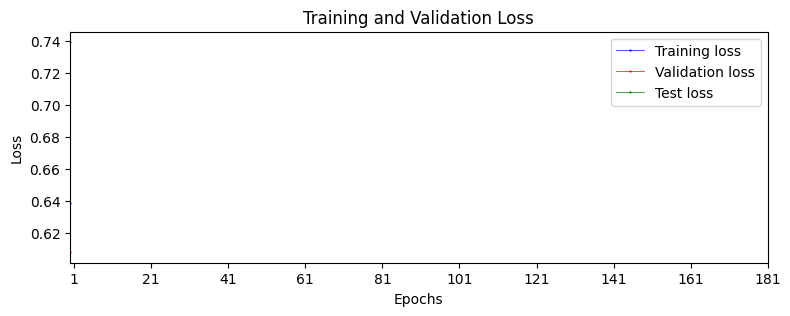

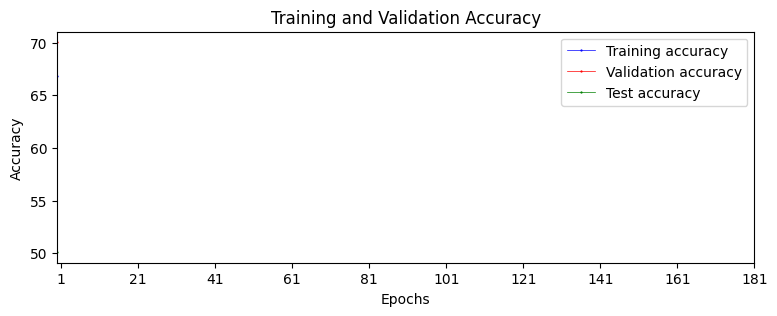


-------epoch:------------ 1  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3222, -0.4354],
        [ 0.2181, -0.3863],
        [ 0.6918, -0.6336],
        [ 0.4306, -0.4535],
        [ 0.7614, -0.6272],
        [ 0.7557, -0.7877],
        [ 0.5902, -0.5869],
        [ 0.5433, -0.5781],
        [ 0.4592, -0.6745],
        [ 0.5310, -0.5854]], device='cuda:2', grad_fn=<SliceBackward0>)


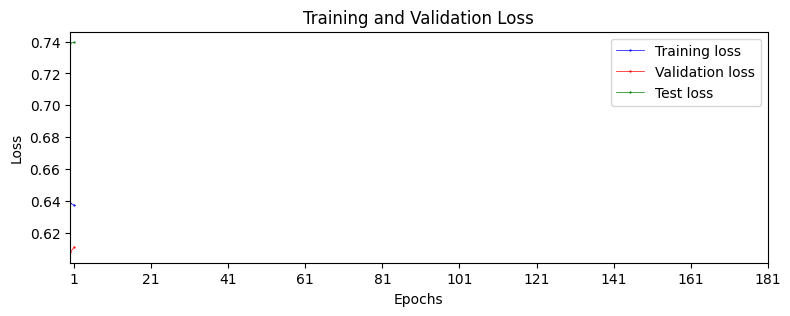

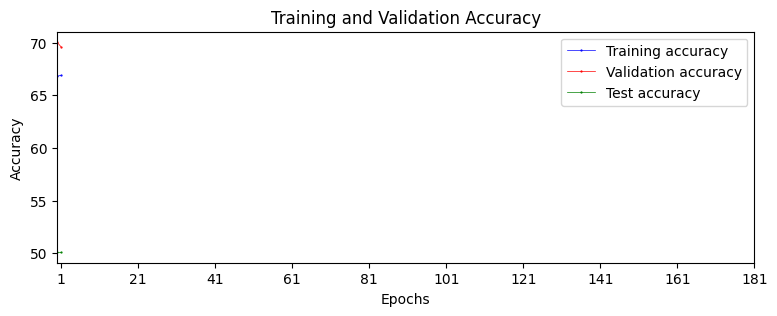


-------epoch:------------ 2  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2785, -0.2378],
        [ 0.3515, -0.3270],
        [ 0.0831, -0.1591],
        [ 0.1508, -0.2088],
        [ 0.2520, -0.2995],
        [ 0.3210, -0.2959],
        [ 0.2873, -0.3195],
        [ 0.2842, -0.2476],
        [ 0.1751, -0.2833],
        [ 0.1904, -0.2708]], device='cuda:2', grad_fn=<SliceBackward0>)


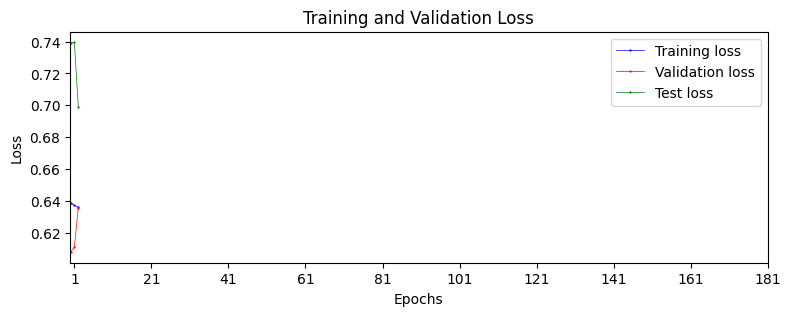

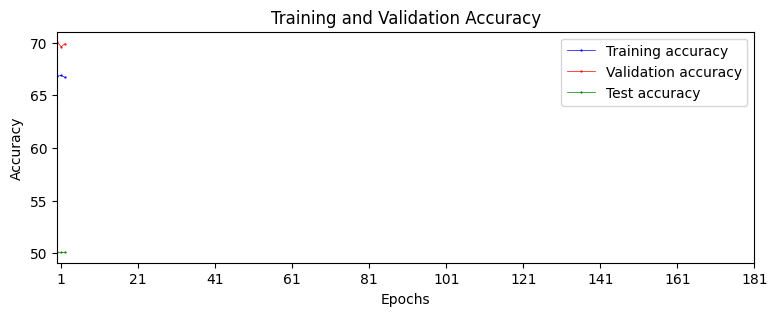


-------epoch:------------ 3  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2525, -0.3285],
        [ 0.0721, -0.2042],
        [ 0.4902, -0.6626],
        [ 0.1173, -0.1405],
        [ 0.5329, -0.6065],
        [-0.0506, -0.1045],
        [ 0.4139, -0.4409],
        [ 0.1881, -0.2410],
        [ 0.4772, -0.4920],
        [ 0.0302, -0.0756]], device='cuda:2', grad_fn=<SliceBackward0>)


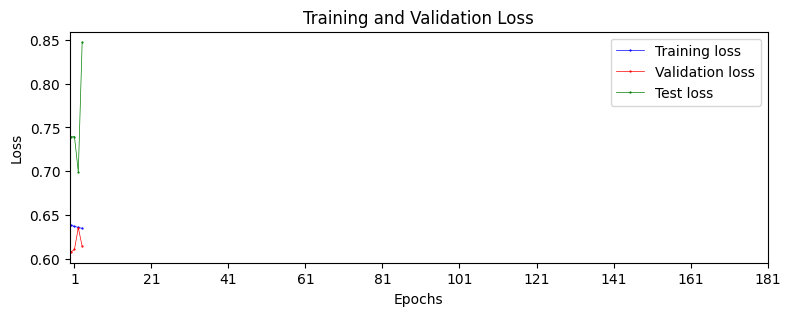

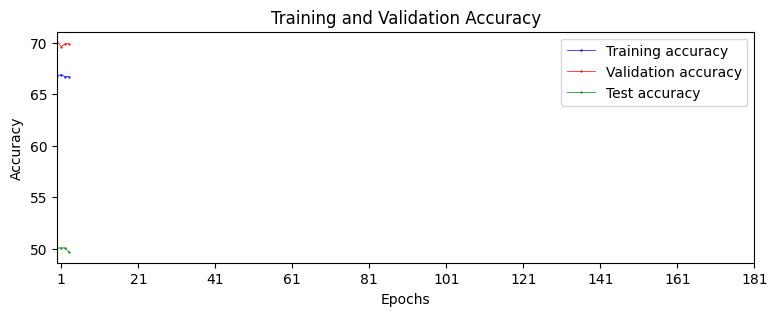


-------epoch:------------ 4  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4529, -0.3100],
        [ 0.3593, -0.2471],
        [ 0.2402, -0.1080],
        [ 0.3422, -0.2191],
        [ 0.2340, -0.1796],
        [ 0.3393, -0.2224],
        [ 0.3718, -0.3712],
        [ 0.2992, -0.1857],
        [ 0.5177, -0.3794],
        [ 0.4515, -0.2730]], device='cuda:2', grad_fn=<SliceBackward0>)


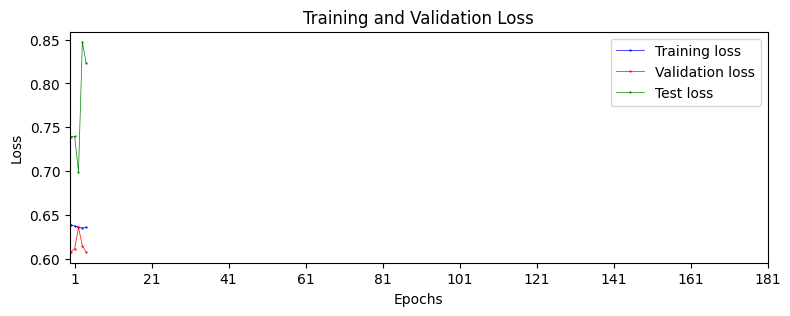

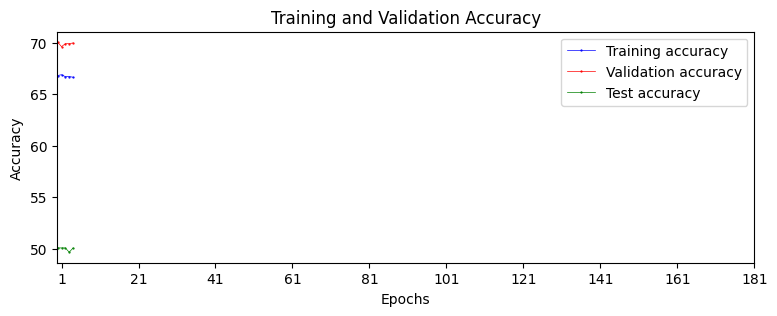


-------epoch:------------ 5  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1007, -0.1811],
        [ 0.0955, -0.0385],
        [ 0.1514,  0.0270],
        [ 0.1489, -0.0967],
        [ 0.2328, -0.2063],
        [ 0.4647, -0.1402],
        [ 0.0929,  0.0058],
        [ 0.1665, -0.0126],
        [ 0.1692, -0.2008],
        [ 0.4276, -0.2516]], device='cuda:2', grad_fn=<SliceBackward0>)


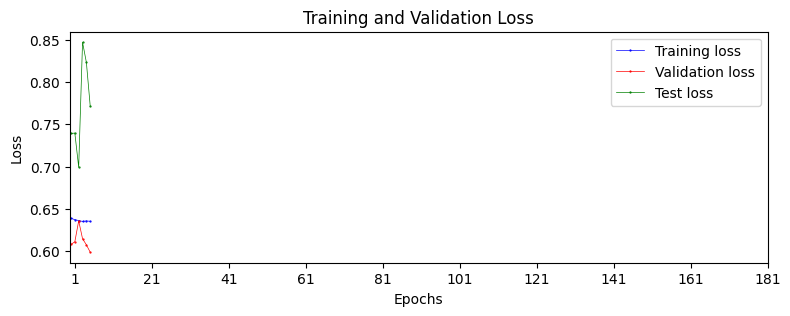

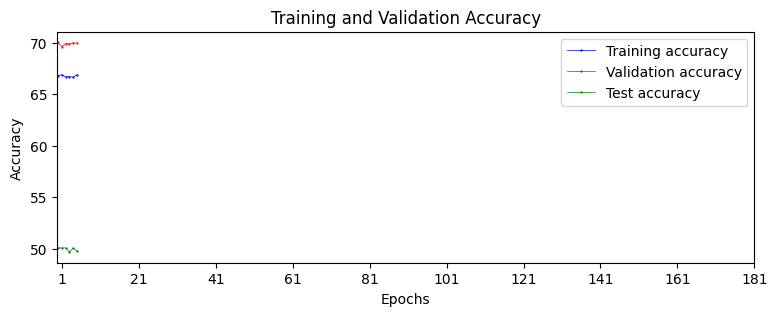


-------epoch:------------ 6  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6120, -0.3932],
        [ 0.1421, -0.0455],
        [ 0.6410, -0.3518],
        [ 0.4406, -0.3050],
        [ 0.3909, -0.1448],
        [ 0.4812, -0.1867],
        [ 0.1613, -0.0037],
        [ 0.3722, -0.4482],
        [ 0.4694, -0.1786],
        [ 0.2847, -0.1396]], device='cuda:2', grad_fn=<SliceBackward0>)


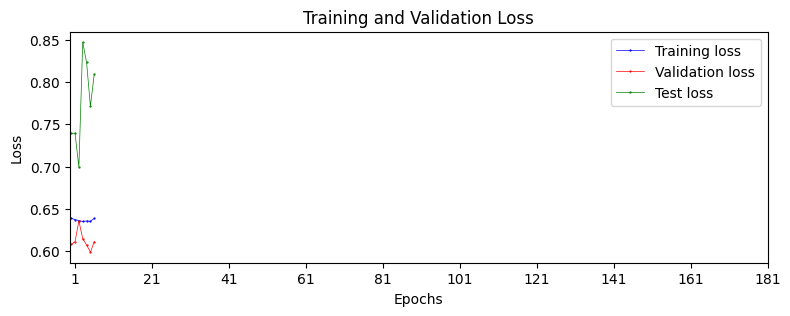

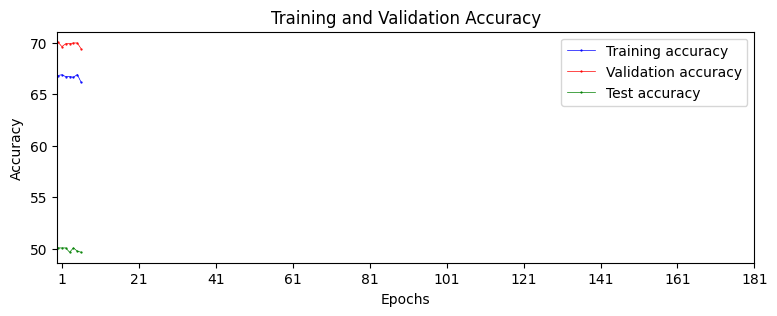


-------epoch:------------ 7  learning_rate 0.002
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4740, -0.2636],
        [ 0.5743, -0.3817],
        [ 0.5778, -0.2257],
        [ 0.5447, -0.3459],
        [ 0.8407, -0.3749],
        [ 0.5512, -0.3738],
        [ 0.7909, -0.8205],
        [ 0.7967, -0.4890],
        [ 0.2972, -0.0381],
        [ 0.9119, -0.4367]], device='cuda:2', grad_fn=<SliceBackward0>)


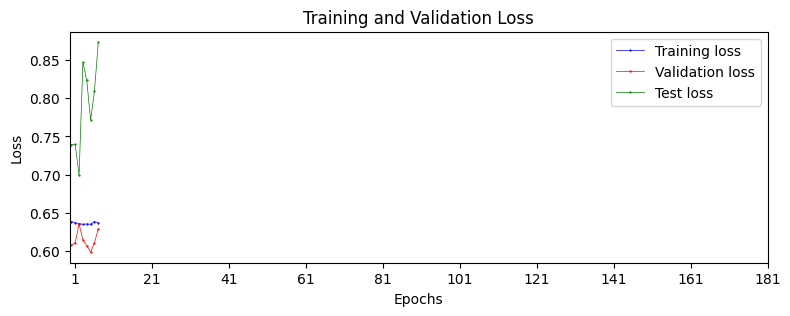

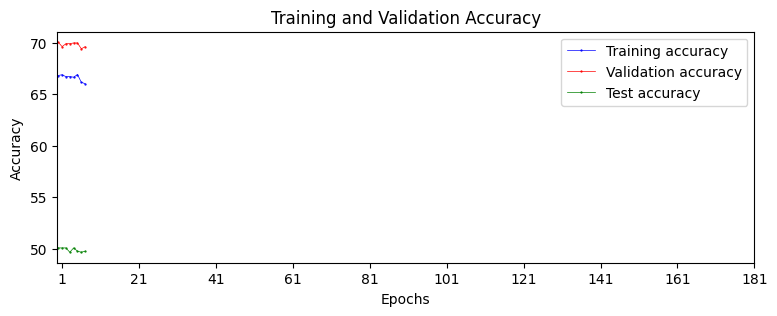

8 0.001

-------epoch:------------ 8  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.1028, -0.6182],
        [ 0.5003, -0.3715],
        [ 0.9222, -0.5560],
        [ 0.7009, -0.5545],
        [ 0.1161, -0.1296],
        [ 0.2889, -0.1790],
        [ 1.1312, -0.6885],
        [ 0.8321, -0.7200],
        [ 0.6404, -0.4526],
        [ 0.9141, -0.5054]], device='cuda:2', grad_fn=<SliceBack

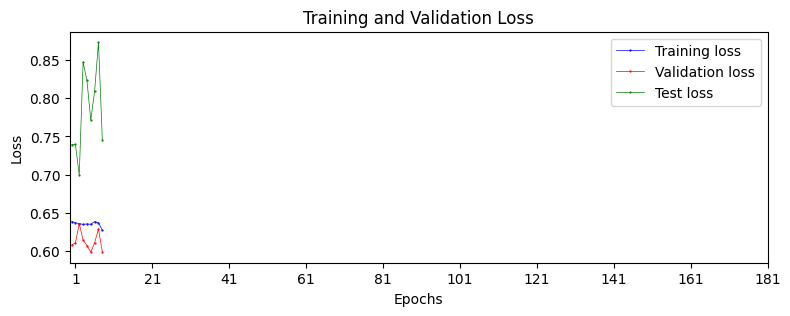

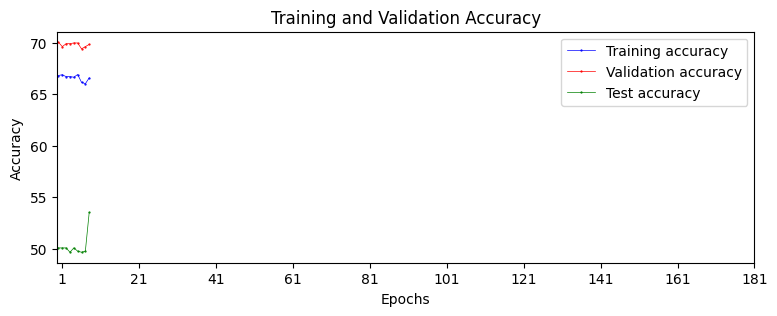


-------epoch:------------ 9  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5819, -0.3775],
        [-0.0472,  0.0369],
        [ 0.0813, -0.1208],
        [ 0.4343, -0.4952],
        [ 0.3890, -0.5346],
        [ 0.0967, -0.0831],
        [ 0.5505, -0.4450],
        [ 0.5662, -0.3844],
        [ 0.6584, -0.6855],
        [ 0.5689, -0.7162]], device='cuda:2', grad_fn=<SliceBackward0>)


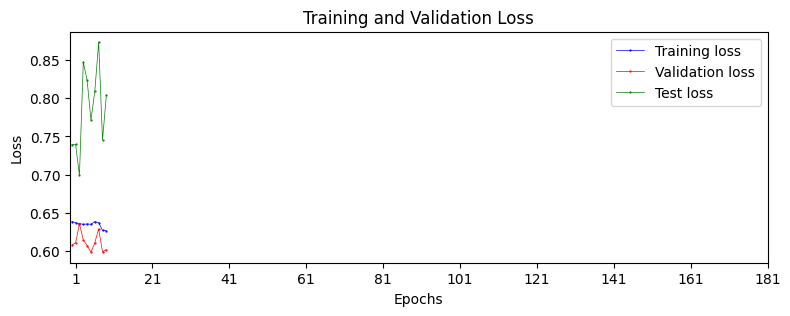

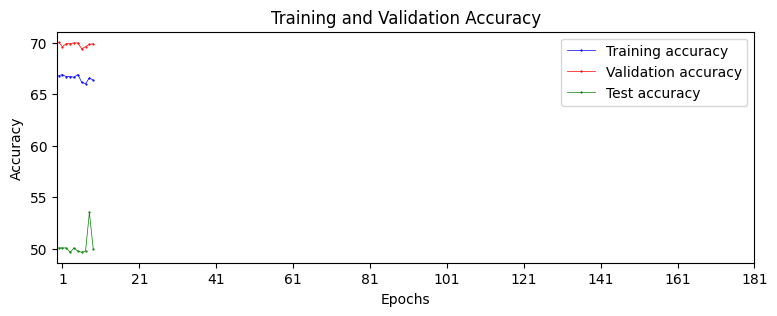


-------epoch:------------ 10  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5270, -0.3470],
        [ 0.2184, -0.1073],
        [ 0.3290, -0.2998],
        [ 0.1991, -0.2127],
        [ 0.2503, -0.1725],
        [ 0.3378, -0.2660],
        [ 0.0293, -0.0691],
        [ 0.1070,  0.1060],
        [ 0.3791, -0.2319],
        [ 0.3597, -0.2413]], device='cuda:2', grad_fn=<SliceBackward0>)

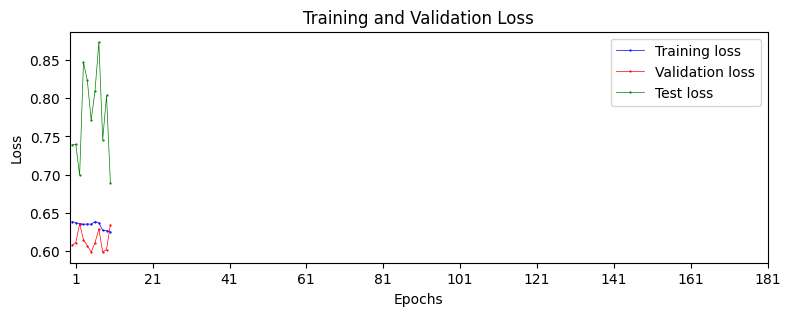

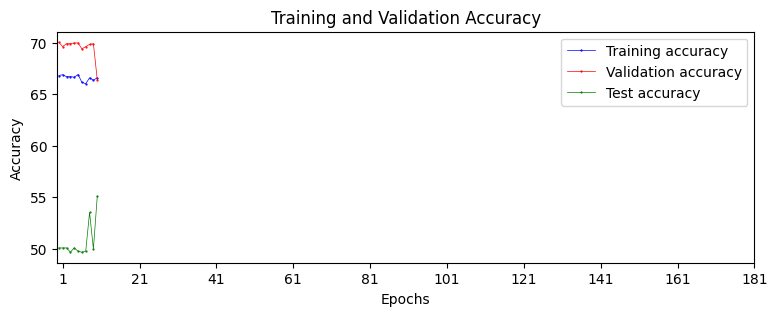


-------epoch:------------ 11  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3770, -0.1032],
        [ 0.6006, -0.4186],
        [-0.1469,  0.3553],
        [ 0.3684, -0.2911],
        [ 0.1145, -0.1109],
        [ 0.3250, -0.3434],
        [ 0.5238, -0.4600],
        [ 0.1197, -0.2254],
        [ 0.6740, -0.2459],
        [ 0.4006, -0.2513]], device='cuda:2', grad_fn=<SliceBackward0>)

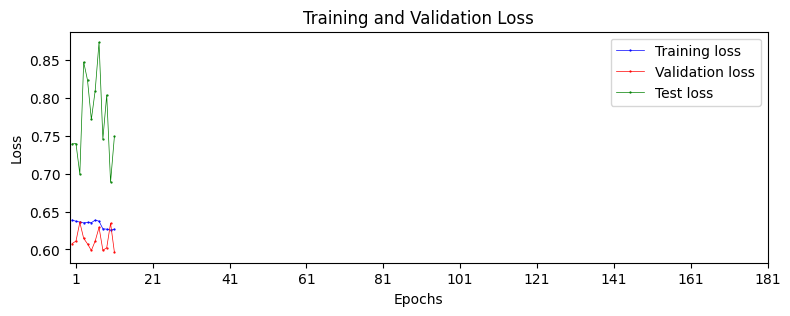

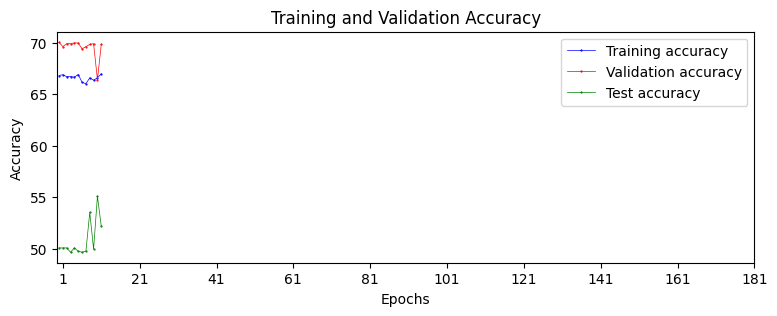


-------epoch:------------ 12  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5202, -0.8253],
        [ 0.1277,  0.0878],
        [ 0.3997, -0.2833],
        [ 0.4360, -0.5853],
        [ 0.8059, -0.6570],
        [ 0.0481, -0.1223],
        [ 0.0375, -0.0455],
        [ 0.7232, -0.5943],
        [ 0.2272, -0.2304],
        [ 0.2413, -0.0832]], device='cuda:2', grad_fn=<SliceBackward0>)

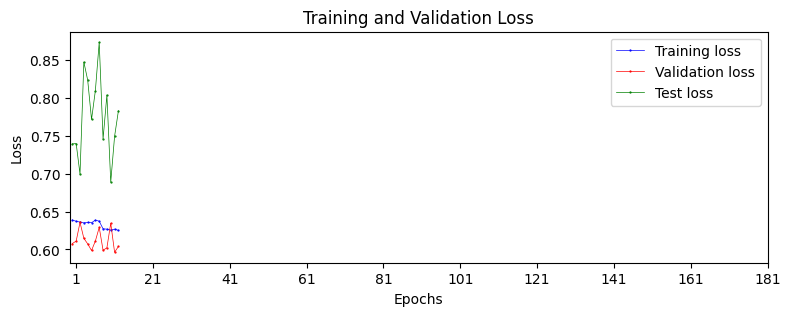

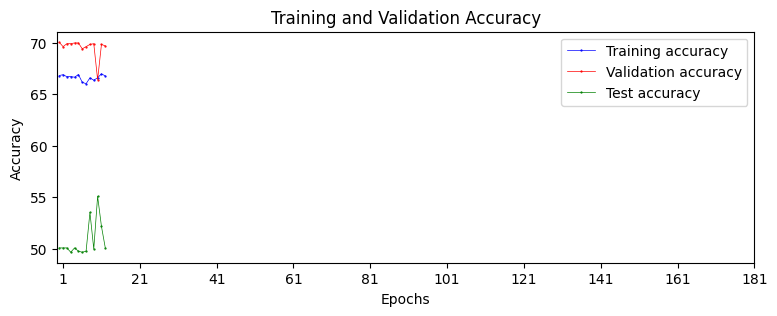


-------epoch:------------ 13  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5256, -0.4103],
        [ 0.4082, -0.3084],
        [ 0.3135, -0.3336],
        [ 0.6826, -0.7536],
        [ 0.1967, -0.3369],
        [ 0.0763, -0.3927],
        [ 0.5967, -0.7464],
        [ 0.2244, -0.5264],
        [ 0.0456, -0.4301],
        [ 0.0312, -0.2986]], device='cuda:2', grad_fn=<SliceBackward0>)

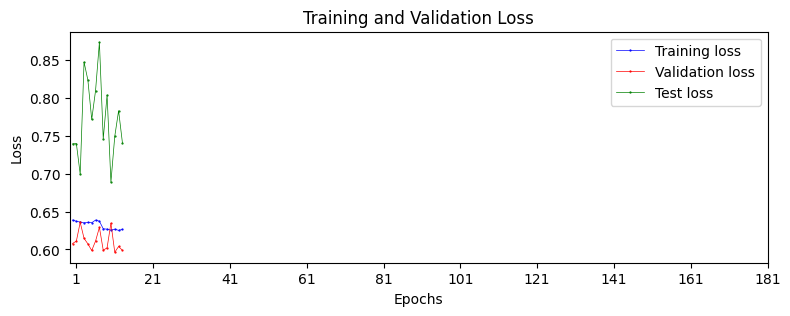

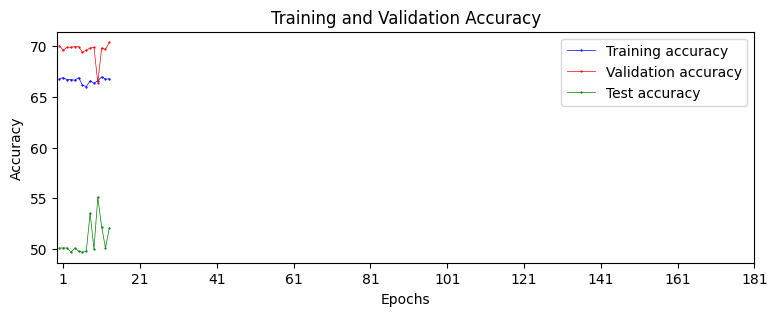


-------epoch:------------ 14  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2853, -0.2906],
        [ 0.4267, -0.4224],
        [-0.0251, -0.1137],
        [ 0.4591, -0.3633],
        [ 0.6864, -0.6249],
        [ 0.1270,  0.1189],
        [ 0.1684,  0.0329],
        [ 0.3478,  0.0457],
        [ 0.6016, -0.3479],
        [ 0.2044,  0.0178]], device='cuda:2', grad_fn=<SliceBackward0>)

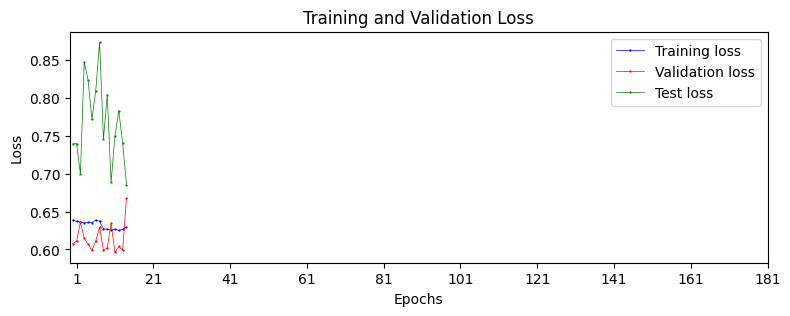

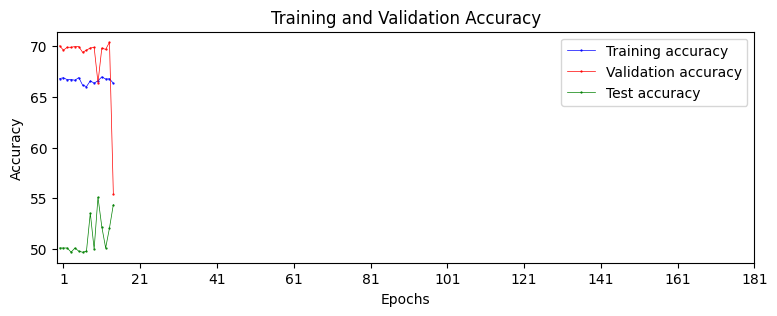


-------epoch:------------ 15  learning_rate 0.001
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.2503e-01, -2.3052e-01],
        [-6.1312e-02, -2.5214e-01],
        [ 6.1119e-02, -3.9147e-01],
        [ 1.7487e-01, -3.5206e-01],
        [-2.3052e-02, -6.1376e-04],
        [ 2.3501e-01, -1.5038e-01],
        [ 3.0530e-01, -6.5857e-01],
        [ 8.0924e-01, -8.4956e-01],
        [ 5.6548e-01, -5.5224e-01],

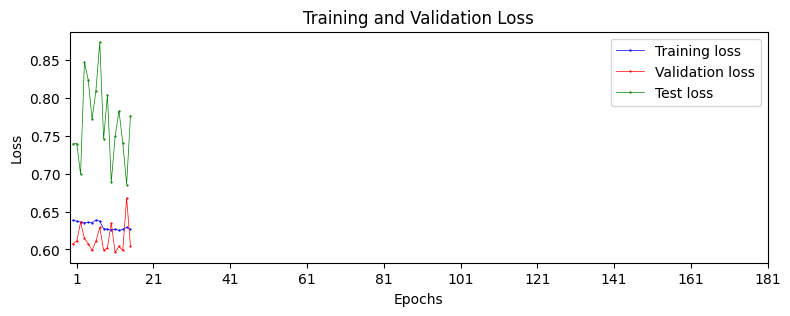

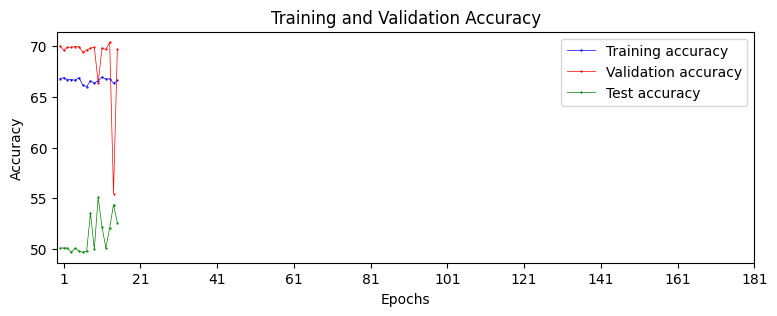

16 0.0005

-------epoch:------------ 16  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5863, -0.5042],
        [ 0.1243, -0.1734],
        [ 0.2383, -0.2093],
        [ 0.8091, -0.9659],
        [ 0.3912, -0.6070],
        [ 0.2371, -0.2739],
        [ 0.2963, -0.3352],
        [ 0.4927, -0.6383],
        [ 0.1038, -0.4195],
        [ 0.1880, -0.1782]], device='cuda:2', grad_fn=<Slice

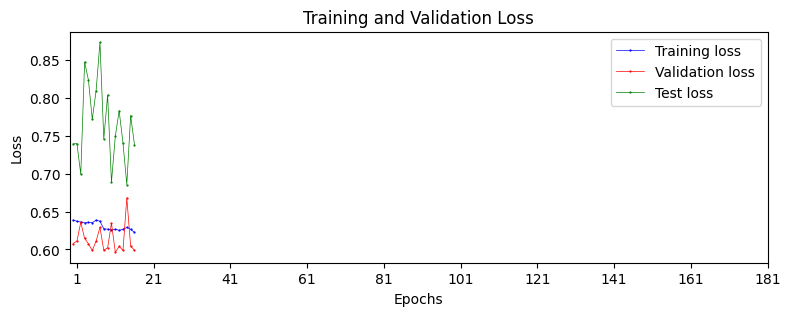

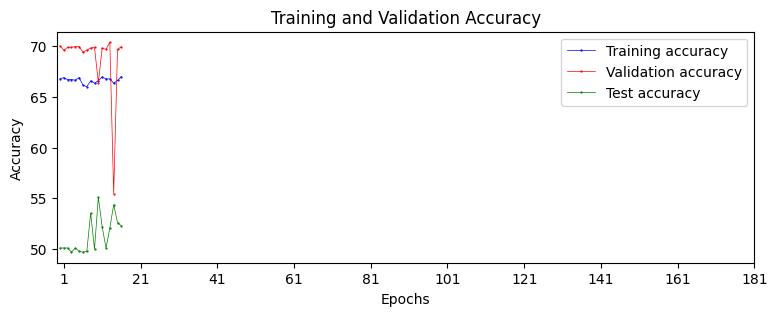


-------epoch:------------ 17  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0145, -0.5896],
        [ 0.3917, -0.5518],
        [ 0.7308, -1.0875],
        [ 0.2931, -0.3888],
        [ 0.4442, -0.7731],
        [ 0.9357, -1.0387],
        [ 0.2056, -0.4890],
        [ 0.1910, -0.7901],
        [ 0.0412, -0.5557],
        [ 0.3467, -1.0320]], device='cuda:2', grad_fn=<SliceBackward0>

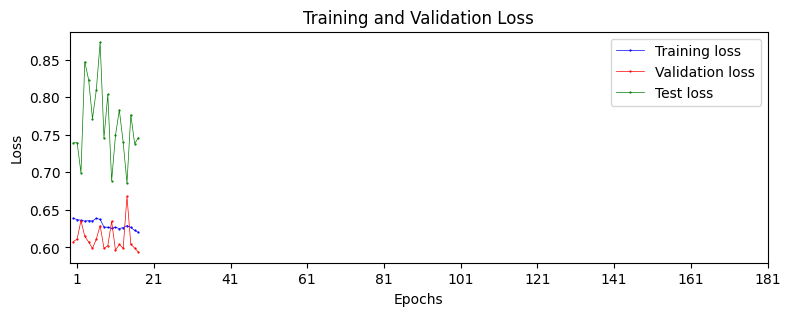

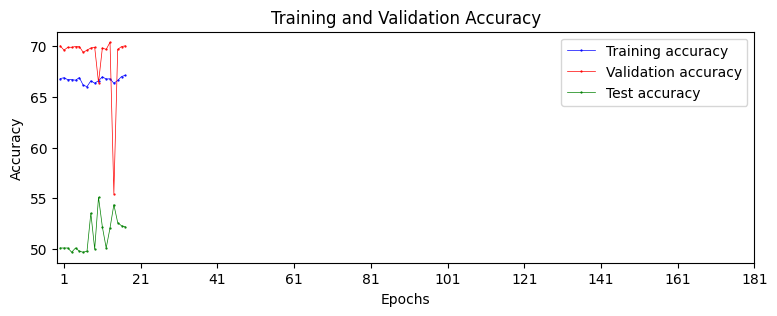


-------epoch:------------ 18  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.7721, -0.7715],
        [ 0.1762, -0.5607],
        [ 0.4024, -0.5734],
        [-0.1216,  0.1282],
        [ 0.5572, -0.6820],
        [ 0.1192, -0.3593],
        [ 0.5011, -0.4142],
        [ 0.0519, -0.4924],
        [ 0.1620, -0.4890],
        [ 0.6180, -0.9974]], device='cuda:2', grad_fn=<SliceBackward0>

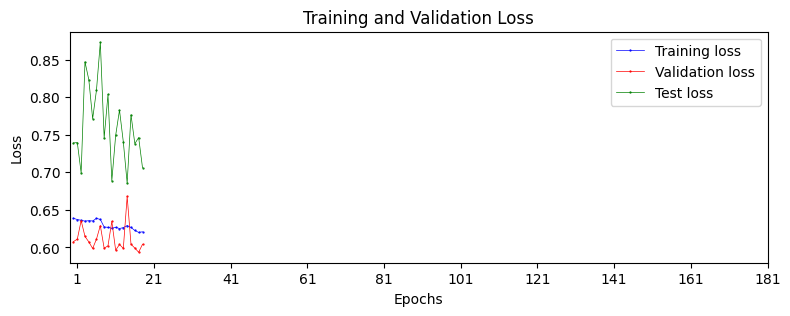

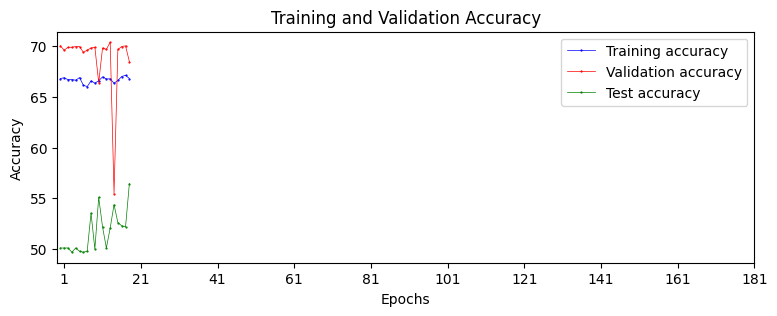


-------epoch:------------ 19  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2798,  0.1020],
        [ 0.8700, -1.0770],
        [ 0.0112, -0.0987],
        [ 0.7191, -0.8073],
        [ 0.1232, -0.4757],
        [ 0.0516, -0.1804],
        [ 0.9265, -1.1106],
        [ 0.0183, -0.4452],
        [ 0.3763, -0.8271],
        [ 0.9798, -1.0143]], device='cuda:2', grad_fn=<SliceBackward0>

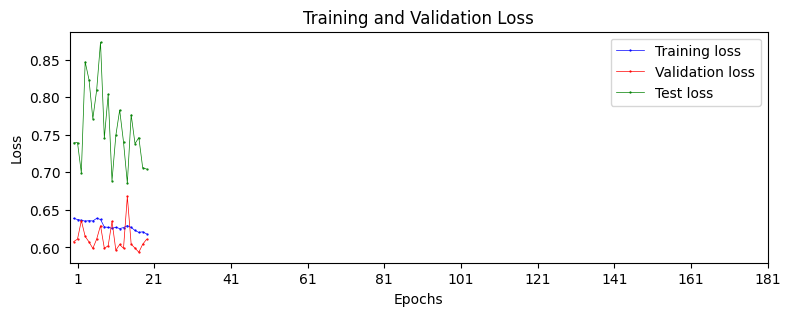

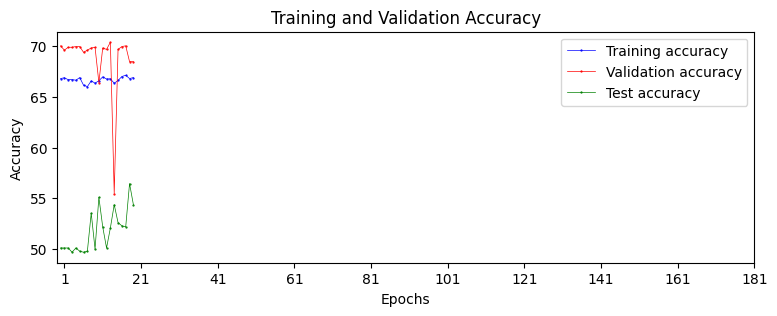


-------epoch:------------ 20  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1333, -0.3721],
        [ 0.0566, -0.5253],
        [ 0.4099, -0.1897],
        [ 0.1082, -0.2081],
        [-0.2076, -0.1927],
        [ 0.3292, -0.1951],
        [ 0.0467, -0.4490],
        [ 0.1872, -0.3925],
        [-0.0070,  0.0091],
        [ 0.0759, -0.2693]], device='cuda:2', grad_fn=<SliceBackward0>

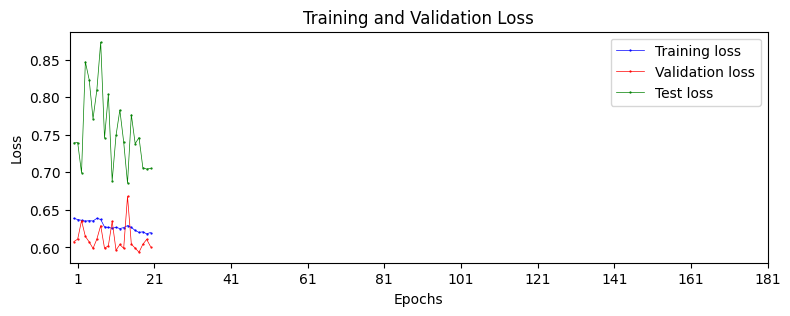

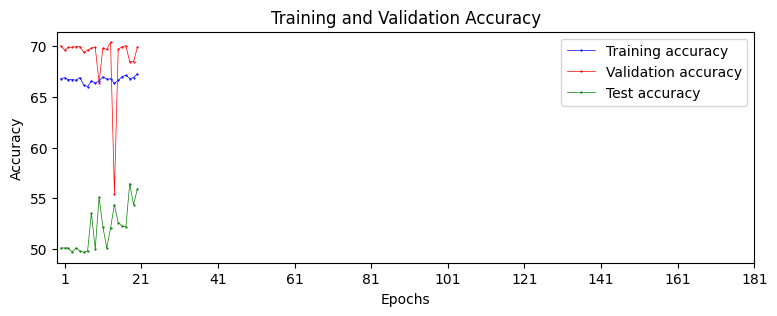


-------epoch:------------ 21  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2224, -0.2603],
        [ 0.5887, -0.4742],
        [ 0.1977, -0.2091],
        [ 0.5232, -0.6153],
        [ 0.3760, -0.0202],
        [ 0.4564, -0.5413],
        [-0.0064, -0.0420],
        [ 0.1059, -0.1841],
        [ 0.2062, -0.3960],
        [ 0.1365, -0.3141]], device='cuda:2', grad_fn=<SliceBackward0>

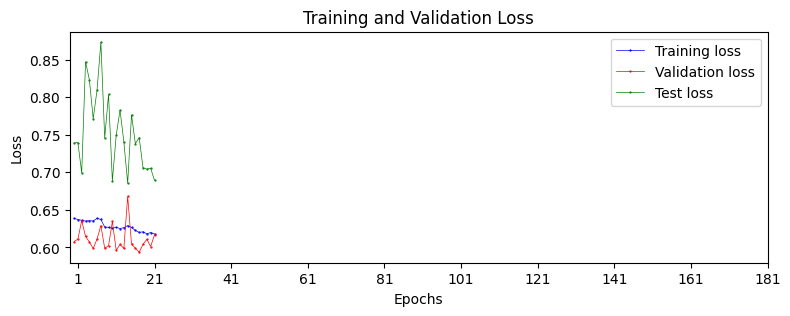

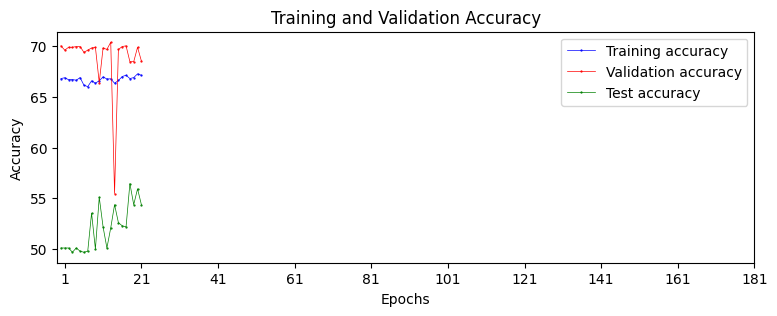


-------epoch:------------ 22  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2242, -0.2498],
        [-0.0897, -0.0962],
        [ 0.0683,  0.2031],
        [ 0.8029, -1.1989],
        [-0.0023, -0.2092],
        [ 0.0123, -0.3861],
        [ 0.3181, -0.8722],
        [ 0.1661, -0.0993],
        [ 0.4715, -0.9208],
        [ 0.4099, -0.2095]], device='cuda:2', grad_fn=<SliceBackward0>

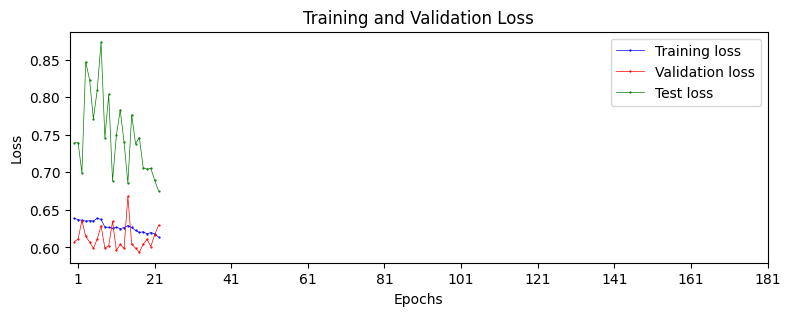

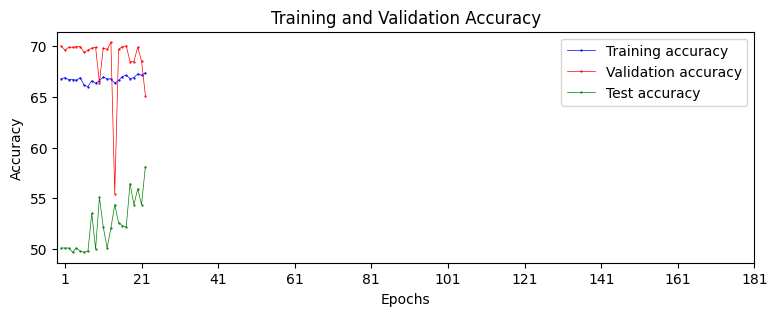


-------epoch:------------ 23  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0764, -0.3516],
        [-0.1971, -0.1938],
        [ 0.0129,  0.0110],
        [ 0.7500, -0.3751],
        [ 0.0437, -0.4496],
        [ 0.1217,  0.0839],
        [ 0.7252, -0.9091],
        [ 0.2656,  0.4319],
        [ 0.0536, -0.1215],
        [ 0.6433, -0.7801]], device='cuda:2', grad_fn=<SliceBackward0>

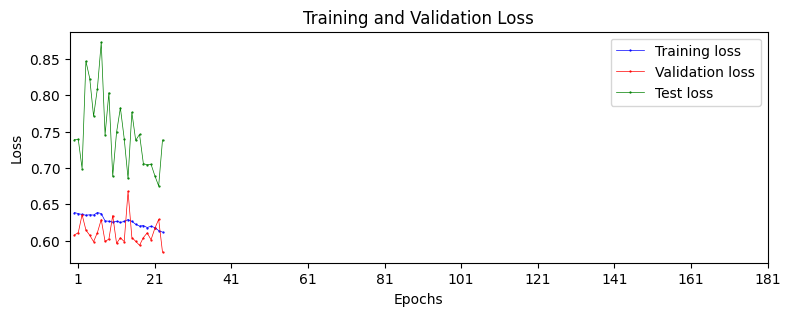

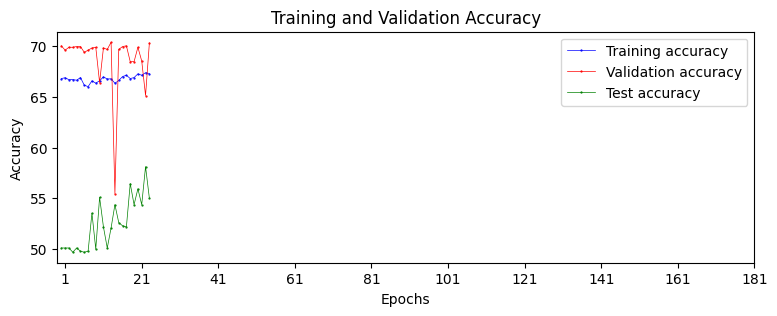


-------epoch:------------ 24  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3110, -0.2430],
        [ 0.5995, -0.8680],
        [ 0.4033, -0.3610],
        [ 0.8004, -0.7864],
        [ 0.4364, -0.9371],
        [ 0.0126, -0.3381],
        [ 0.3202, -0.7797],
        [ 0.2149, -0.1135],
        [-0.0360,  0.0699],
        [ 1.1559, -0.9450]], device='cuda:2', grad_fn=<SliceBackward0>

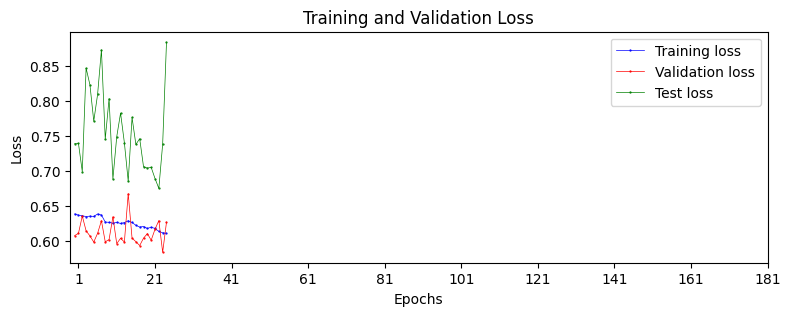

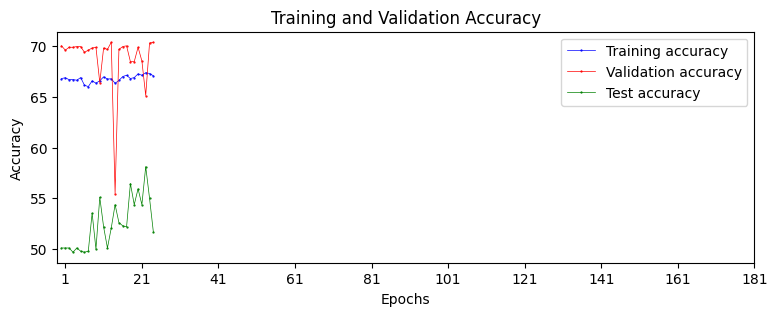


-------epoch:------------ 25  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2444, -0.1559],
        [ 0.0598,  0.0735],
        [ 0.1458, -0.5573],
        [ 0.1453, -0.3366],
        [ 0.2706, -0.6258],
        [ 0.0905, -0.6179],
        [ 0.4009, -0.7724],
        [ 0.3820, -0.3956],
        [ 0.1582, -0.4249],
        [ 0.4538, -0.7676]], device='cuda:2', grad_fn=<SliceBackward0>

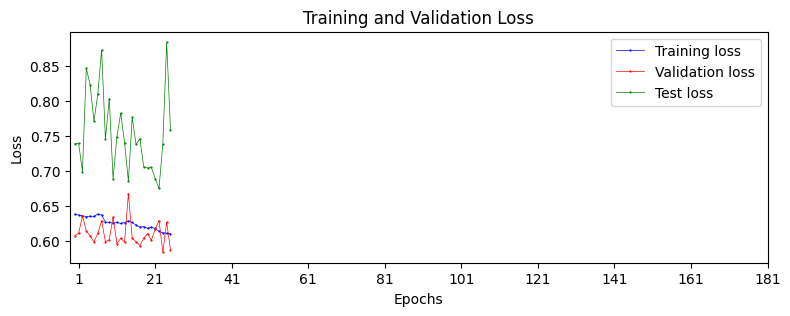

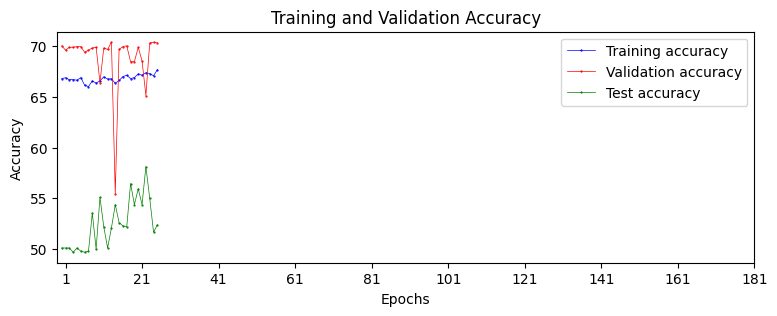


-------epoch:------------ 26  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3143, -0.3012],
        [ 0.7224, -0.7102],
        [ 0.8410, -1.1142],
        [ 0.0154, -0.3433],
        [ 0.9024, -0.6452],
        [ 0.5157, -0.6565],
        [ 0.1960, -0.3057],
        [ 0.8825, -1.1454],
        [ 0.9867, -0.7578],
        [ 0.1831, -0.5257]], device='cuda:2', grad_fn=<SliceBackward0>

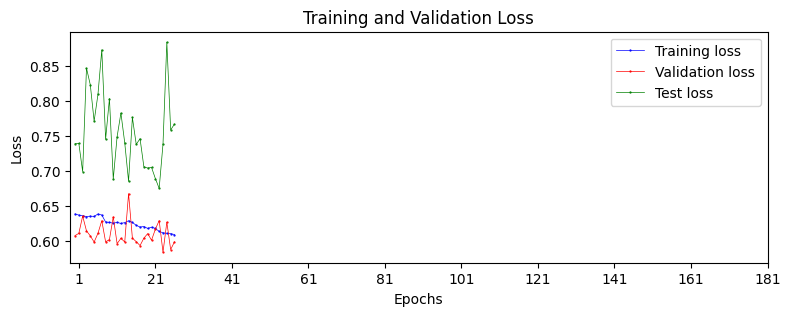

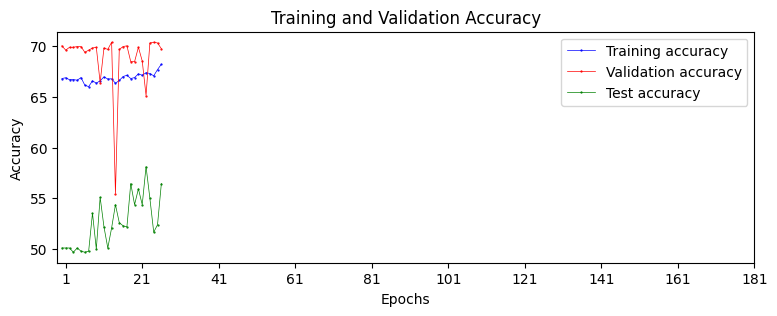


-------epoch:------------ 27  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2014, -0.0704],
        [ 0.0204,  0.0814],
        [ 0.1208, -0.1914],
        [ 0.2772, -0.5952],
        [ 0.1674, -0.3335],
        [ 0.5653, -0.8313],
        [-0.0289, -0.0859],
        [-0.1393,  0.1586],
        [ 0.4010,  0.1154],
        [ 0.3032, -0.1628]], device='cuda:2', grad_fn=<SliceBackward0>

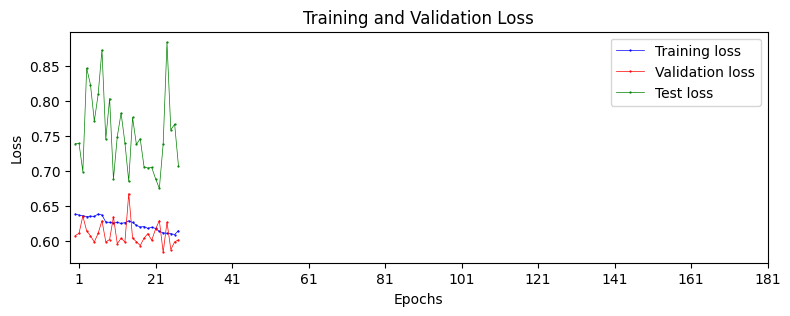

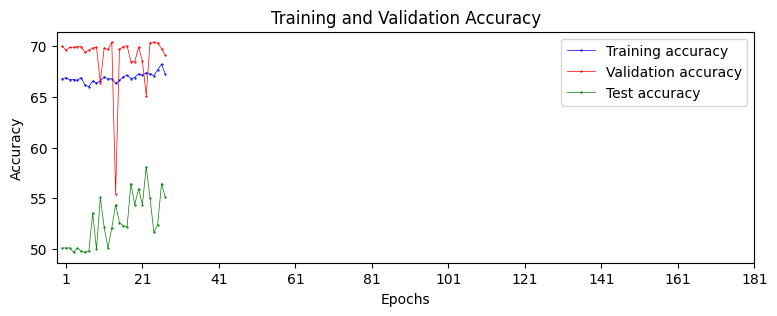


-------epoch:------------ 28  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0592, -0.0741],
        [ 0.1144, -0.3050],
        [ 0.2339, -0.5198],
        [ 0.5852, -0.7321],
        [ 0.5138, -0.9257],
        [ 0.0526, -0.6201],
        [ 0.3281, -0.4781],
        [ 0.3144, -0.7064],
        [ 0.1299, -0.7367],
        [ 0.3914, -0.7473]], device='cuda:2', grad_fn=<SliceBackward0>

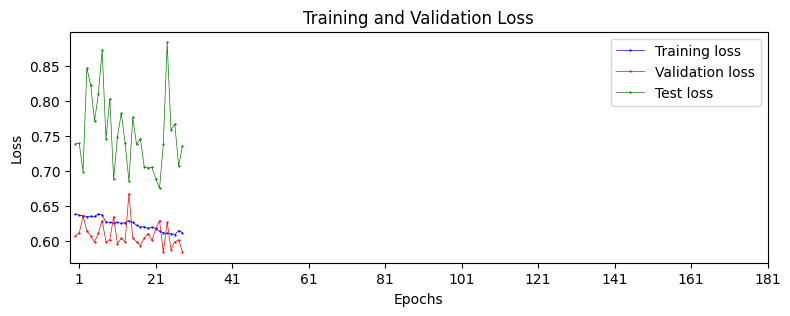

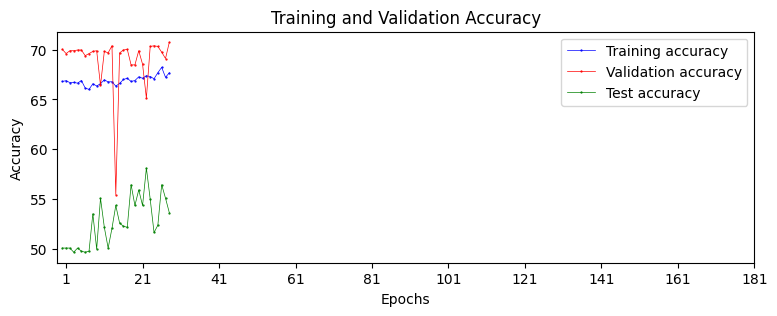


-------epoch:------------ 29  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5393, -0.9280],
        [ 0.0042,  0.1593],
        [ 0.6853, -0.6806],
        [ 0.1234,  0.0239],
        [ 0.3632, -0.4393],
        [-0.1496,  0.3056],
        [ 0.1775, -0.1316],
        [ 0.5198, -0.9724],
        [ 0.2965, -0.8008],
        [-0.3268,  0.3750]], device='cuda:2', grad_fn=<SliceBackward0>

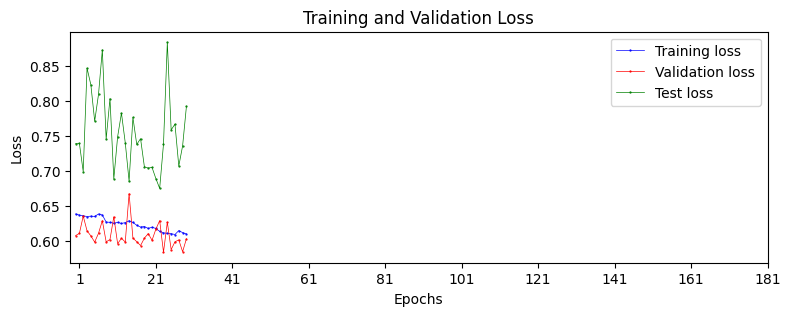

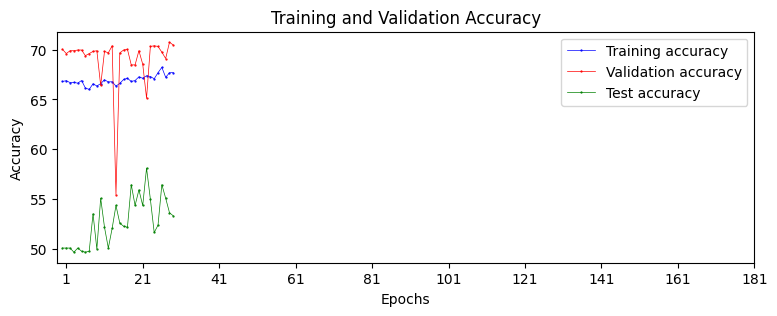


-------epoch:------------ 30  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2685,  0.1083],
        [ 0.1705, -0.0606],
        [ 1.0296, -0.9665],
        [ 0.6009, -0.6160],
        [ 0.4638, -1.2621],
        [ 0.6549, -0.8274],
        [ 0.9774, -1.1057],
        [-0.1467,  0.1522],
        [ 0.8449, -1.0175],
        [ 1.0669, -1.1095]], device='cuda:2', grad_fn=<SliceBackward0>

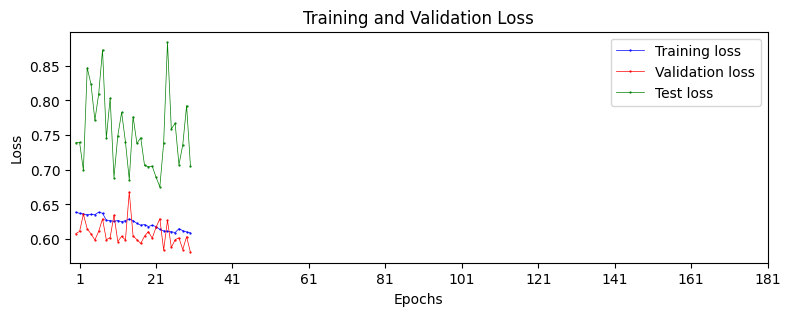

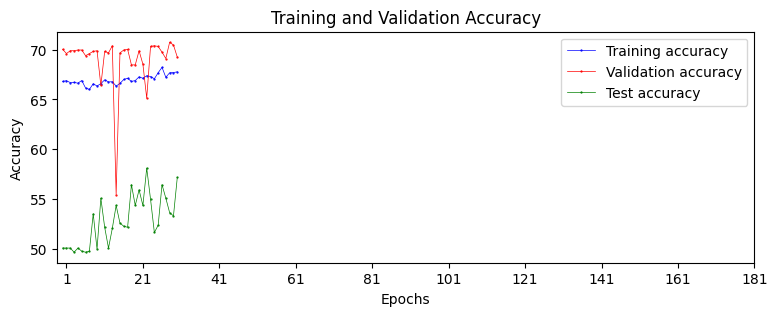


-------epoch:------------ 31  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1776, -0.0295],
        [ 0.1643,  0.2894],
        [ 0.1802,  0.0951],
        [-0.2923,  0.7017],
        [ 0.0055,  0.0055],
        [-0.1166,  0.1528],
        [ 0.2327, -0.0788],
        [ 0.8693, -1.3591],
        [-0.1649, -0.4944],
        [ 0.0847, -0.1117]], device='cuda:2', grad_fn=<SliceBackward0>

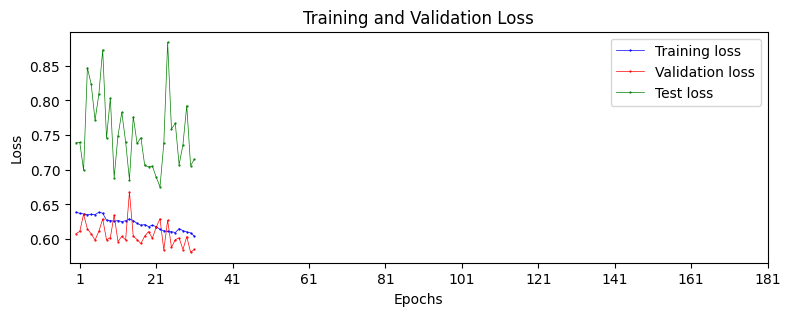

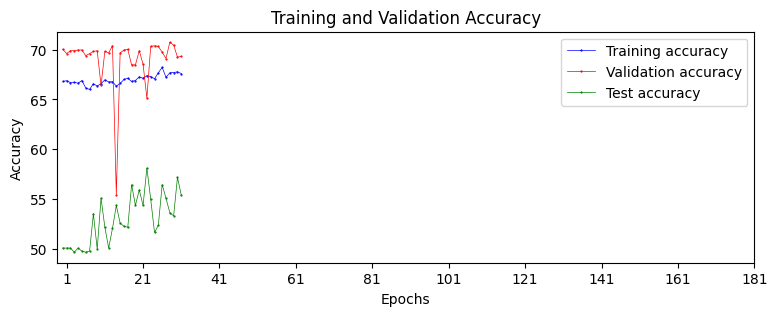


-------epoch:------------ 32  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0566, -0.1810],
        [-0.0821, -0.4826],
        [ 0.1004, -0.0271],
        [ 0.5761, -1.0073],
        [ 0.7597, -1.2907],
        [ 0.0923, -0.4249],
        [ 0.4149, -0.1767],
        [ 0.2123, -0.4787],
        [-0.0135, -0.3957],
        [ 0.4000, -0.7739]], device='cuda:2', grad_fn=<SliceBackward0>

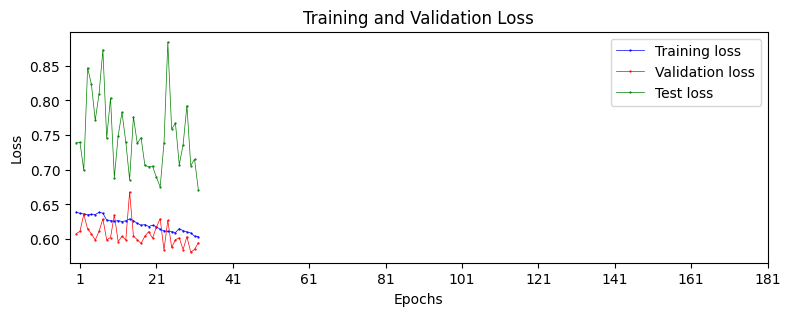

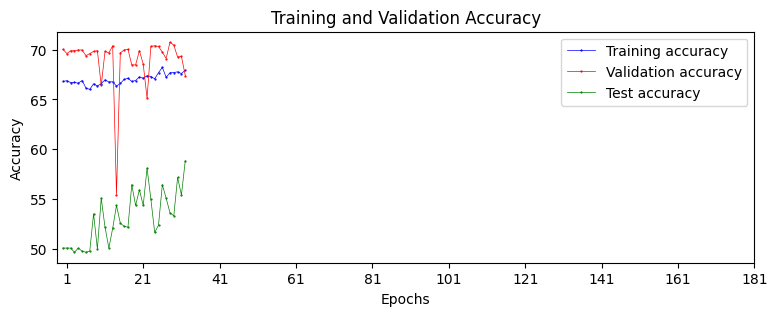


-------epoch:------------ 33  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5338, -0.7292],
        [ 0.2832, -0.8301],
        [ 0.4527, -0.9451],
        [ 0.0196, -0.3467],
        [ 0.1097, -0.7171],
        [ 0.4955, -0.8392],
        [ 0.2422, -1.1441],
        [-0.1884,  0.3134],
        [ 0.0273, -0.0518],
        [ 0.1524, -0.2057]], device='cuda:2', grad_fn=<SliceBackward0>

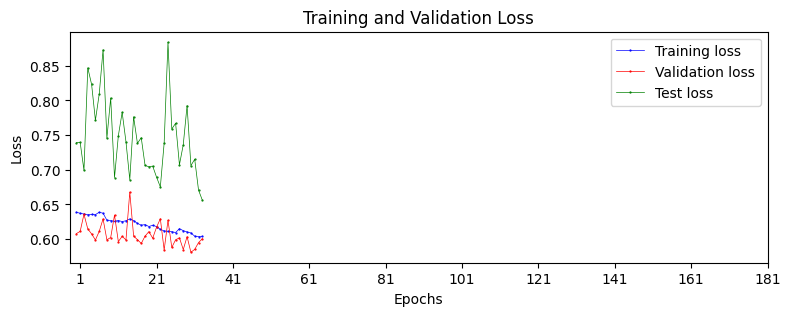

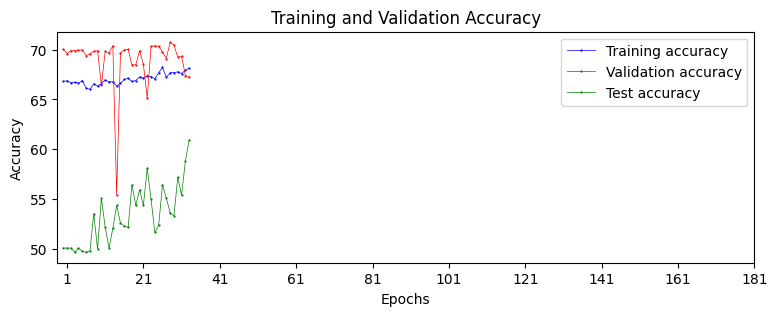


-------epoch:------------ 34  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1511, -0.4631],
        [ 0.0882, -1.0209],
        [ 0.2783, -0.5207],
        [ 0.1525, -1.1106],
        [ 0.0505, -0.6653],
        [ 0.0551, -0.1327],
        [ 0.0616, -0.7063],
        [ 0.4484, -0.6157],
        [-0.0288, -0.0440],
        [ 0.1715, -0.5440]], device='cuda:2', grad_fn=<SliceBackward0>

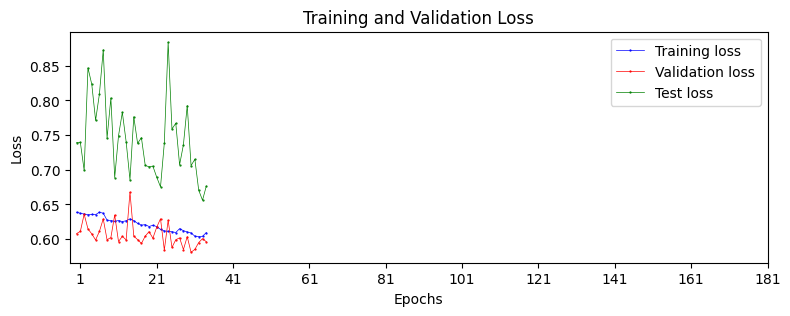

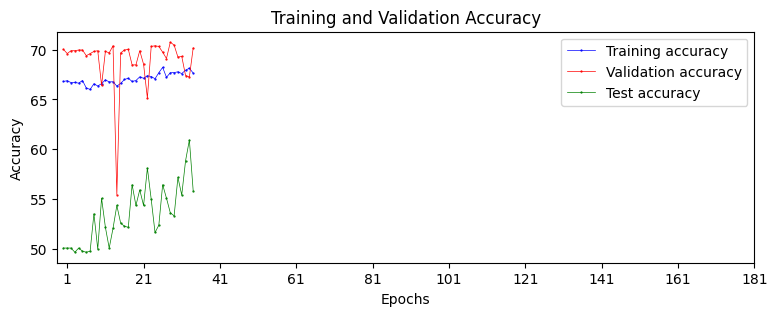


-------epoch:------------ 35  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3091, -0.4221],
        [ 0.2119, -0.8211],
        [ 0.5050, -1.0590],
        [-0.2464,  0.1145],
        [ 0.5599, -1.2049],
        [ 0.4868, -1.0247],
        [ 0.4360, -0.8434],
        [ 0.1203, -0.1347],
        [ 0.1432, -0.7533],
        [-0.4982,  0.0932]], device='cuda:2', grad_fn=<SliceBackward0>

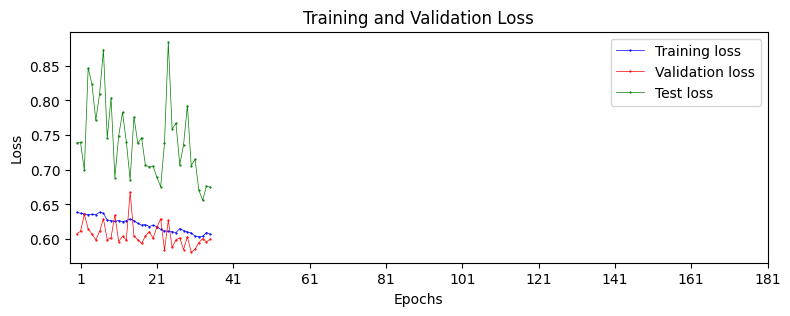

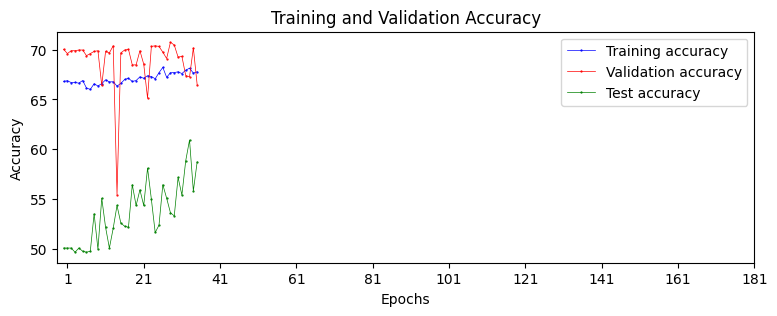


-------epoch:------------ 36  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1281, -0.0481],
        [ 0.2360, -0.9274],
        [ 0.7237, -1.1703],
        [ 0.3177, -0.5778],
        [ 1.0779, -1.3351],
        [-0.0081, -0.3333],
        [ 0.1814, -0.8862],
        [ 0.1407, -1.1484],
        [-0.1406, -0.1690],
        [-0.1296, -0.3744]], device='cuda:2', grad_fn=<SliceBackward0>

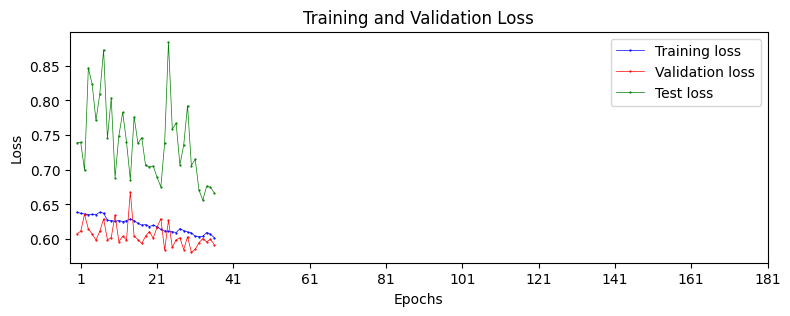

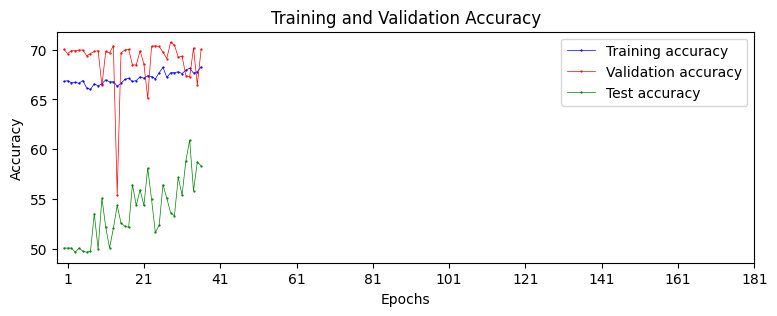


-------epoch:------------ 37  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2052, -0.2263],
        [-0.2543, -0.2168],
        [ 0.3228, -1.0844],
        [ 0.1735, -0.7055],
        [ 0.0490, -0.6545],
        [ 0.9408, -0.8959],
        [ 0.0845, -0.2340],
        [-0.4144,  0.0554],
        [ 0.3097, -0.2657],
        [ 0.2441, -0.3832]], device='cuda:2', grad_fn=<SliceBackward0>

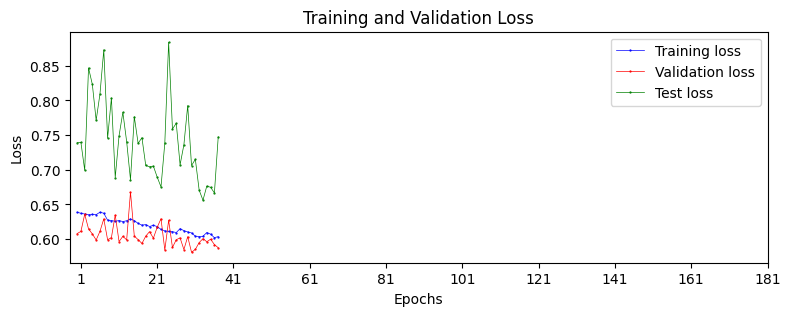

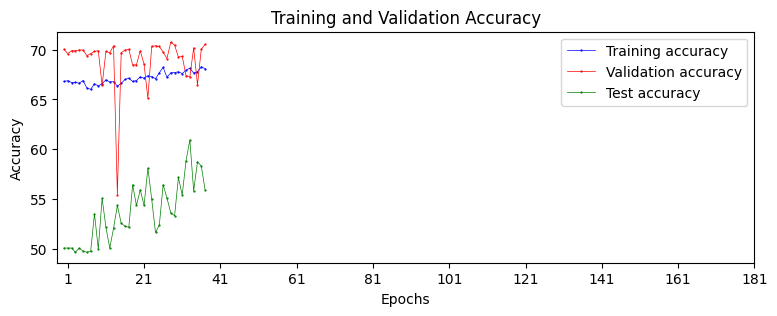


-------epoch:------------ 38  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4043, -1.2996],
        [ 0.5390, -1.1927],
        [ 0.0699, -0.0178],
        [ 0.4879, -1.2166],
        [ 0.7391, -1.3916],
        [ 0.5313, -0.5895],
        [ 0.3127, -0.2789],
        [ 0.0413, -0.4696],
        [-0.0087, -0.4958],
        [-0.0899, -0.2890]], device='cuda:2', grad_fn=<SliceBackward0>

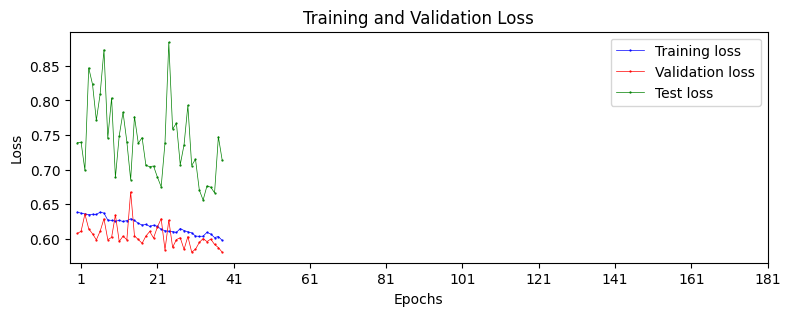

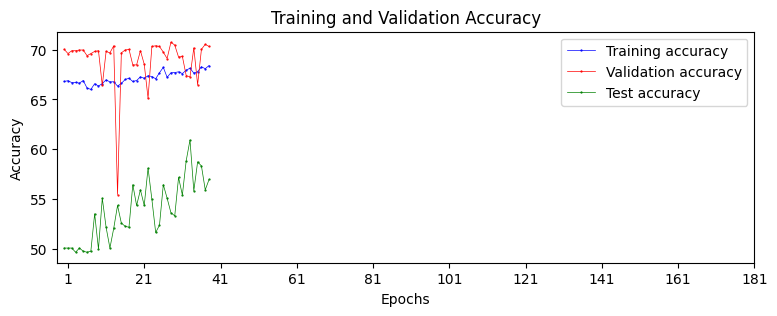


-------epoch:------------ 39  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2785, -0.3344],
        [ 0.4069, -0.4704],
        [ 0.1930,  0.1396],
        [ 0.0494,  0.1137],
        [ 0.5634, -0.8902],
        [-0.0794, -0.2473],
        [ 0.7492, -1.4144],
        [ 0.6937, -1.2271],
        [ 0.2318, -1.2194],
        [ 0.9773, -1.6257]], device='cuda:2', grad_fn=<SliceBackward0>

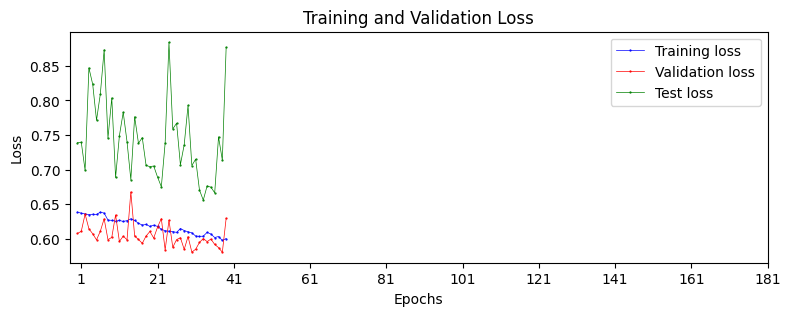

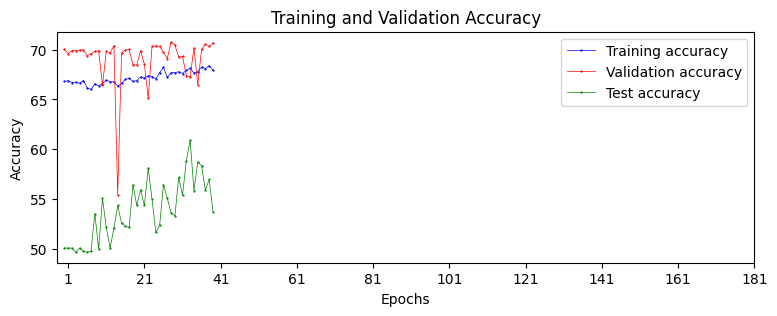


-------epoch:------------ 40  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1825, -0.4599],
        [ 0.0814, -0.2611],
        [-0.3790,  0.0552],
        [-0.0948, -0.3858],
        [ 0.6615, -0.9083],
        [-0.0199, -0.2470],
        [ 0.1512, -0.6280],
        [ 0.1355, -0.6707],
        [ 0.5122, -1.2054],
        [ 0.4708, -1.3621]], device='cuda:2', grad_fn=<SliceBackward0>

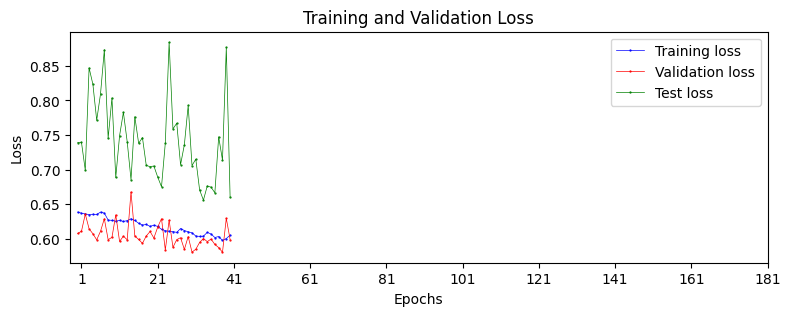

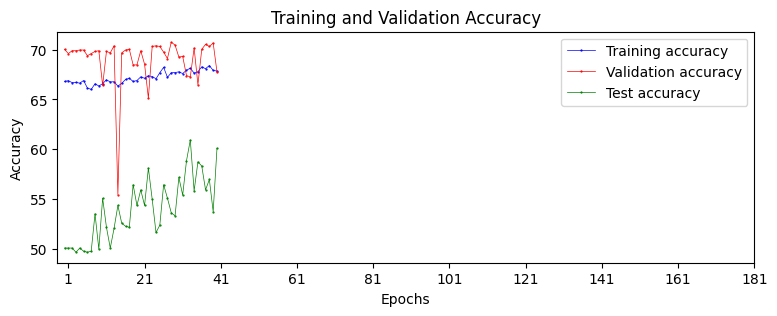


-------epoch:------------ 41  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3137, -0.5454],
        [ 0.2896, -0.4949],
        [ 0.2937, -0.7498],
        [ 0.1128,  0.0566],
        [-0.2438, -0.2679],
        [ 0.1535, -0.2151],
        [ 0.0432, -0.6313],
        [ 0.2217, -0.1426],
        [ 0.2424, -0.0713],
        [-0.2577, -0.1745]], device='cuda:2', grad_fn=<SliceBackward0>

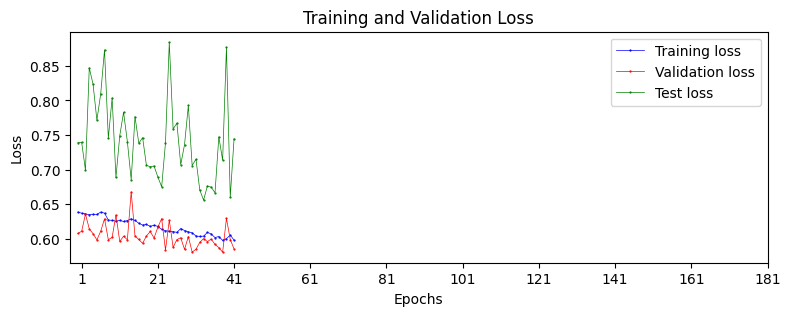

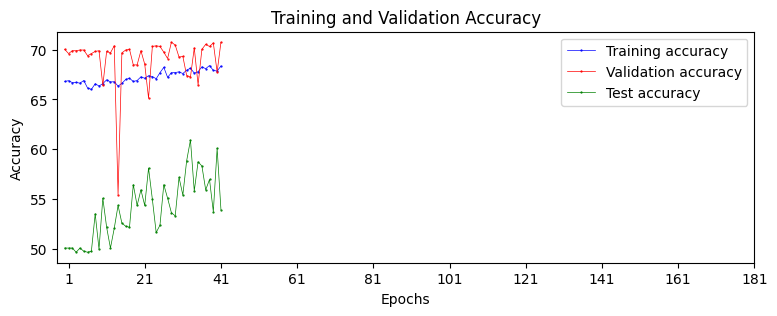


-------epoch:------------ 42  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0287, -0.6687],
        [ 0.7020, -0.5333],
        [ 0.4217, -0.6691],
        [ 0.2608, -0.8069],
        [ 0.6849, -0.9942],
        [ 0.0232, -0.4560],
        [ 0.9575, -1.5455],
        [ 0.2012, -0.4691],
        [ 0.1231,  0.6924],
        [ 0.2598, -0.6078]], device='cuda:2', grad_fn=<SliceBackward0>

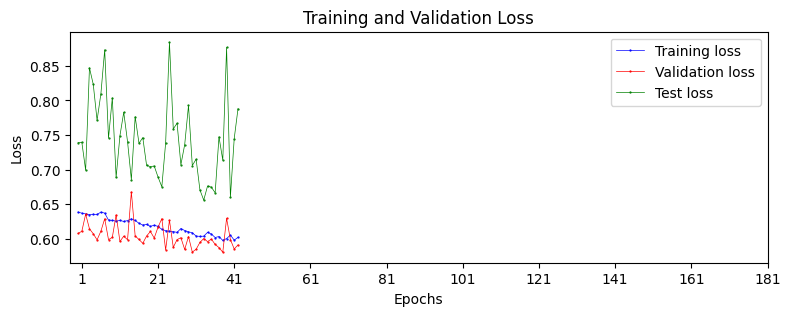

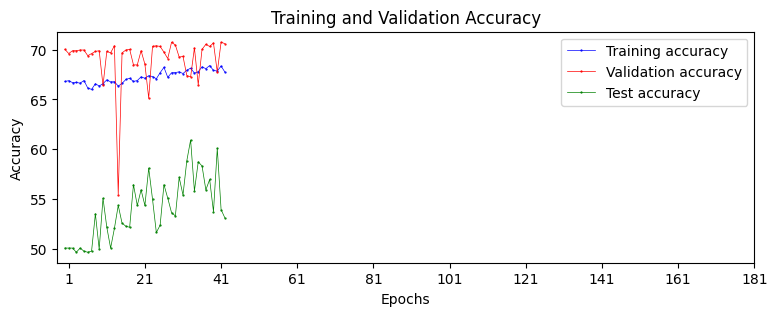


-------epoch:------------ 43  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-4.9135e-02, -5.5185e-01],
        [ 2.9144e-01, -6.0826e-01],
        [-1.1318e-04, -2.4315e-01],
        [-6.8695e-02, -7.6317e-01],
        [ 1.3435e-01, -9.0065e-03],
        [-1.0975e-01, -1.3378e-01],
        [ 1.9394e-01, -5.8768e-01],
        [ 1.1699e-01, -1.6780e-01],
        [ 9.9928e-02, -3.5110e-01]

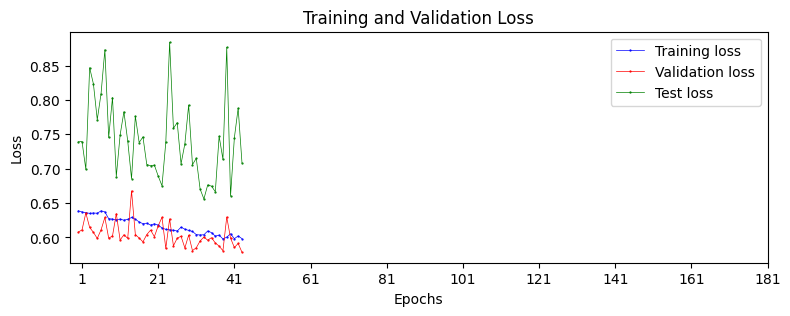

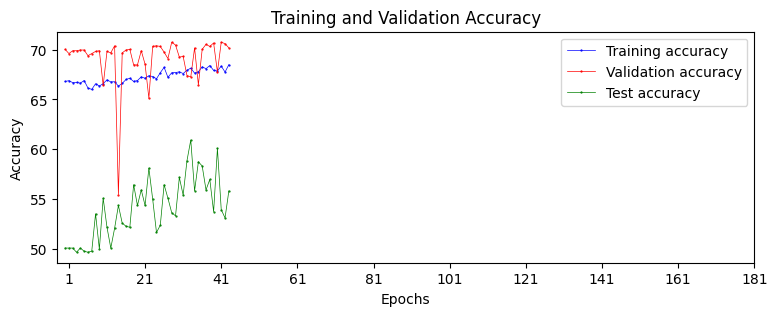


-------epoch:------------ 44  learning_rate 0.0005
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0708, -0.2635],
        [ 0.0986, -0.4013],
        [ 0.2282, -0.7046],
        [ 0.2465, -0.7408],
        [ 0.4229, -0.8415],
        [ 0.3020, -0.6938],
        [ 1.0331, -0.8121],
        [ 0.0645, -0.8458],
        [-0.4294, -0.1910],
        [ 0.5458, -1.0617]], device='cuda:2', grad_fn=<SliceBackward0>

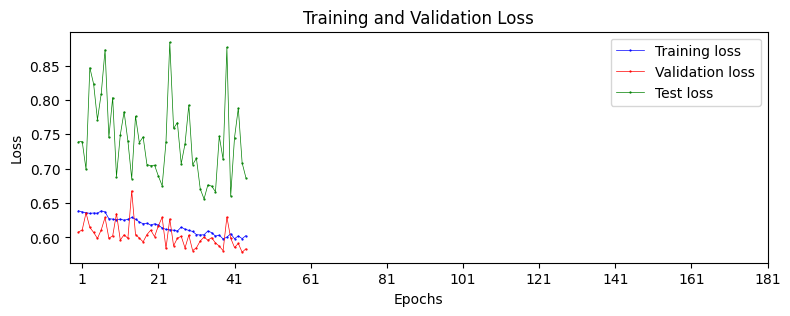

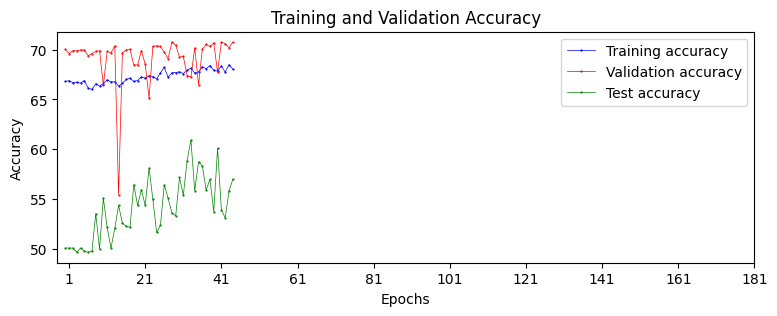

45 0.0003333333333333333

-------epoch:------------ 45  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0174, -0.5585],
        [ 0.7880, -1.9815],
        [ 0.4629, -0.7549],
        [ 0.7620, -1.4569],
        [ 0.8401, -0.6646],
        [ 0.5674, -0.7212],
        [ 0.8643, -0.9228],
        [ 0.5819, -0.1566],
        [-0.2180, -0.0687],
        [ 0.3730, -0.6611]], d

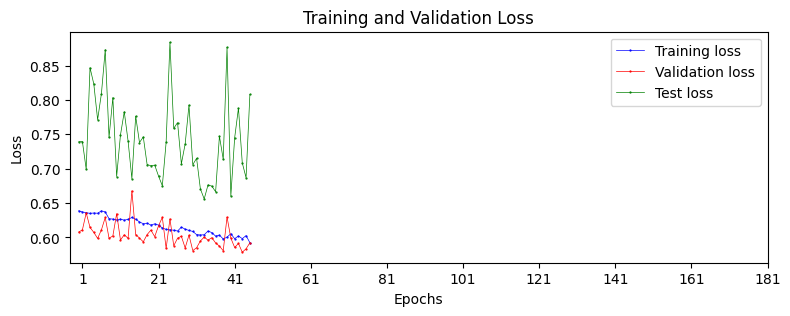

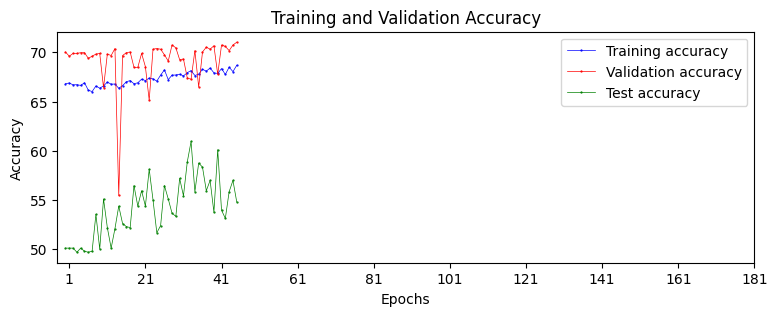


-------epoch:------------ 46  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0564,  0.0508],
        [ 0.5006, -1.2235],
        [ 0.5361, -1.1768],
        [ 0.2088, -0.1173],
        [ 0.8706, -0.9676],
        [ 0.6778, -1.1271],
        [-0.1779, -0.0677],
        [ 0.7060, -1.6527],
        [ 0.3438, -0.5401],
        [-0.3981,  0.2493]], device='cuda:2', grad_fn=<

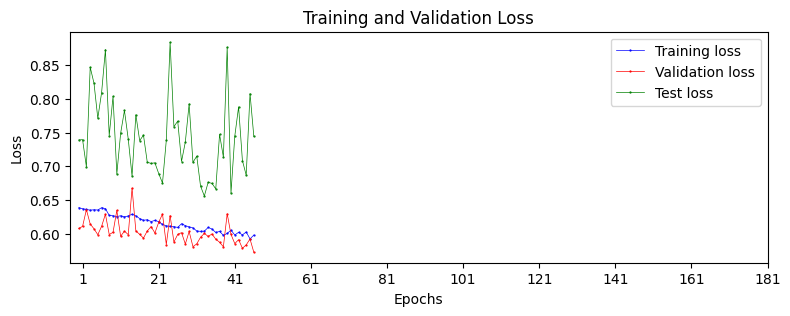

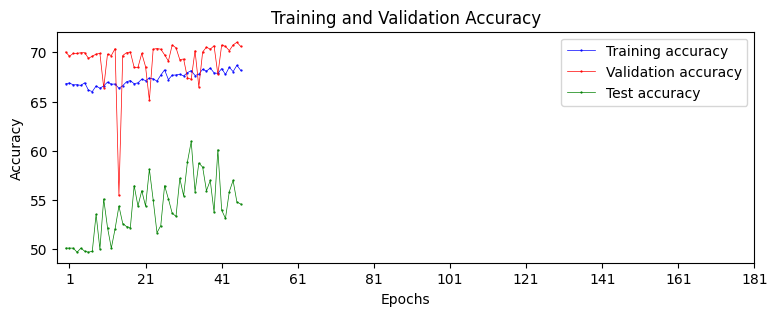


-------epoch:------------ 47  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.7630, -0.2680],
        [ 0.2813, -0.1837],
        [ 0.2420, -0.4223],
        [ 0.4521, -0.8645],
        [ 0.9364, -0.8493],
        [ 0.4176, -0.4088],
        [ 0.2653, -0.7387],
        [ 0.4078, -0.4339],
        [ 0.2096, -1.0820],
        [ 0.6876, -1.0641]], device='cuda:2', grad_fn=<

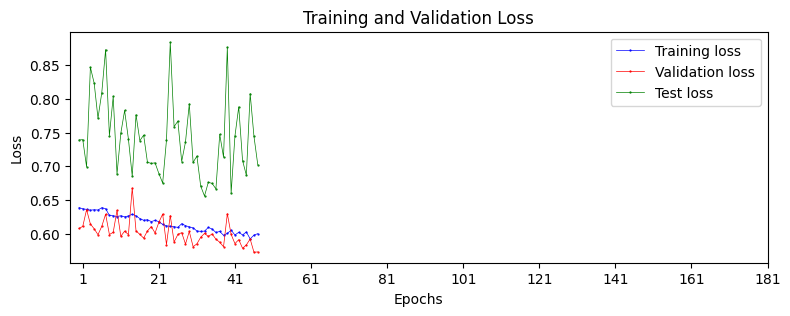

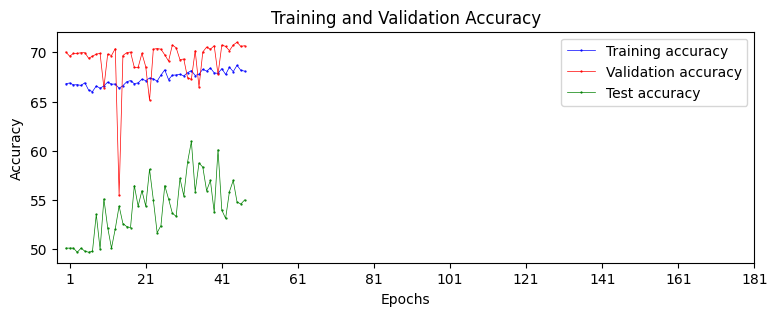


-------epoch:------------ 48  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2692, -0.3853],
        [ 0.0934, -0.1592],
        [ 0.3598, -0.4193],
        [ 1.0843, -1.2193],
        [-0.3567, -0.1718],
        [ 0.4950, -0.2007],
        [ 0.4379,  0.0562],
        [ 0.5862, -0.7540],
        [ 0.6110, -0.2553],
        [ 0.1512, -0.3653]], device='cuda:2', grad_fn=<

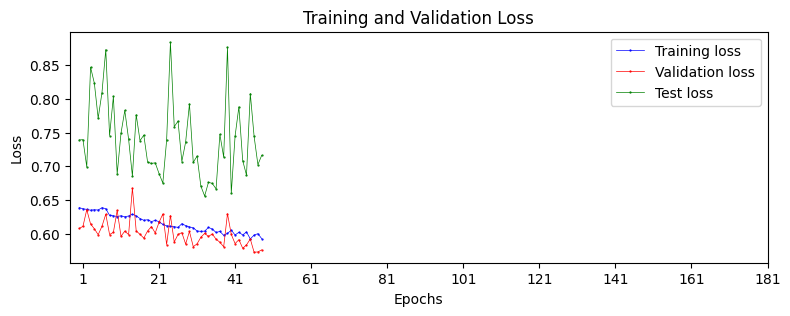

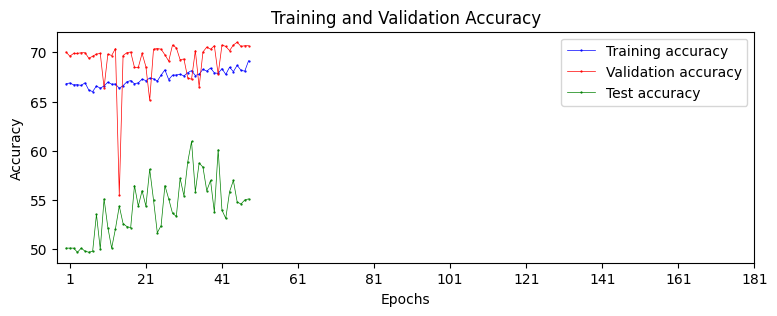


-------epoch:------------ 49  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.7634, -0.7854],
        [ 0.5930, -0.9071],
        [ 1.0294, -1.4584],
        [-0.2866, -0.3586],
        [ 0.6330, -0.8198],
        [ 1.2752, -0.7760],
        [ 1.1149, -1.3284],
        [ 1.6760, -1.7579],
        [ 0.5167, -0.3835],
        [ 0.0929, -0.7339]], device='cuda:2', grad_fn=<

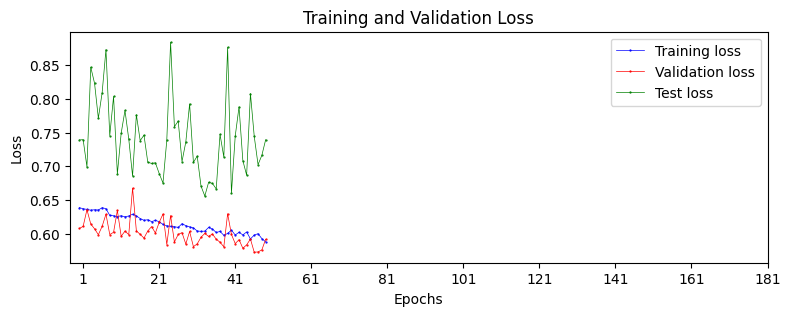

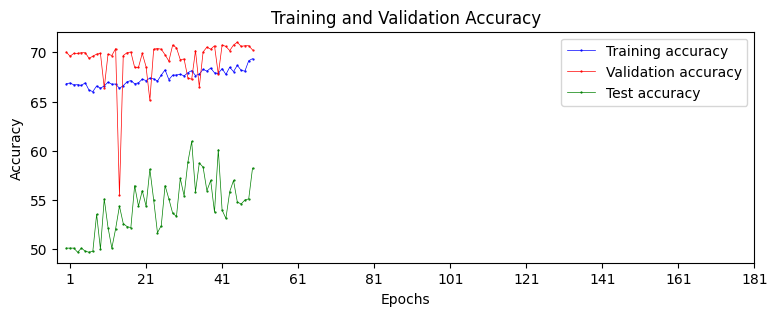


-------epoch:------------ 50  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5135, -1.0149],
        [ 0.7026, -0.5240],
        [ 0.4776, -0.7257],
        [ 0.2160, -1.0147],
        [ 0.3803, -0.1109],
        [ 0.2070, -0.5794],
        [ 0.5510, -0.2444],
        [ 0.4511, -0.4001],
        [ 0.5874, -1.0610],
        [ 0.5471, -0.1177]], device='cuda:2', grad_fn=<

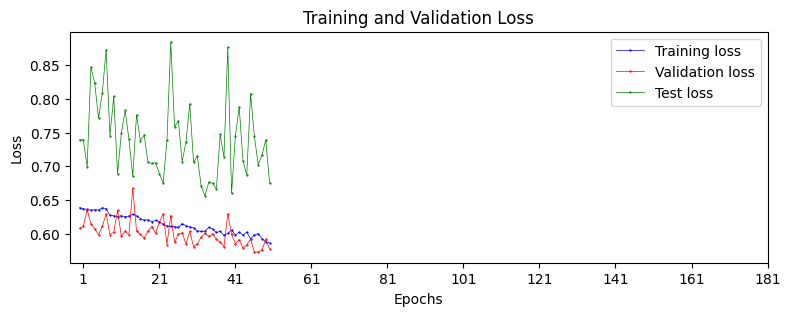

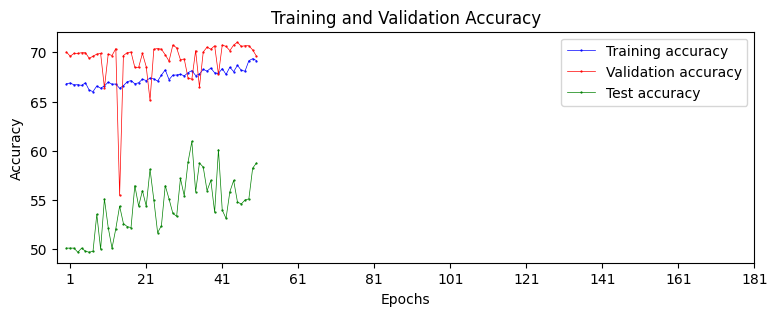


-------epoch:------------ 51  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2608, -0.7579],
        [ 0.1100,  0.1350],
        [ 0.4317, -0.3649],
        [ 0.7474, -0.3593],
        [ 0.5427, -0.5050],
        [ 0.2093, -0.4582],
        [ 1.3047, -1.5152],
        [ 0.7427, -0.5144],
        [ 0.2687,  0.0088],
        [-0.1250,  0.2130]], device='cuda:2', grad_fn=<

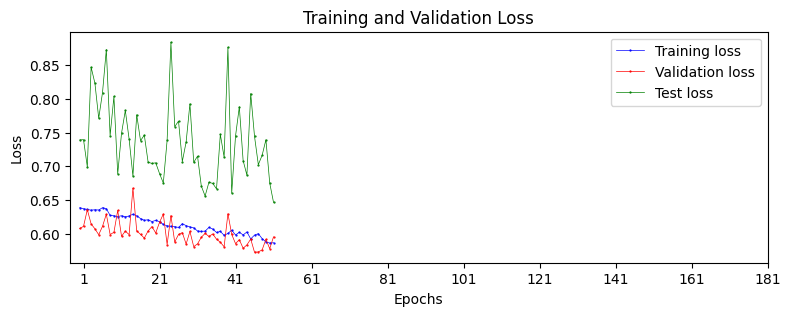

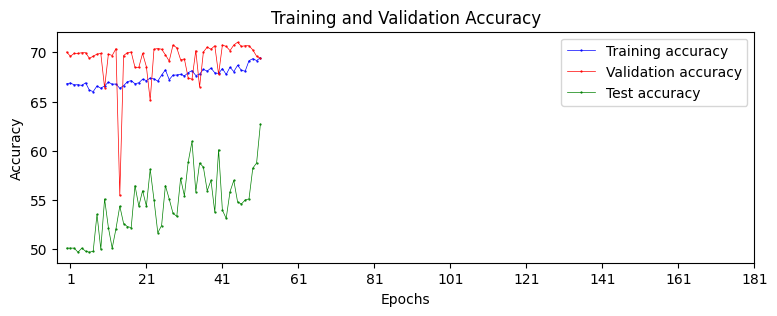


-------epoch:------------ 52  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3417, -0.1881],
        [ 0.9313, -1.2225],
        [ 0.1720, -0.9892],
        [ 0.5657,  0.0622],
        [-0.0449, -0.0595],
        [ 0.3323, -0.4800],
        [ 1.1751, -1.2548],
        [ 0.7423, -0.3428],
        [ 0.5249, -0.2761],
        [-0.1651, -0.4328]], device='cuda:2', grad_fn=<

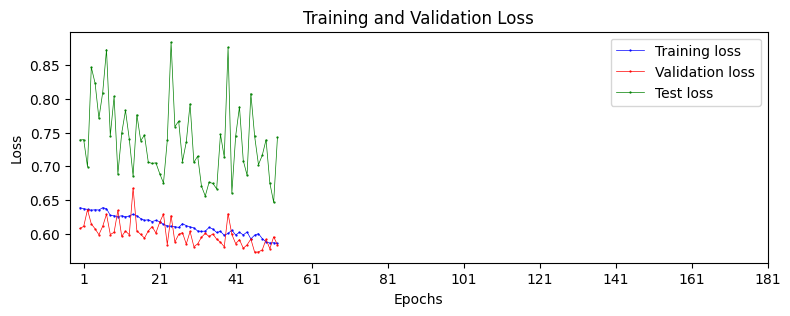

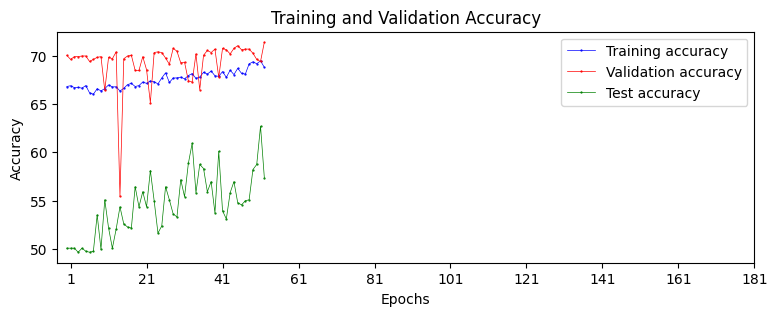


-------epoch:------------ 53  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6171, -0.2786],
        [ 0.3968,  0.1480],
        [ 0.6665, -0.8655],
        [-0.0336,  0.1723],
        [ 0.4594,  0.0915],
        [ 0.5075, -0.3992],
        [ 0.7038, -0.6592],
        [ 0.4475, -0.3754],
        [-0.0936,  0.2741],
        [ 0.0964,  0.0974]], device='cuda:2', grad_fn=<

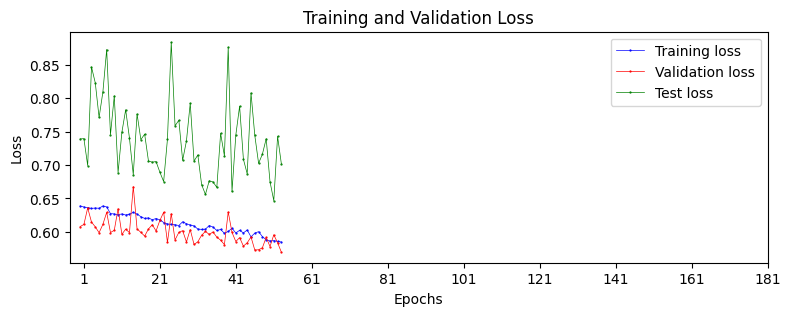

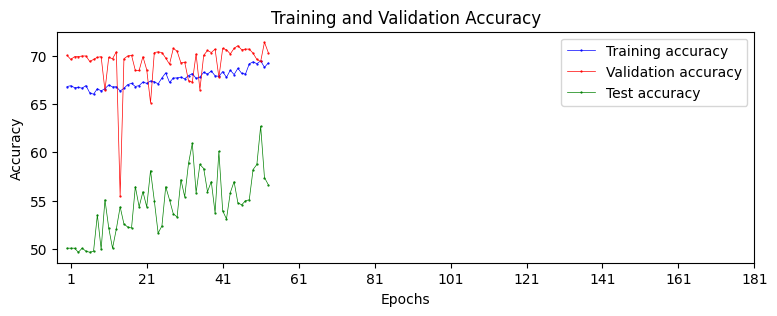


-------epoch:------------ 54  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6756, -0.9690],
        [ 0.7462, -0.1439],
        [ 0.9133, -0.6899],
        [ 0.4992, -0.1441],
        [ 0.4222, -0.6362],
        [ 0.3514, -0.5866],
        [ 0.9119, -0.5488],
        [ 0.2069, -0.6851],
        [ 0.9506, -0.6137],
        [ 1.4550, -0.9436]], device='cuda:2', grad_fn=<

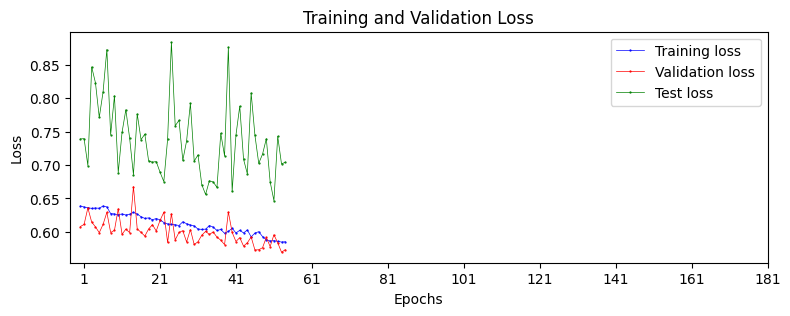

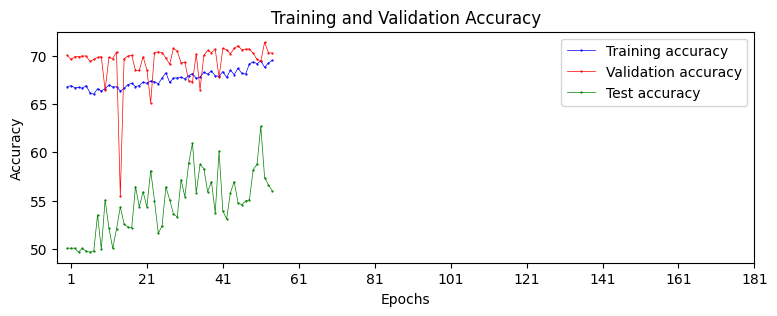


-------epoch:------------ 55  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3022, -0.1764],
        [ 0.4261, -0.6483],
        [ 0.7077, -0.5173],
        [ 0.5123, -0.3166],
        [ 0.4012, -0.2441],
        [ 0.4097, -0.1497],
        [ 0.8489, -1.2567],
        [ 0.5666,  0.0662],
        [ 0.3553, -0.3250],
        [-0.0246,  0.0682]], device='cuda:2', grad_fn=<

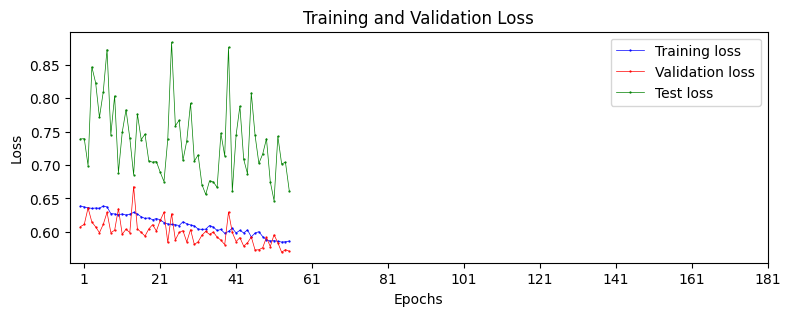

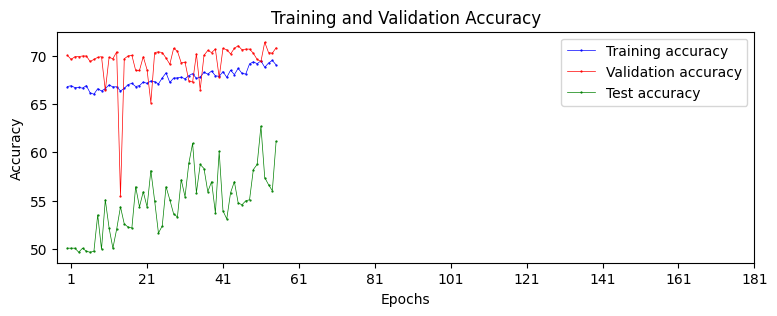


-------epoch:------------ 56  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2551, -0.1018],
        [ 0.0546, -0.1001],
        [ 0.5844, -0.4740],
        [ 0.6062, -0.6359],
        [ 0.1395,  0.0250],
        [ 0.1248, -0.0171],
        [ 0.0538,  0.4052],
        [ 1.1991, -1.1218],
        [ 0.1312, -0.0095],
        [ 0.3015, -0.2521]], device='cuda:2', grad_fn=<

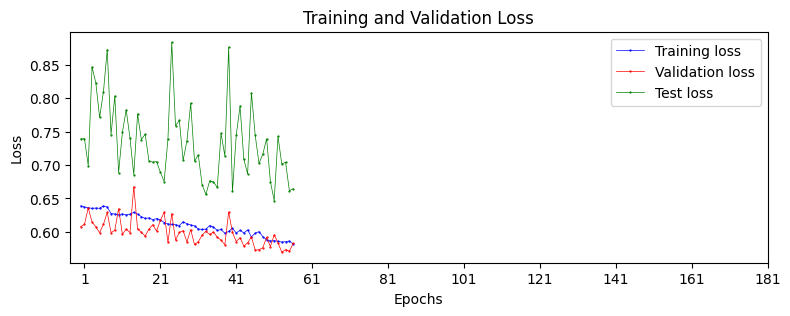

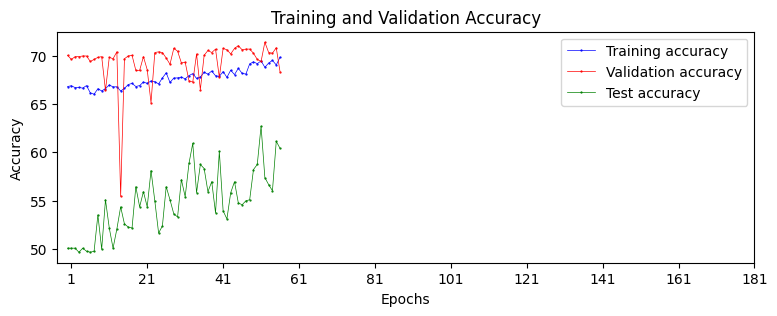


-------epoch:------------ 57  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.2464,  0.5962],
        [ 1.0699, -1.3824],
        [ 0.6162, -0.7717],
        [ 1.1178, -1.2003],
        [-0.1014, -0.0704],
        [ 0.3184, -0.6405],
        [ 0.4683, -0.6461],
        [ 0.8531, -1.3865],
        [ 1.1077, -1.4437],
        [ 0.4449, -0.1437]], device='cuda:2', grad_fn=<

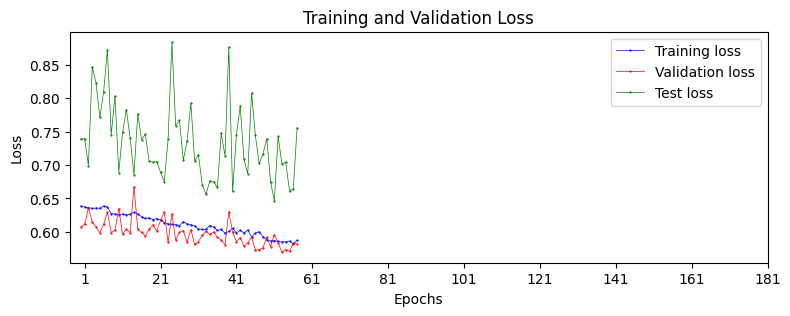

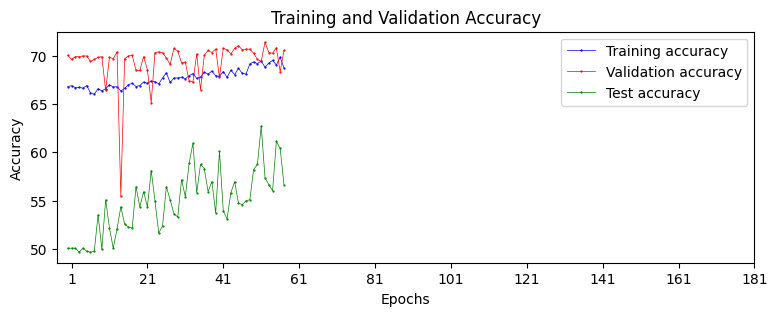


-------epoch:------------ 58  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9811, -1.1880],
        [ 1.0593, -1.7406],
        [ 0.8578, -1.0342],
        [ 0.4832, -0.5987],
        [ 1.5374, -1.3492],
        [ 0.9167, -1.2079],
        [ 0.8795, -1.0942],
        [ 0.3785, -0.5060],
        [ 0.5129, -0.6549],
        [ 0.6761, -0.7623]], device='cuda:2', grad_fn=<

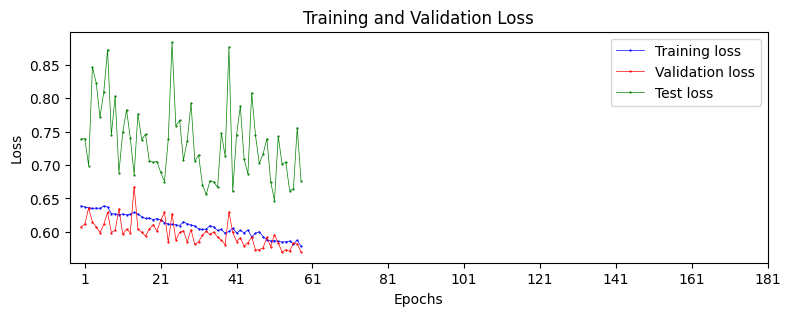

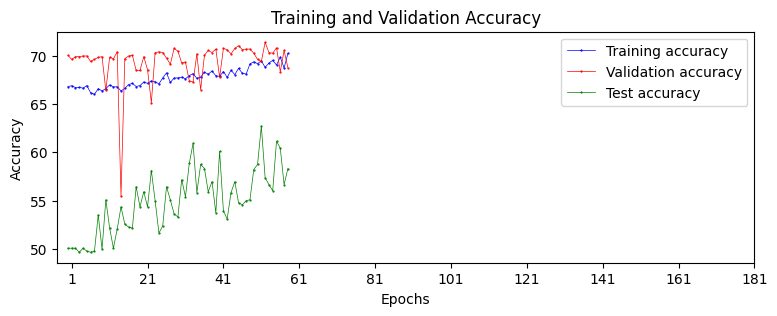


-------epoch:------------ 59  learning_rate 0.0003333333333333333
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1080, -0.1695],
        [ 0.2123,  0.2117],
        [ 1.1967, -0.7648],
        [ 0.1791, -0.1444],
        [-0.0572,  0.9787],
        [ 0.7143, -0.4671],
        [-0.2389,  0.3798],
        [-0.3666,  0.5653],
        [ 0.8666, -0.9409],
        [ 0.1726, -0.3405]], device='cuda:2', grad_fn=<

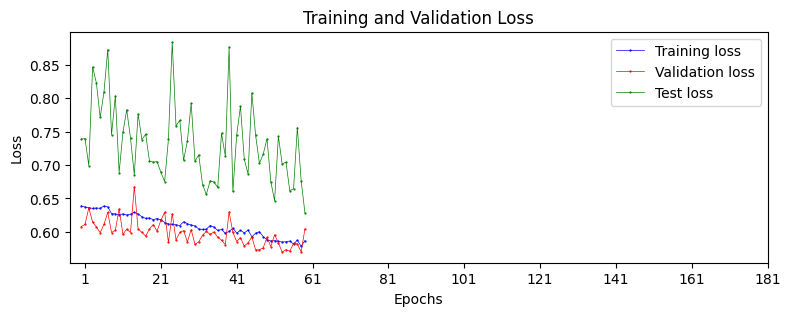

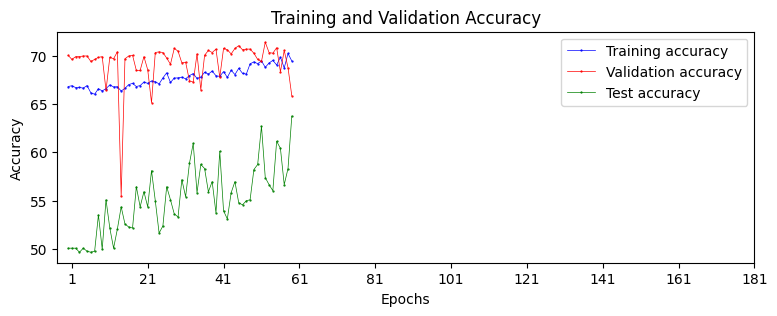

60 0.0002222222222222222

-------epoch:------------ 60  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1362,  0.1372],
        [-0.0783,  0.5233],
        [-0.0201,  0.1791],
        [-0.0875, -0.1290],
        [ 0.1753,  0.0623],
        [ 0.2991, -0.3834],
        [-0.0263,  0.0611],
        [ 0.2677, -0.1087],
        [ 0.1714, -0.4652],
        [ 0.1350, -0.0544]], d

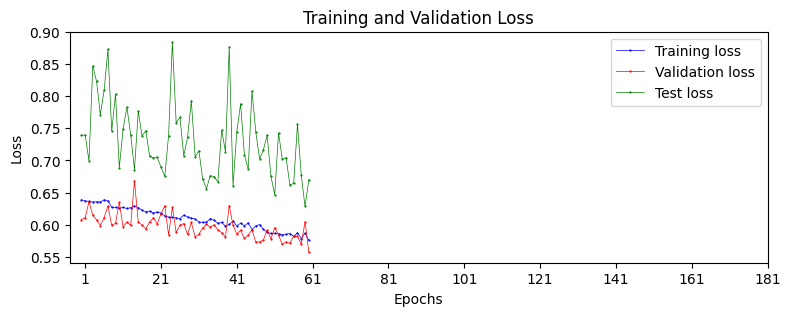

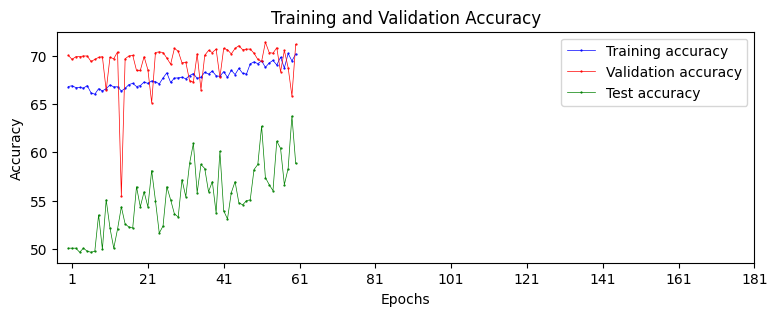


-------epoch:------------ 61  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1755, -0.1424],
        [ 0.0618, -0.4502],
        [ 1.2192, -1.2237],
        [ 0.0891, -1.1041],
        [ 1.1221, -1.1925],
        [-0.0196,  0.3110],
        [ 0.3599, -0.3887],
        [-0.0579, -0.0897],
        [-0.0217,  0.2049],
        [ 0.6063, -0.8471]], device='cuda:2', grad_fn=<

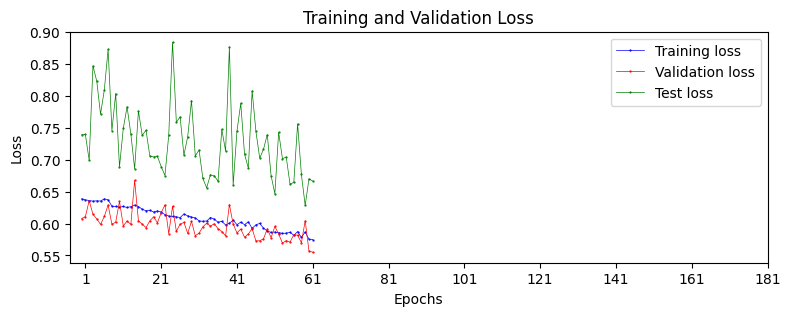

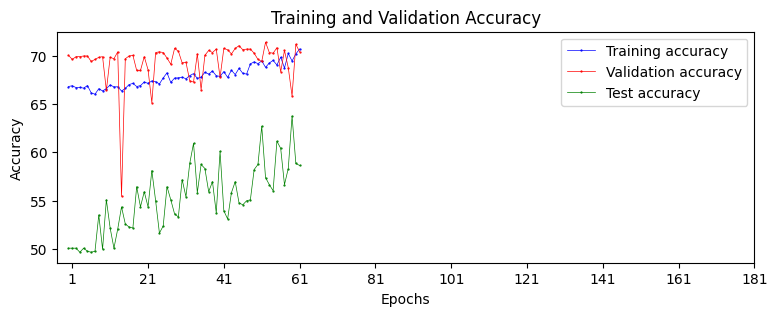


-------epoch:------------ 62  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6890, -0.5086],
        [ 0.7524, -0.4809],
        [ 0.4605, -0.1306],
        [ 1.3890, -1.5731],
        [ 0.2064, -0.3324],
        [ 0.6222, -0.3523],
        [ 0.1045,  0.0123],
        [ 0.5438, -0.6771],
        [ 0.4514, -0.3968],
        [ 0.4237,  0.1220]], device='cuda:2', grad_fn=<

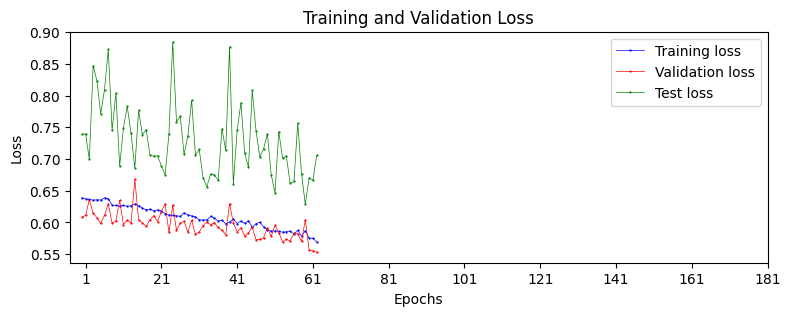

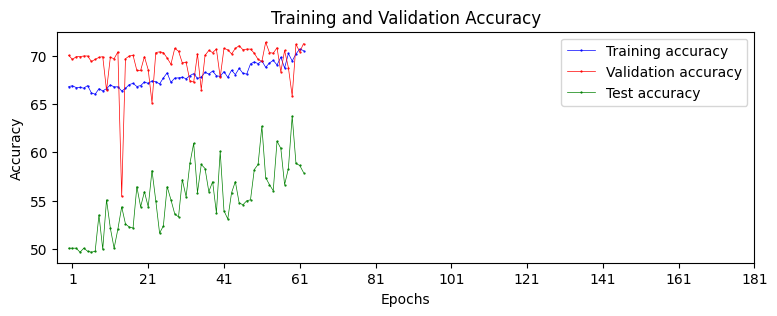


-------epoch:------------ 63  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1761,  0.4915],
        [ 0.9987, -1.3477],
        [ 0.3552, -0.0115],
        [ 0.8166, -0.6858],
        [ 0.0250, -0.3369],
        [-0.0594,  0.5371],
        [ 0.7544, -0.1803],
        [ 1.1800, -1.1172],
        [ 0.8390, -0.9051],
        [-0.3225,  1.2408]], device='cuda:2', grad_fn=<

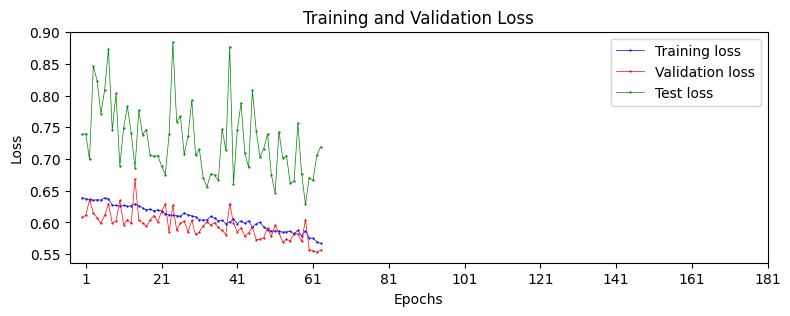

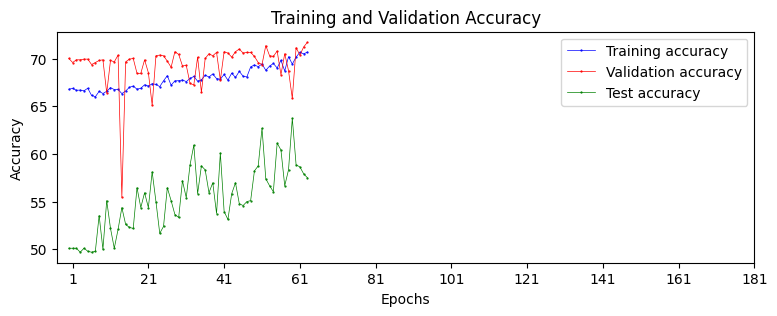


-------epoch:------------ 64  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.5351,  1.1481],
        [ 0.3778, -0.4176],
        [ 0.4673, -0.3977],
        [ 0.0326,  0.4003],
        [ 0.9469, -1.0363],
        [ 0.0712, -0.5766],
        [ 0.6508, -0.4779],
        [-0.2377, -0.2893],
        [-0.0831,  0.2928],
        [ 0.5698, -0.9043]], device='cuda:2', grad_fn=<

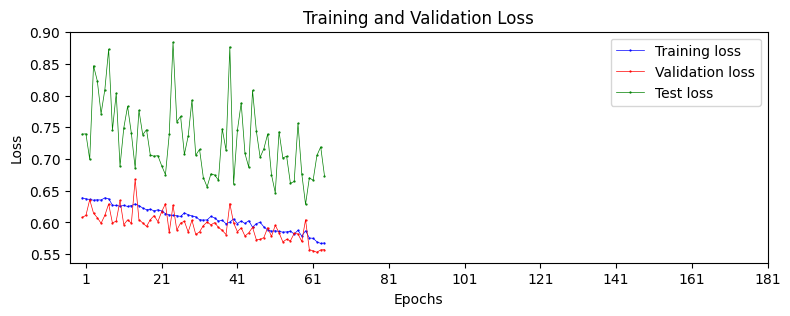

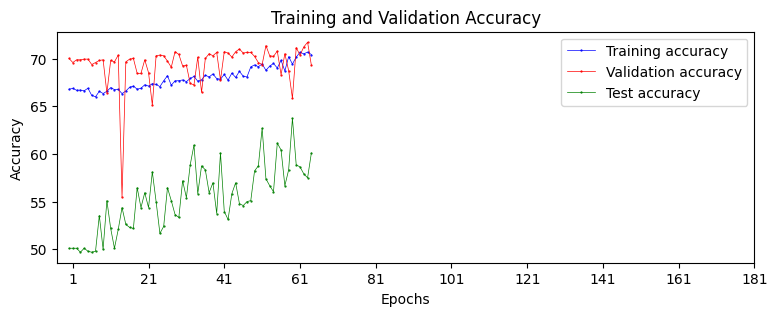


-------epoch:------------ 65  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9310, -0.9832],
        [ 1.0400, -1.5670],
        [ 0.8651, -1.1316],
        [ 1.2023, -0.9807],
        [ 0.2349, -0.4438],
        [ 0.2256,  0.0238],
        [-0.0880, -0.1914],
        [-0.1302,  0.2213],
        [ 0.1998,  0.2271],
        [ 0.6542, -0.5547]], device='cuda:2', grad_fn=<

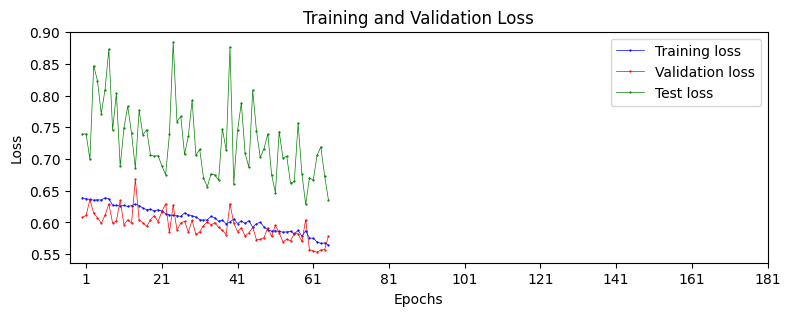

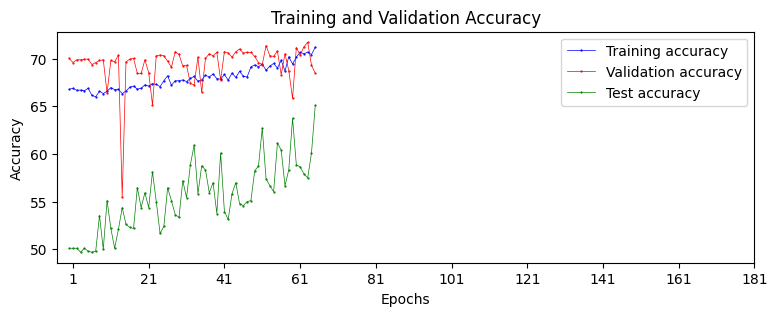


-------epoch:------------ 66  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1930, -0.2497],
        [-0.4214,  0.1183],
        [ 0.8096, -0.2402],
        [ 0.2329,  0.5520],
        [ 1.1994, -1.5817],
        [ 0.4109, -0.7235],
        [ 0.1624, -0.1006],
        [-0.0759,  0.3278],
        [ 0.0478,  0.2190],
        [ 0.5607, -0.8854]], device='cuda:2', grad_fn=<

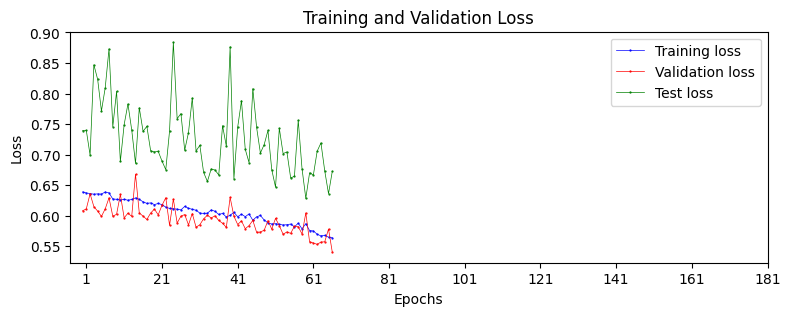

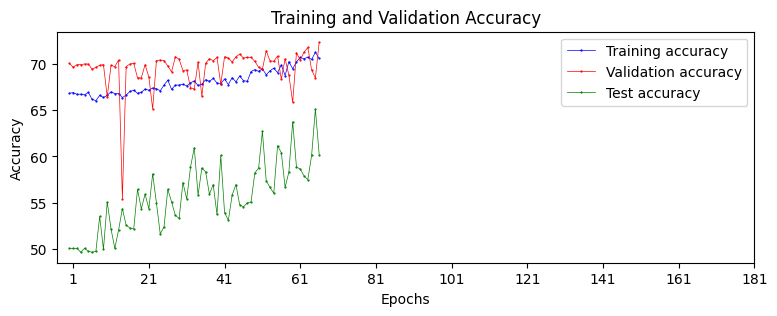


-------epoch:------------ 67  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3248, -0.4527],
        [ 0.5210,  0.5118],
        [ 0.2746, -0.4393],
        [-0.0803,  0.1865],
        [ 1.4729, -1.5075],
        [ 0.3276,  0.4376],
        [ 0.0419, -0.3795],
        [ 0.0535,  0.3251],
        [ 0.5265,  0.0922],
        [ 0.4721, -0.6253]], device='cuda:2', grad_fn=<

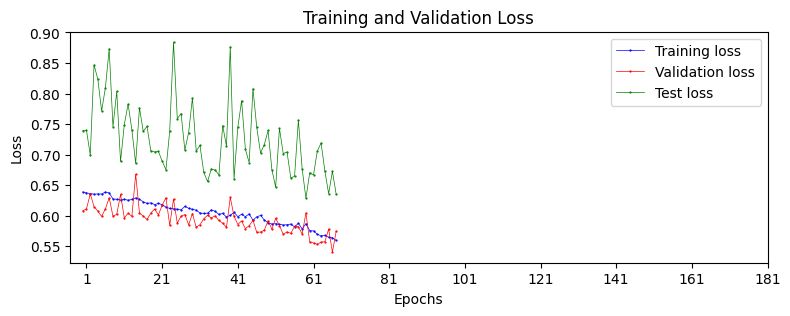

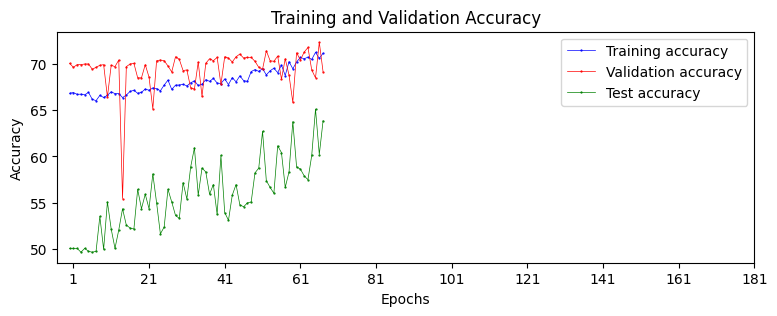


-------epoch:------------ 68  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0920,  0.3311],
        [ 0.4425, -0.5874],
        [ 0.1723, -0.4666],
        [ 0.6106, -1.3493],
        [ 0.4919, -0.6569],
        [ 0.5514, -0.2166],
        [ 0.2071,  0.0790],
        [ 1.0004, -1.1278],
        [ 0.3279,  0.6954],
        [ 0.0594, -0.3404]], device='cuda:2', grad_fn=<

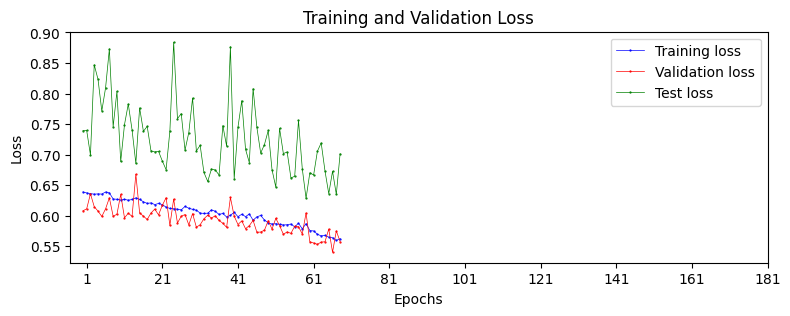

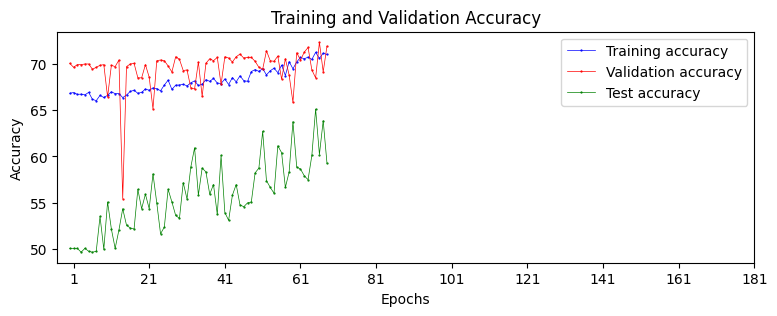


-------epoch:------------ 69  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5086, -0.4380],
        [-0.2887,  0.8292],
        [ 0.5314, -0.7196],
        [ 0.1336, -0.2851],
        [ 0.7314, -0.6066],
        [ 0.8893, -0.1108],
        [ 0.3600, -0.6863],
        [ 0.6083, -0.8887],
        [ 0.0287,  0.0437],
        [-0.4995,  1.0496]], device='cuda:2', grad_fn=<

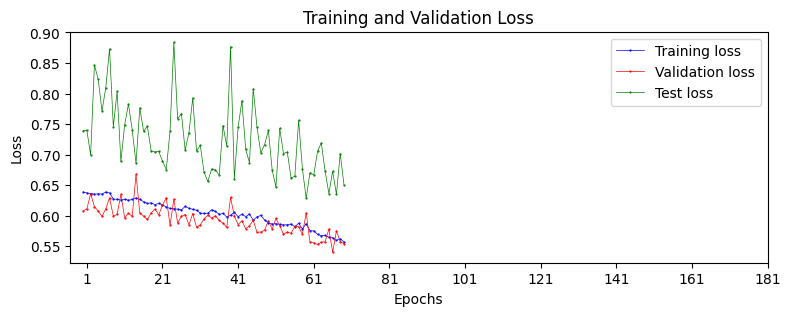

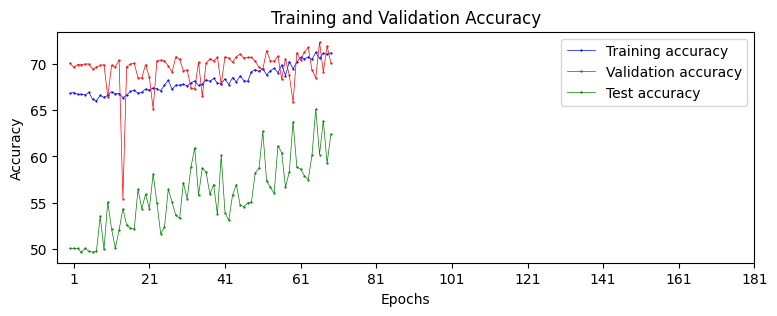


-------epoch:------------ 70  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4150, -0.0753],
        [ 0.6882, -0.7413],
        [ 1.7002, -2.4890],
        [ 1.9420, -1.7869],
        [ 0.8393, -0.9191],
        [ 0.0581, -0.0491],
        [ 0.2512, -0.1510],
        [ 1.9096, -1.5076],
        [ 0.5031, -0.5732],
        [ 0.1041,  0.0720]], device='cuda:2', grad_fn=<

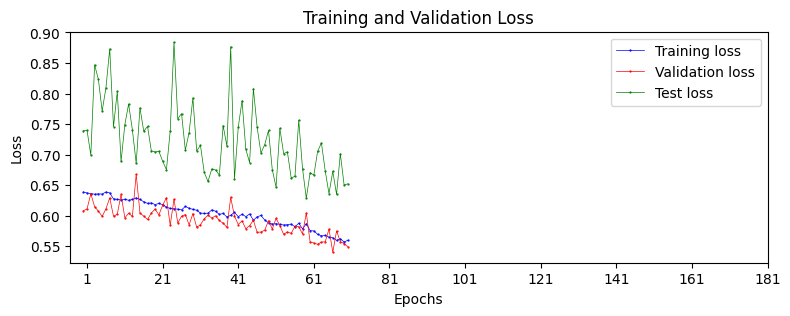

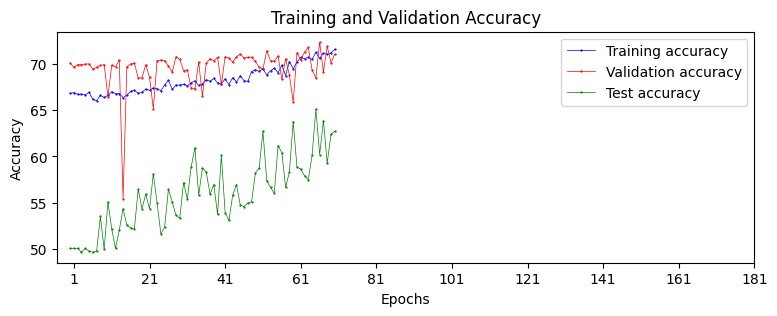


-------epoch:------------ 71  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.3368,  0.4788],
        [ 0.4501, -0.0089],
        [ 0.2551, -0.7802],
        [ 0.1900, -0.5718],
        [ 0.1928, -0.3492],
        [-0.5700,  0.2038],
        [ 0.4358, -0.8071],
        [ 0.0819,  0.2044],
        [ 1.7004, -1.7529],
        [ 0.2414,  0.2931]], device='cuda:2', grad_fn=<

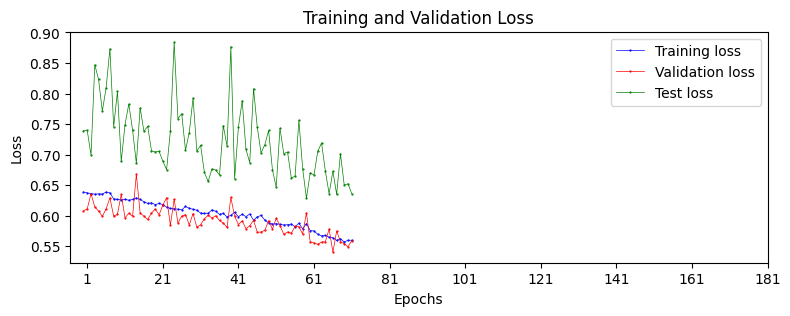

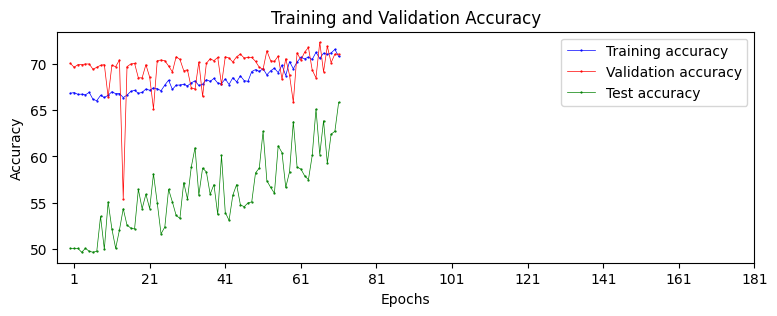


-------epoch:------------ 72  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0379, -0.4236],
        [-0.4044,  1.1405],
        [ 0.1222, -0.4171],
        [-0.1756,  0.5203],
        [ 0.9749, -1.2216],
        [ 0.3001, -0.4896],
        [ 0.4399, -0.1007],
        [ 0.4477, -0.4968],
        [-0.0711,  0.1041],
        [ 0.6461, -0.8851]], device='cuda:2', grad_fn=<

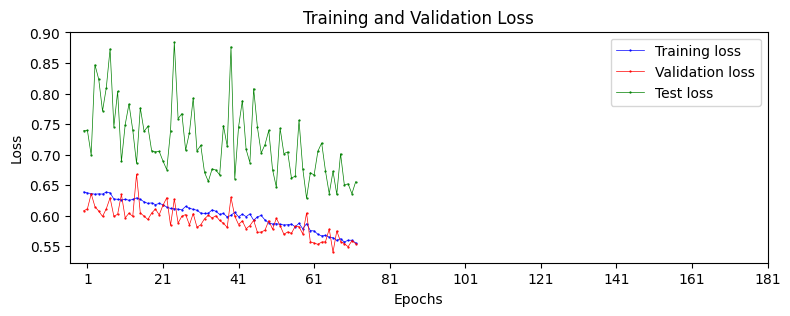

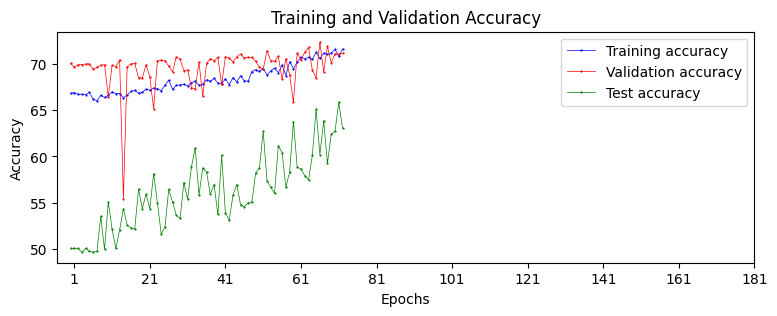


-------epoch:------------ 73  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.1499, -0.6664],
        [ 0.7146, -0.9389],
        [ 0.0016, -0.0994],
        [ 0.8034,  0.1068],
        [ 1.2695, -1.6154],
        [-0.1256,  0.4839],
        [ 0.2697,  0.6249],
        [ 0.1313, -0.0644],
        [ 0.1417, -0.3283],
        [ 0.0286,  0.3934]], device='cuda:2', grad_fn=<

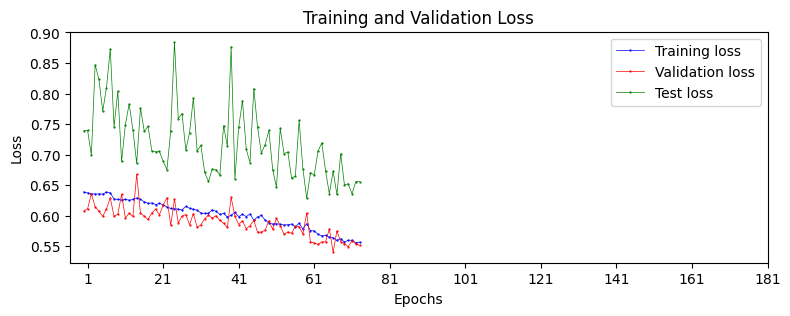

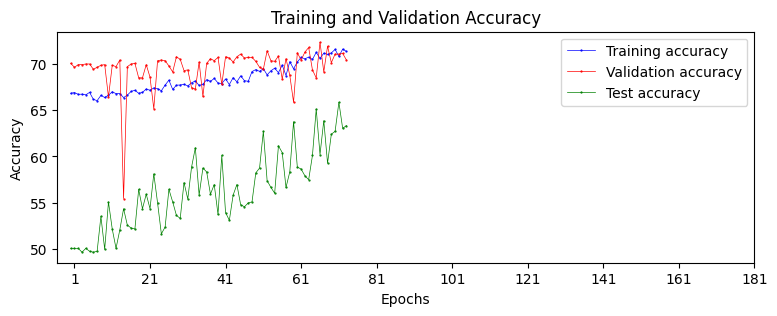


-------epoch:------------ 74  learning_rate 0.0002222222222222222
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6789, -0.4613],
        [ 0.3637, -0.1764],
        [ 0.7016, -0.8557],
        [ 0.2755,  0.2514],
        [ 0.9243, -1.0337],
        [-0.5709,  1.1040],
        [ 0.7110, -0.6542],
        [ 0.8303, -0.8617],
        [ 0.4914, -0.4549],
        [ 0.7748, -0.6507]], device='cuda:2', grad_fn=<

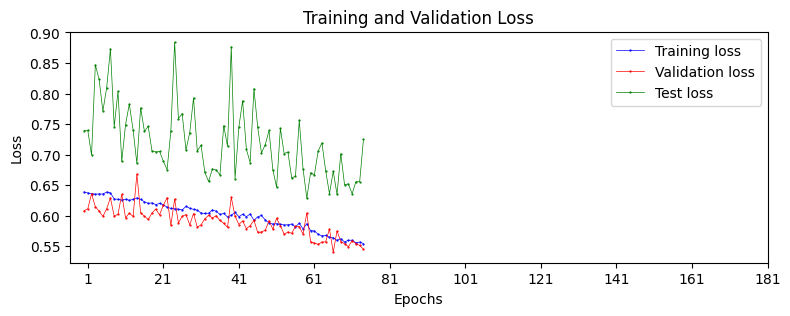

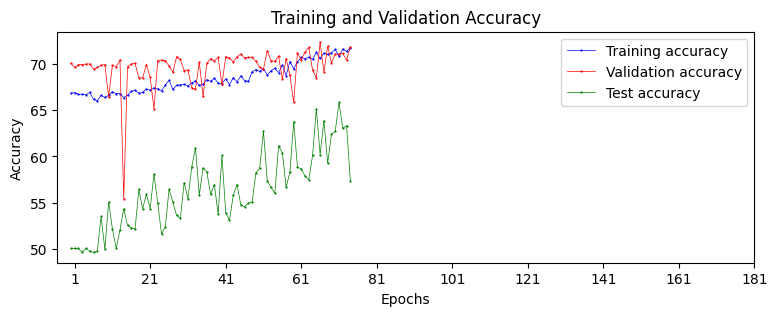

75 0.00014814814814814815

-------epoch:------------ 75  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1158,  0.2626],
        [-0.2289,  0.6615],
        [-0.0429,  0.3042],
        [ 0.2785, -0.6324],
        [-0.1705, -0.0096],
        [ 0.5308, -0.4132],
        [ 0.2704, -0.4933],
        [ 0.4432, -0.7895],
        [-0.4067,  0.6565],
        [ 1.0496, -2.0283]],

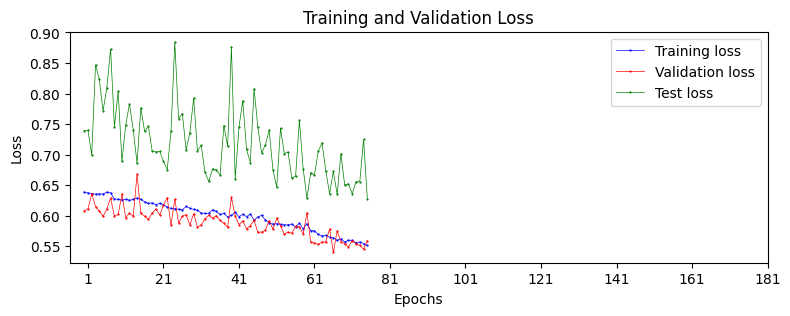

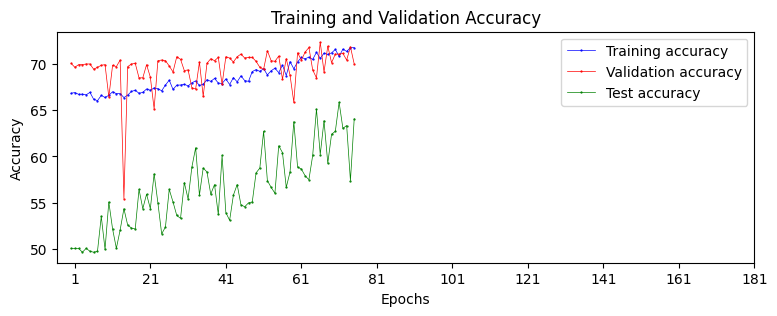


-------epoch:------------ 76  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4323, -0.3353],
        [ 2.0350, -1.9783],
        [ 0.5447, -0.5141],
        [-0.1990,  0.5391],
        [ 1.1551, -1.2404],
        [-0.0813,  0.4629],
        [ 0.5623, -0.0747],
        [-0.2578,  0.1469],
        [ 0.0238,  0.1707],
        [ 0.6997, -0.4141]], device='cuda:2', grad_fn=

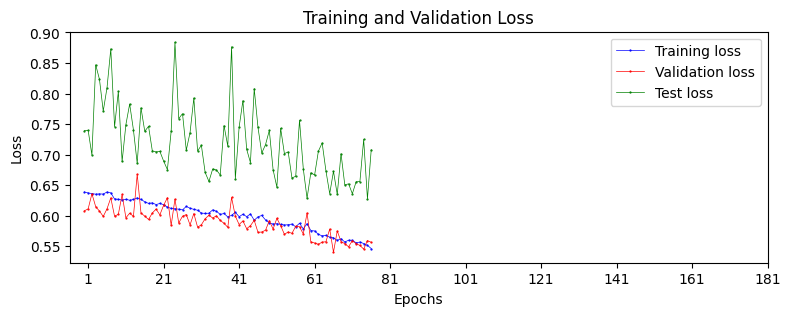

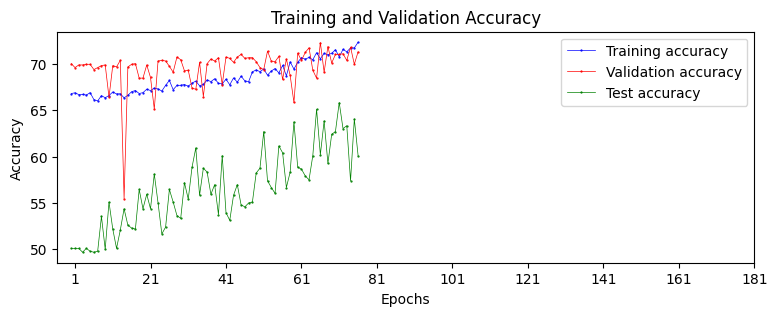


-------epoch:------------ 77  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0600, -0.2279],
        [-0.0441,  0.3330],
        [ 0.0490,  0.0945],
        [-0.2751,  0.8986],
        [ 0.1909,  0.1712],
        [ 0.1078, -0.1773],
        [ 0.8941, -0.3645],
        [ 0.5234, -0.9853],
        [-0.1765,  0.6241],
        [ 0.6718, -0.3387]], device='cuda:2', grad_fn=

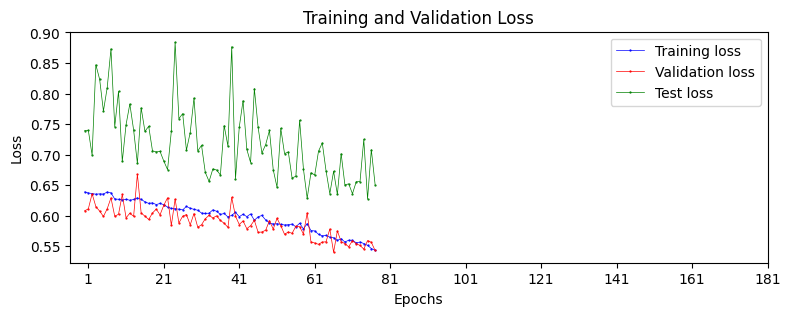

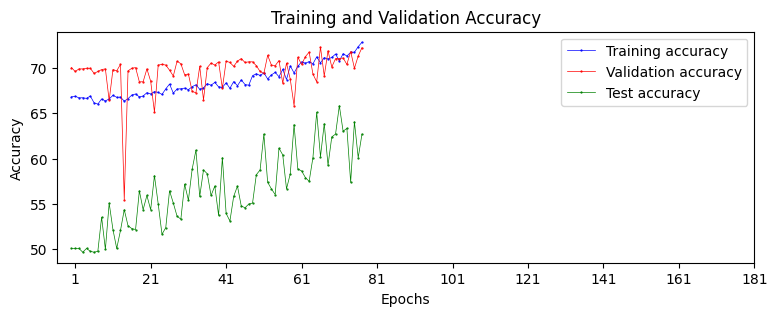


-------epoch:------------ 78  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3256, -0.3503],
        [ 2.1337, -2.4695],
        [ 1.0978, -1.5965],
        [ 1.2602, -0.4219],
        [ 0.4991, -0.2358],
        [ 0.3189, -0.3662],
        [ 0.8280, -0.4666],
        [ 1.6521, -1.6164],
        [ 0.3863, -0.2253],
        [ 0.1496, -1.3129]], device='cuda:2', grad_fn=

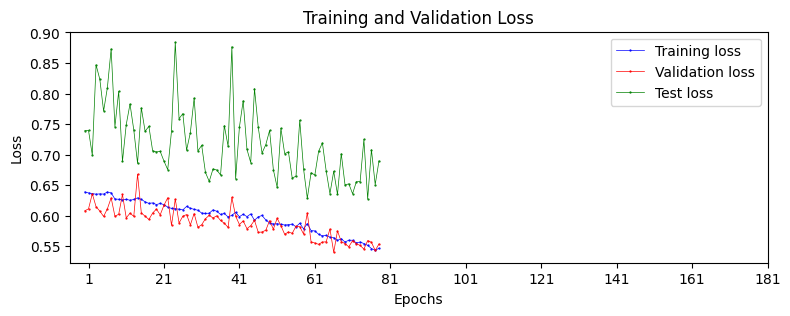

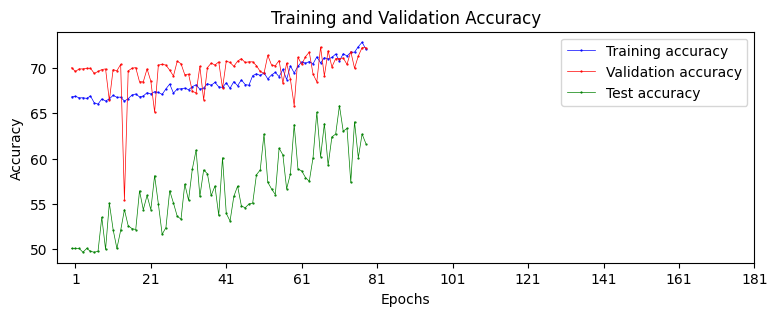


-------epoch:------------ 79  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0219,  0.8737],
        [-0.1277, -0.0297],
        [ 0.0819,  0.1459],
        [ 1.5967, -0.8597],
        [ 0.2717, -0.0885],
        [ 1.6619, -1.7447],
        [ 0.0655,  0.0582],
        [ 1.7302, -1.7085],
        [-0.4645,  0.3553],
        [ 0.0385,  0.1003]], device='cuda:2', grad_fn=

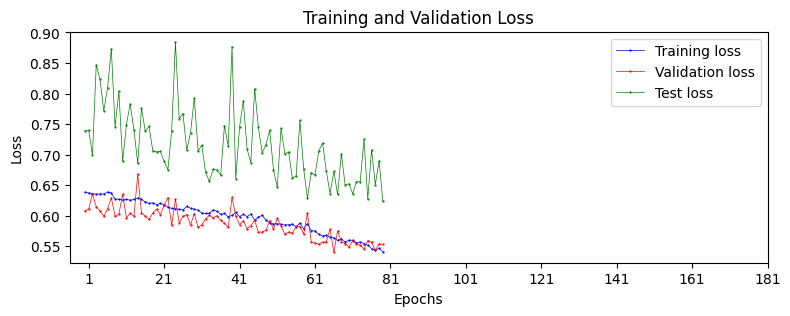

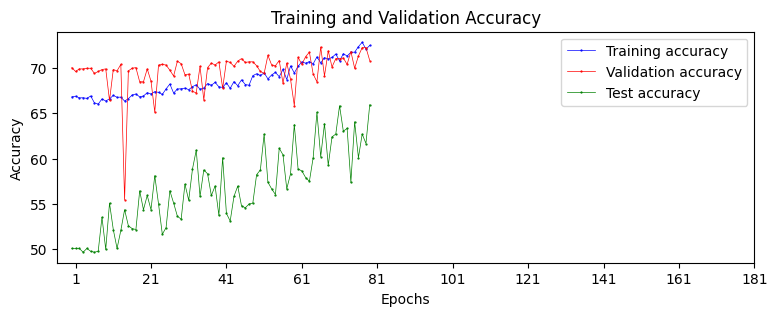


-------epoch:------------ 80  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9546, -0.9984],
        [ 0.0849, -0.5650],
        [ 0.5814, -0.6171],
        [ 0.3440, -0.1842],
        [ 0.4959, -0.4235],
        [ 0.6122, -1.1000],
        [ 0.6093, -0.6586],
        [-0.1209, -0.1176],
        [-0.0145,  0.1555],
        [ 0.6087, -0.3253]], device='cuda:2', grad_fn=

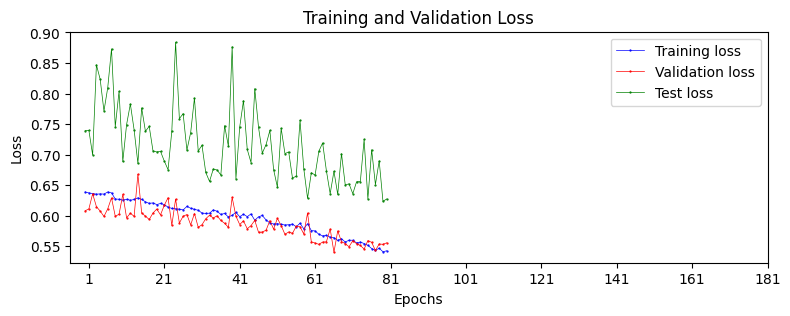

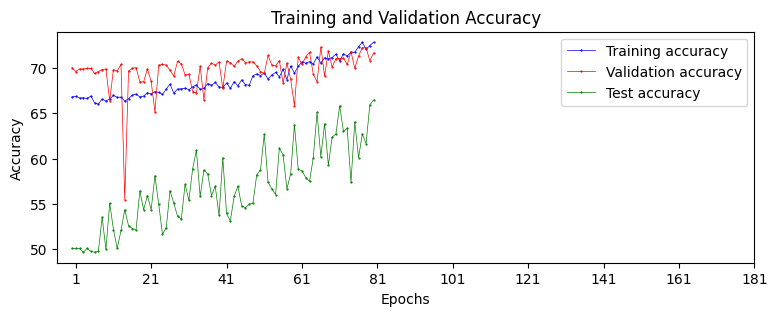


-------epoch:------------ 81  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.3896,  0.5126],
        [-0.4824,  0.8750],
        [ 0.0501, -0.1985],
        [ 1.9067, -1.9864],
        [ 1.1093, -0.6944],
        [ 0.5733, -0.8007],
        [ 0.1468,  0.9224],
        [ 0.3033, -0.1158],
        [ 1.0294, -1.0392],
        [-0.4160,  0.0165]], device='cuda:2', grad_fn=

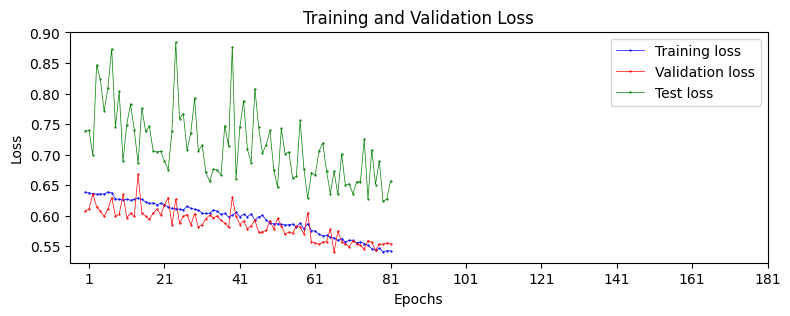

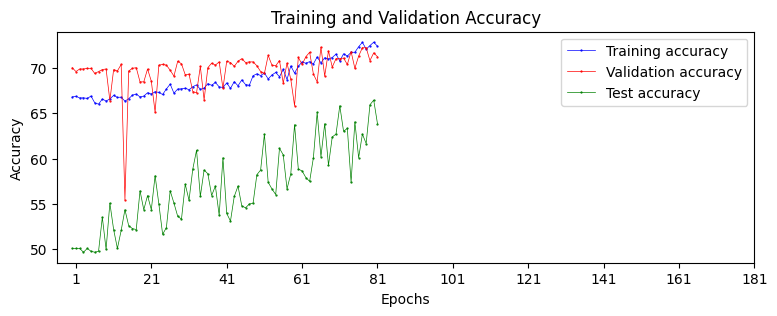


-------epoch:------------ 82  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0774, -0.1160],
        [ 1.2619, -1.1609],
        [ 0.3281, -0.4804],
        [ 0.4760, -1.2863],
        [-0.3905,  0.3150],
        [ 0.9752, -0.2697],
        [ 0.2429, -0.9108],
        [ 0.5344, -0.4217],
        [ 0.5648, -1.2355],
        [-0.4163,  0.2038]], device='cuda:2', grad_fn=

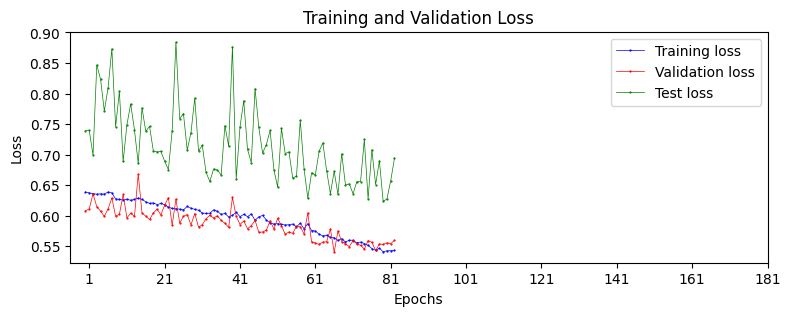

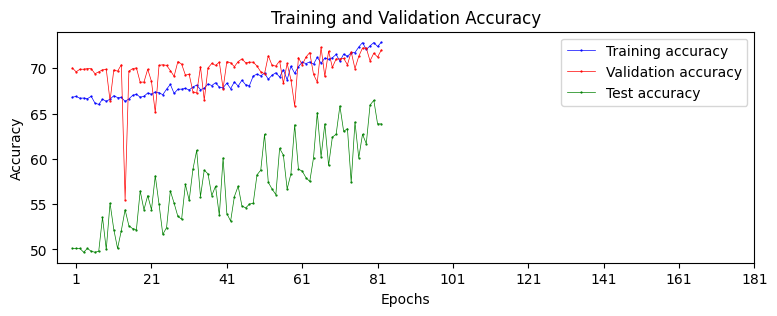


-------epoch:------------ 83  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5442, -0.3203],
        [ 1.3057, -0.9410],
        [ 0.9696, -1.0434],
        [ 0.8188, -0.5529],
        [-0.0564, -0.3063],
        [ 1.7418, -2.0088],
        [ 0.2258, -0.5437],
        [ 0.7217, -1.2912],
        [ 0.7619, -0.8943],
        [ 1.2605, -1.1828]], device='cuda:2', grad_fn=

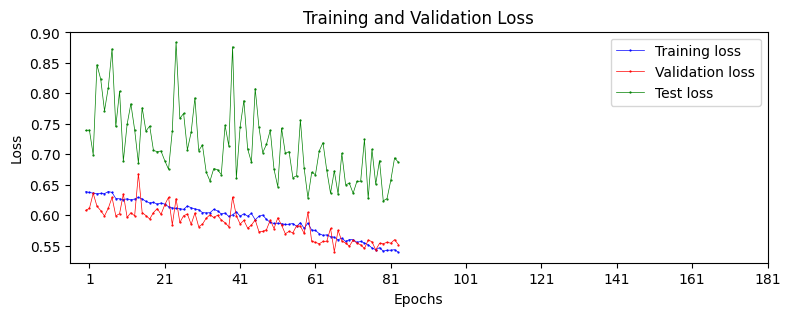

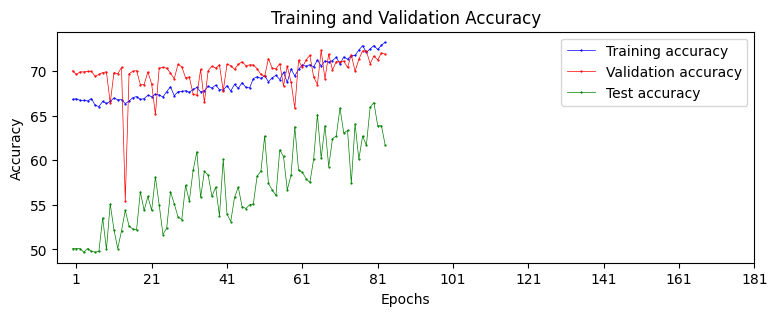


-------epoch:------------ 84  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.2862, -1.6203],
        [-0.1770,  0.2072],
        [ 0.5850,  0.4069],
        [ 1.1494, -0.8228],
        [ 1.0874, -2.1513],
        [ 0.3013, -0.7806],
        [ 1.8228, -1.2243],
        [ 0.2883, -0.0851],
        [ 0.6314, -0.7892],
        [ 0.3769,  0.3570]], device='cuda:2', grad_fn=

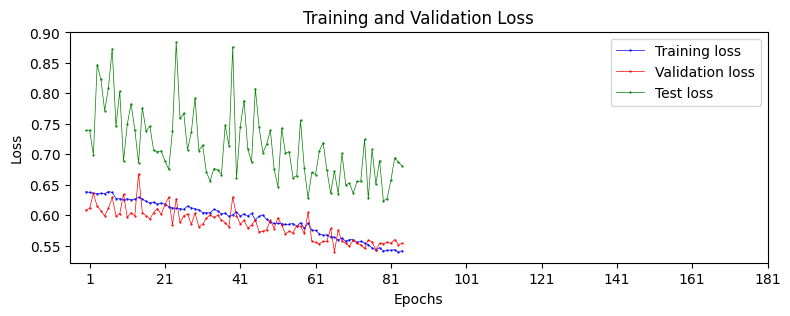

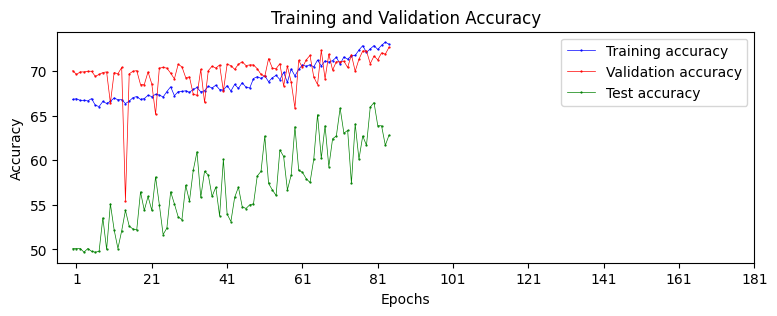


-------epoch:------------ 85  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5145, -0.6027],
        [ 0.3422, -0.4698],
        [-0.5594,  0.8691],
        [ 0.4654, -0.4640],
        [ 0.0347,  0.2771],
        [-0.2043,  0.0438],
        [ 1.9872, -1.9337],
        [ 0.5300, -0.3882],
        [ 0.1670, -0.1433],
        [ 0.5586, -0.4598]], device='cuda:2', grad_fn=

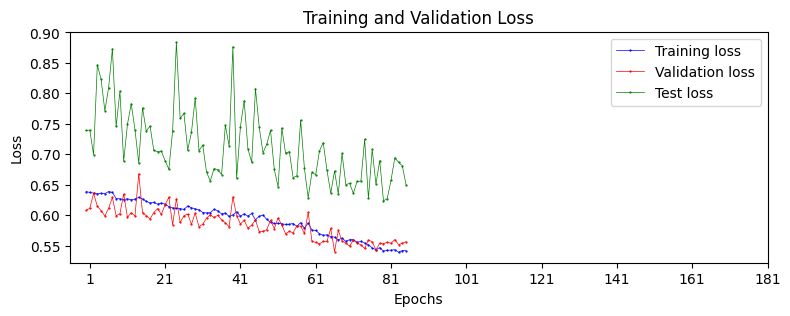

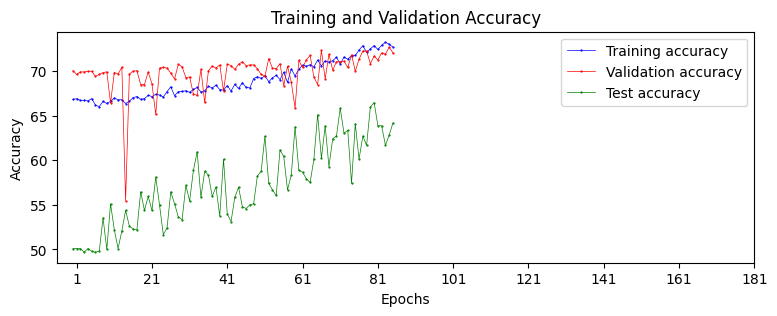


-------epoch:------------ 86  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.5572, -1.5060],
        [ 0.7057, -1.1123],
        [ 0.0926,  0.2308],
        [ 0.5611, -1.4873],
        [ 0.4305, -0.7600],
        [-0.0248,  0.2471],
        [ 1.0735, -0.9710],
        [-0.1319,  0.3332],
        [ 0.5856, -0.7687],
        [ 0.8078, -1.1900]], device='cuda:2', grad_fn=

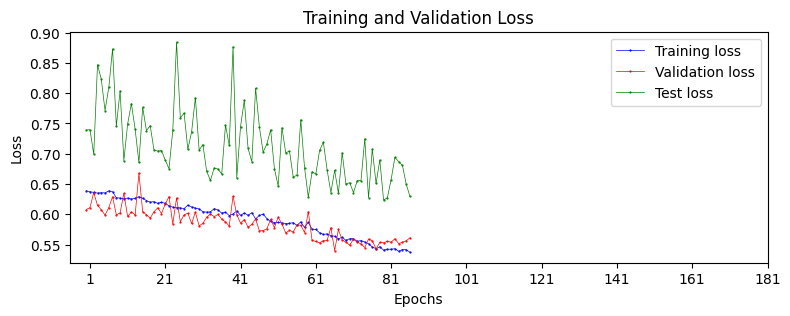

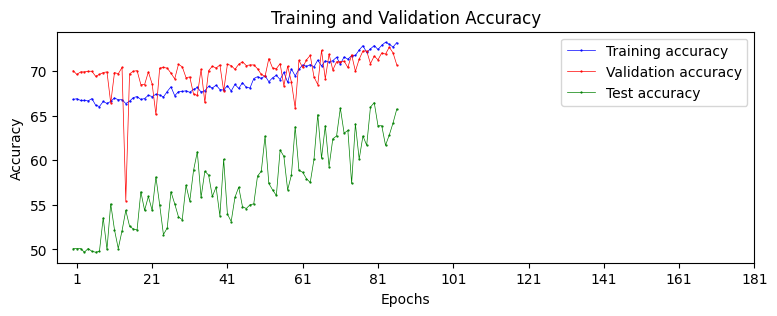


-------epoch:------------ 87  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.4724, -2.1690],
        [ 1.1271, -0.3874],
        [ 1.7057, -2.1229],
        [ 0.3931, -0.2444],
        [ 0.7720, -0.7029],
        [ 0.2538, -0.4755],
        [-0.0049,  0.1043],
        [ 0.8215, -1.4165],
        [ 0.6338, -0.6002],
        [ 0.6954, -0.5494]], device='cuda:2', grad_fn=

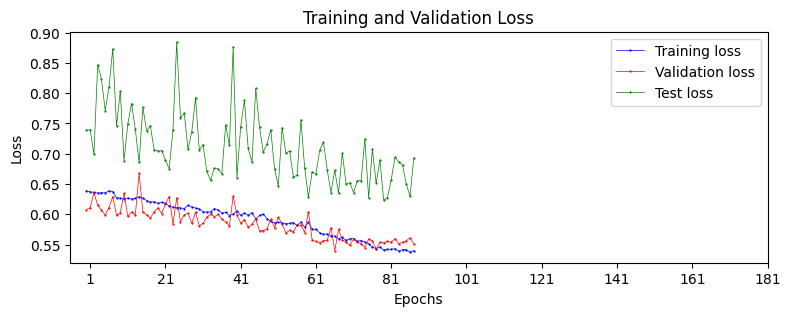

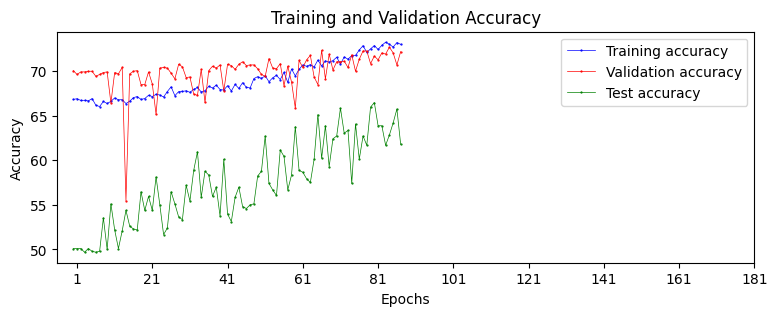


-------epoch:------------ 88  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0272,  0.0141],
        [ 0.5547, -0.8252],
        [ 0.1333, -0.5601],
        [ 0.1650, -0.5896],
        [ 0.5170, -0.5733],
        [ 0.6255, -0.6809],
        [ 0.2907, -0.6782],
        [ 0.4835, -0.2311],
        [-0.2837,  0.2108],
        [ 0.4530, -0.7579]], device='cuda:2', grad_fn=

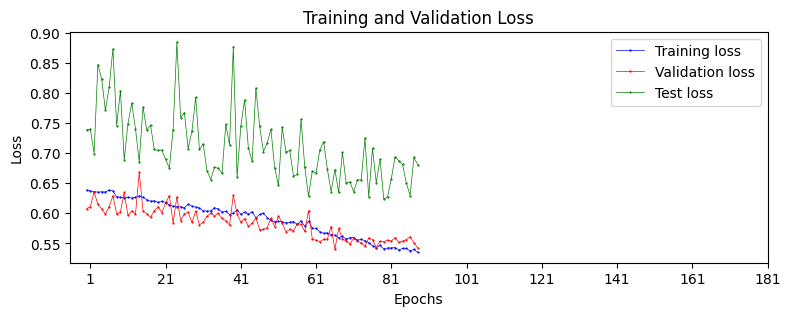

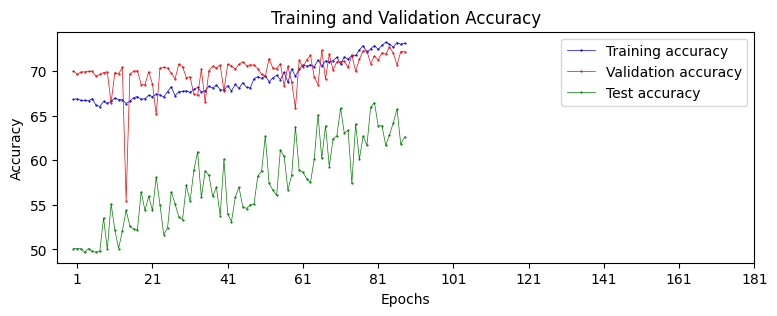


-------epoch:------------ 89  learning_rate 0.00014814814814814815
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9086, -0.4064],
        [-0.4245,  0.7727],
        [-0.4093,  0.5718],
        [ 0.9811, -1.3214],
        [ 1.0436, -1.0053],
        [ 0.5032, -0.4261],
        [ 0.7895, -1.4521],
        [-0.0891,  0.4070],
        [ 0.4413, -0.6608],
        [ 1.3746, -1.0861]], device='cuda:2', grad_fn=

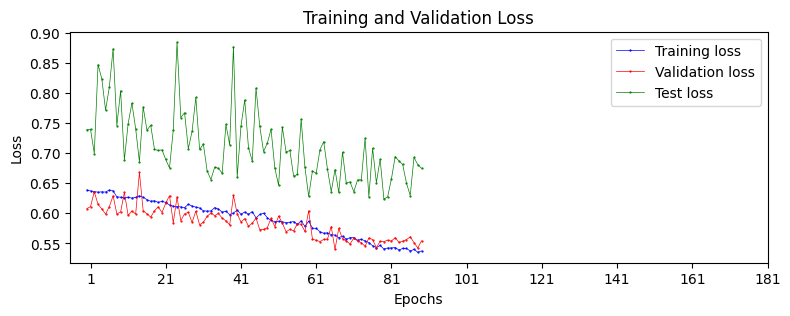

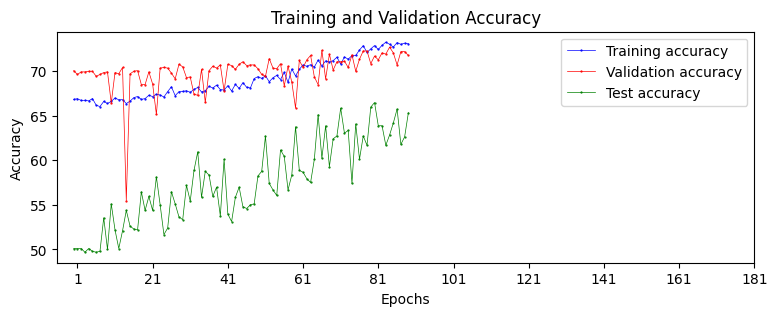

90 9.876543209876543e-05

-------epoch:------------ 90  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-1.0897e-01, -1.4958e+00],
        [-2.2961e-01,  6.0859e-01],
        [ 3.3468e-01, -1.5672e-01],
        [ 1.0331e+00, -8.1786e-01],
        [-1.1427e-01,  8.4981e-04],
        [ 2.9573e-02,  3.4013e-01],
        [ 7.6417e-01, -1.1752e+00],
        [-5.8437e-01,  6.9517e

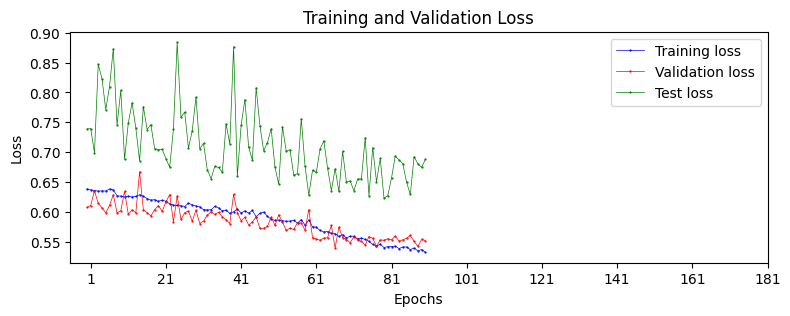

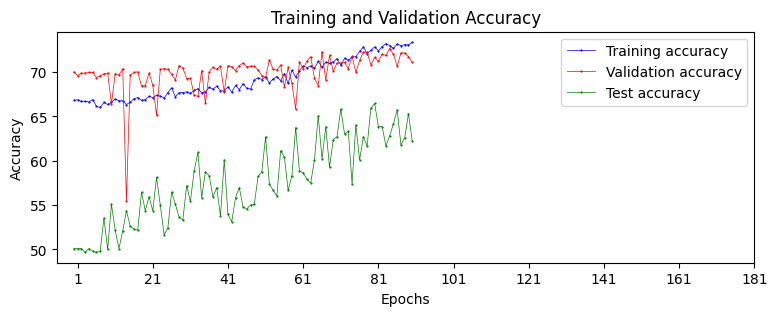


-------epoch:------------ 91  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1794,  0.4270],
        [ 1.6735, -1.8698],
        [ 0.7160, -0.4618],
        [ 0.5797, -0.2167],
        [ 1.4535, -1.2141],
        [ 1.8271, -1.2204],
        [ 0.8106, -1.0003],
        [-0.3109,  0.8833],
        [-0.1139,  0.3369],
        [-0.1840,  0.3915]], device='cuda:2', grad_fn=<

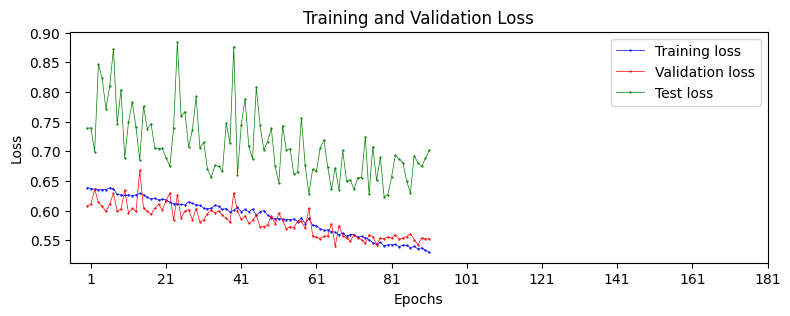

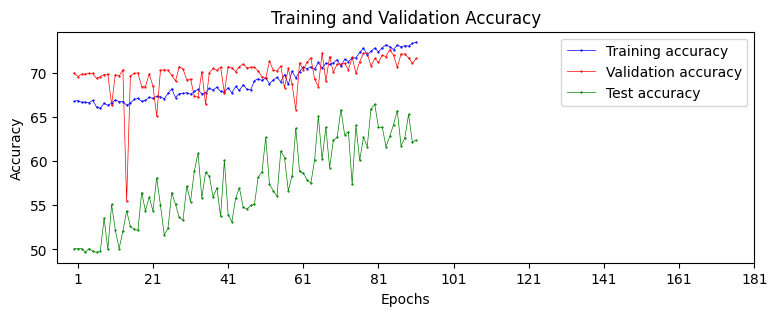


-------epoch:------------ 92  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2947,  0.1563],
        [-0.4392,  0.4433],
        [ 0.4352,  0.1770],
        [-0.0865, -0.3078],
        [ 0.5266, -0.2718],
        [ 0.3266, -0.1754],
        [ 2.0715, -1.5411],
        [ 1.0832, -1.6180],
        [-0.4808,  0.5921],
        [ 0.5976, -0.0744]], device='cuda:2', grad_fn=<

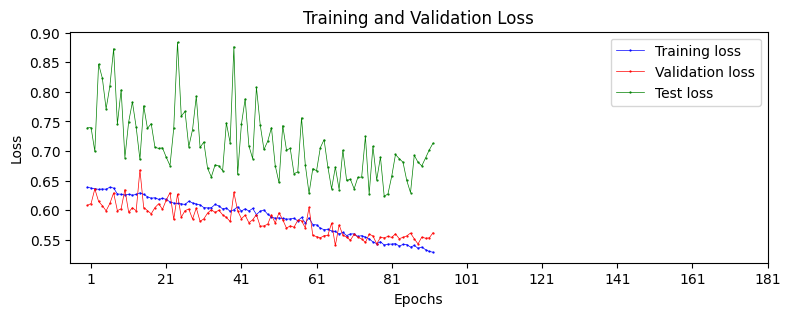

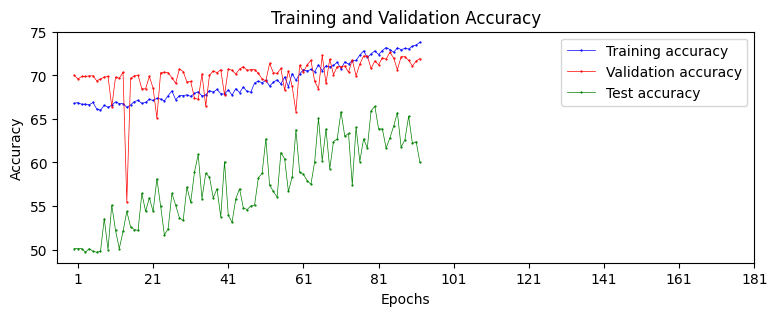


-------epoch:------------ 93  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.3526, -1.3470],
        [ 2.1310, -2.1352],
        [-0.4680,  0.0596],
        [-0.5280,  0.3227],
        [ 0.0250, -0.4496],
        [ 0.2403, -0.4487],
        [ 0.2866, -0.5916],
        [ 0.5788, -0.3904],
        [ 0.0304, -0.2054],
        [ 1.5664, -1.6023]], device='cuda:2', grad_fn=<

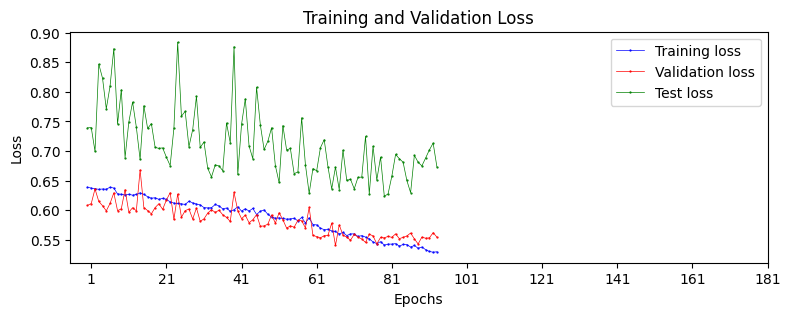

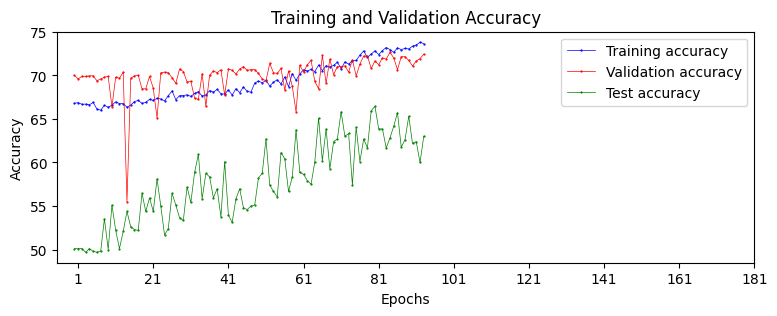


-------epoch:------------ 94  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.5755, -1.8314],
        [ 0.0323, -0.1292],
        [-0.1250, -0.0911],
        [ 0.5308, -0.2530],
        [ 0.0941,  0.5772],
        [-0.2288,  0.9899],
        [-0.1024,  0.4996],
        [ 0.1461,  0.2363],
        [ 0.4393, -0.7311],
        [ 2.0093, -2.0817]], device='cuda:2', grad_fn=<

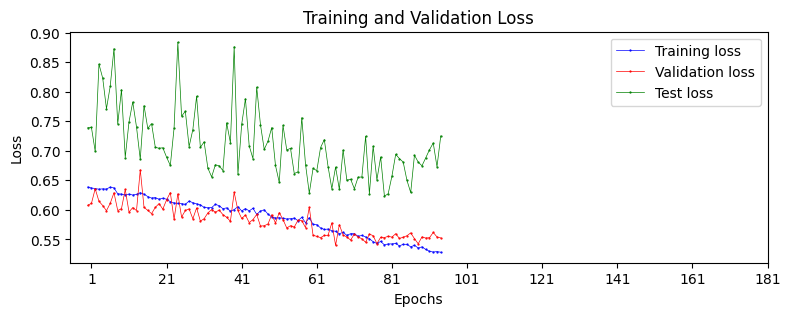

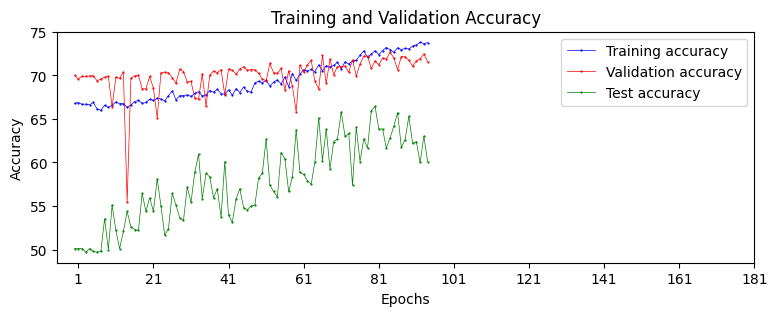


-------epoch:------------ 95  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.2800,  0.8009],
        [ 1.6132, -1.3736],
        [ 0.1719,  0.3694],
        [ 0.8436, -0.5942],
        [ 1.7585, -1.4064],
        [ 0.6917, -1.3873],
        [ 0.6792, -0.4274],
        [ 0.1271, -0.4489],
        [-0.7360,  0.2114],
        [ 0.2525, -0.2502]], device='cuda:2', grad_fn=<

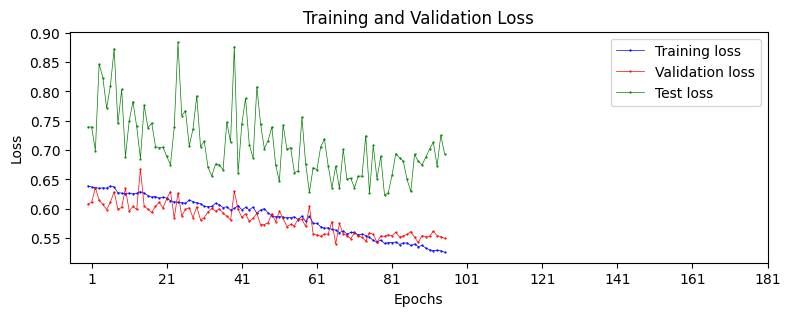

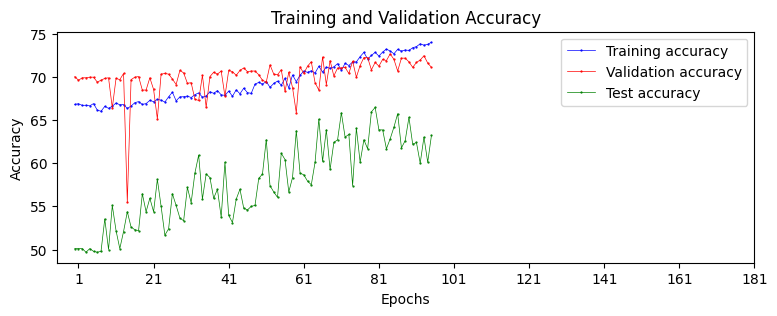


-------epoch:------------ 96  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0920, -0.4173],
        [-0.0037, -0.1424],
        [ 0.4524, -0.2243],
        [ 0.1196, -0.0056],
        [ 1.6502, -1.3671],
        [ 1.0347, -1.0609],
        [ 0.1625,  0.3733],
        [ 0.9834, -1.1588],
        [ 0.4271, -0.8909],
        [-0.3048,  0.0070]], device='cuda:2', grad_fn=<

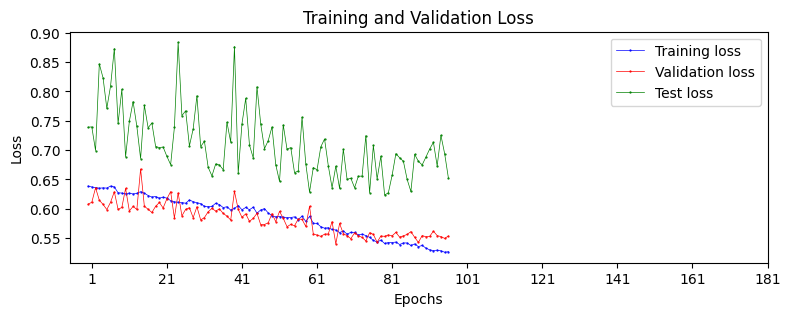

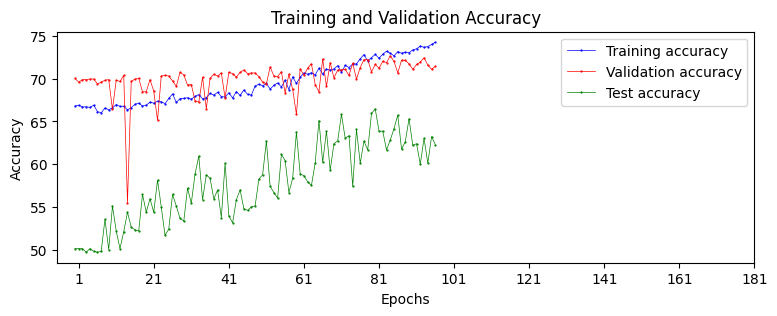


-------epoch:------------ 97  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.7835, -2.6334],
        [-0.0273, -0.1168],
        [ 0.3710, -0.5766],
        [-0.3714,  0.7265],
        [ 0.5216, -0.2111],
        [ 1.3688, -1.2403],
        [ 0.2847, -0.0116],
        [ 0.3254, -0.3063],
        [ 0.6055, -1.3495],
        [ 0.1532, -0.4037]], device='cuda:2', grad_fn=<

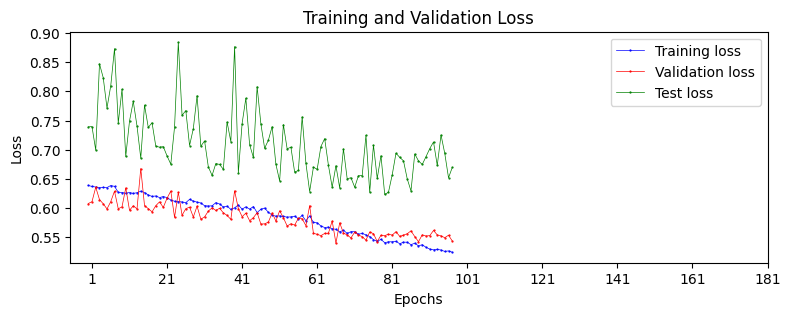

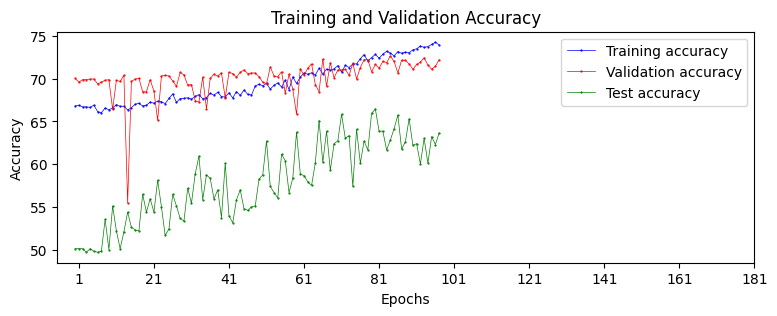


-------epoch:------------ 98  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.7337, -0.3887],
        [ 1.2743, -1.0417],
        [ 1.1576, -1.2420],
        [ 0.8790, -1.6426],
        [ 1.6727, -1.2609],
        [ 1.6199, -1.4046],
        [ 1.0825, -1.3318],
        [ 0.6254, -1.3444],
        [ 0.3166, -0.1922],
        [ 0.5198,  0.4246]], device='cuda:2', grad_fn=<

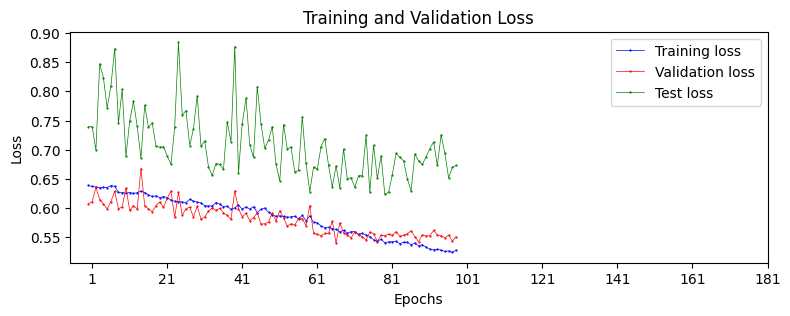

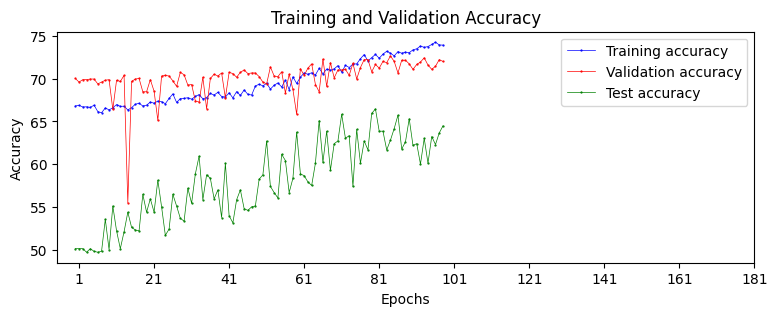


-------epoch:------------ 99  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0214,  0.5467],
        [ 0.4778, -0.0023],
        [ 0.2910,  0.0832],
        [ 0.4660, -0.2843],
        [ 0.0517,  0.4624],
        [ 0.5625, -0.4675],
        [ 1.4832, -1.5346],
        [ 0.5997, -0.2564],
        [ 0.8936, -0.3682],
        [-0.1562,  0.4143]], device='cuda:2', grad_fn=<

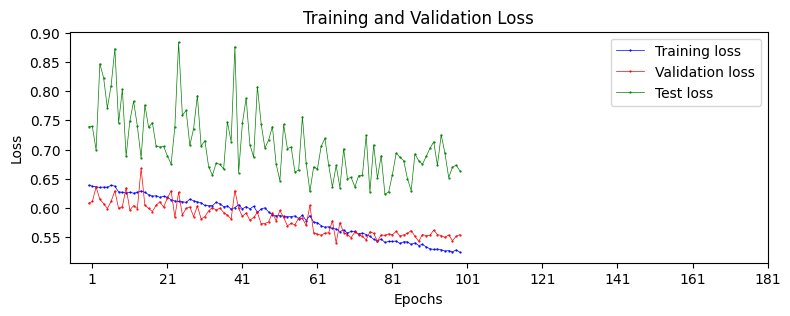

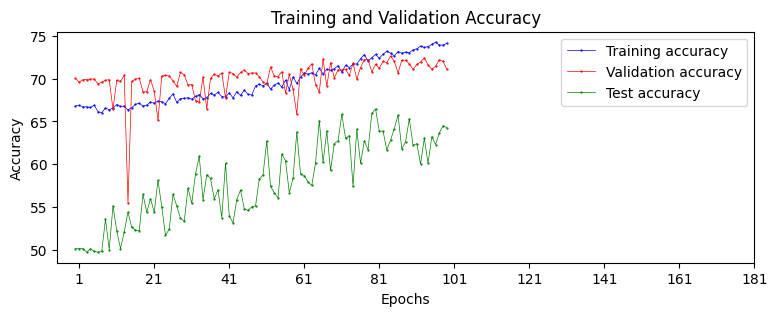


-------epoch:------------ 100  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3705, -0.3460],
        [ 0.5563, -0.0919],
        [ 0.8977, -1.6705],
        [-0.3023,  0.7706],
        [ 0.5590, -0.0234],
        [ 0.9815, -1.0379],
        [ 0.3709, -0.0120],
        [-0.0258,  0.2496],
        [ 0.3753, -0.7921],
        [-0.0875,  0.5624]], device='cuda:2', grad_fn=

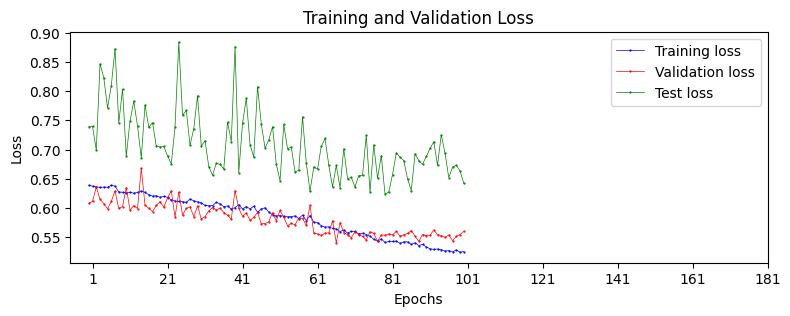

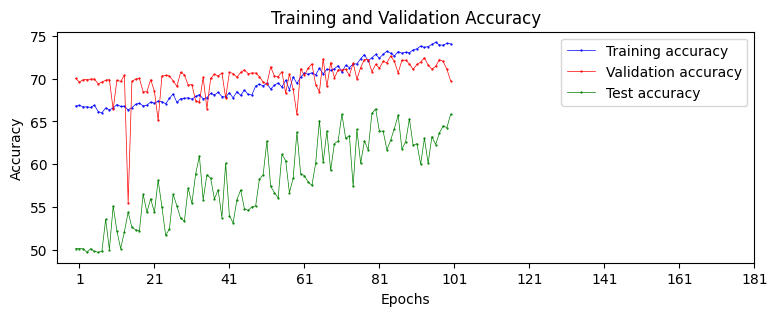


-------epoch:------------ 101  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.4281,  1.0120],
        [ 1.4006, -1.1142],
        [ 0.3292,  0.7107],
        [ 1.2101, -1.7095],
        [-0.3604,  0.4928],
        [ 0.8961, -1.1419],
        [ 0.5892, -0.4766],
        [ 0.3359, -0.5655],
        [ 0.6350, -1.0547],
        [ 1.0350, -0.8658]], device='cuda:2', grad_fn=

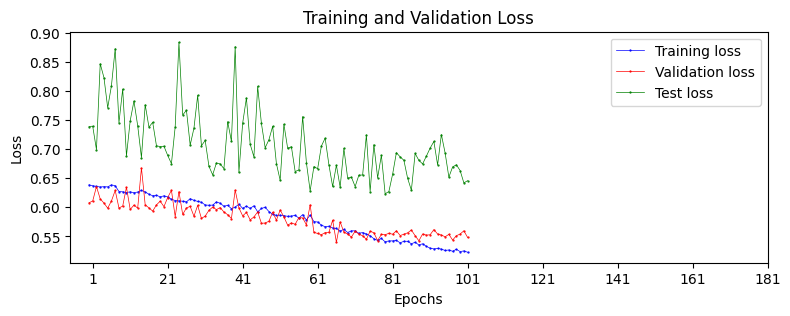

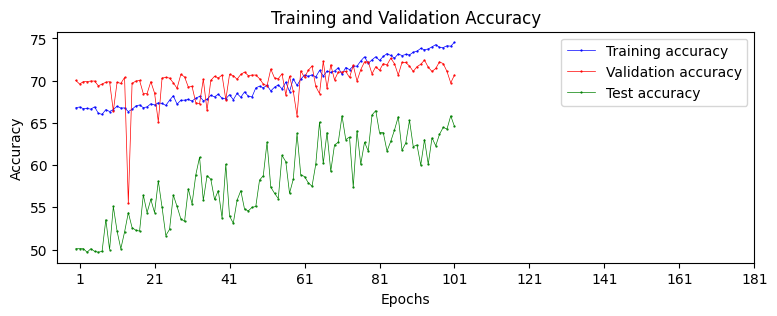


-------epoch:------------ 102  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1424,  0.0882],
        [ 0.6237, -0.0573],
        [ 0.6670, -0.6550],
        [ 0.0200, -0.0040],
        [ 0.6279, -0.5543],
        [-0.4119,  0.8441],
        [ 0.9970, -1.1573],
        [ 2.0445, -1.8957],
        [ 0.5190, -0.1694],
        [ 1.0083, -1.1620]], device='cuda:2', grad_fn=

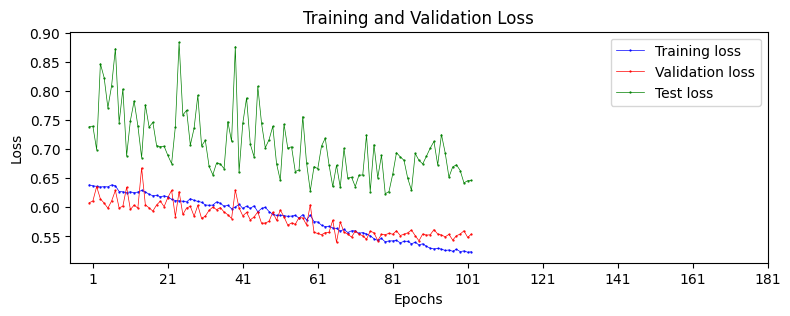

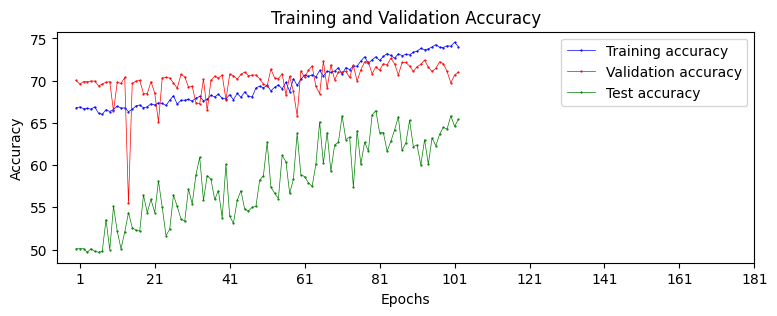


-------epoch:------------ 103  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.3574,  0.2903],
        [ 0.8975, -1.1460],
        [-0.6691,  0.6908],
        [ 0.1197, -0.2046],
        [-0.2755,  0.1870],
        [ 1.1712, -1.1339],
        [ 0.0481,  0.0636],
        [-0.6438,  1.0598],
        [ 1.6935, -2.2074],
        [-0.1433,  0.3028]], device='cuda:2', grad_fn=

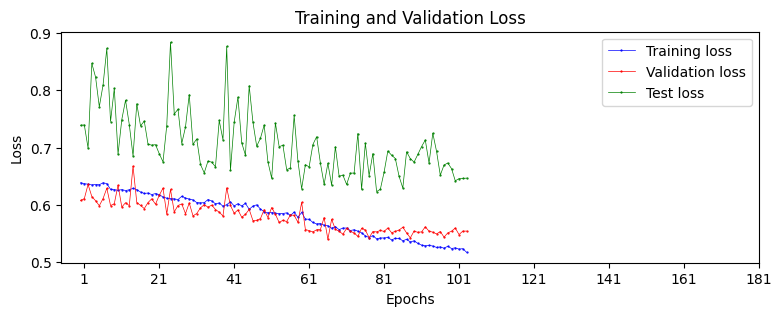

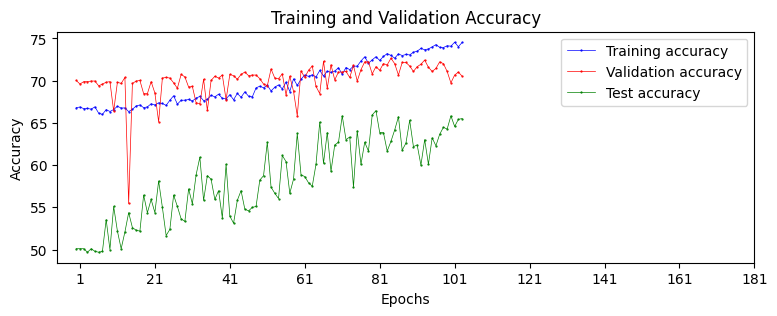


-------epoch:------------ 104  learning_rate 9.876543209876543e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4739, -0.9473],
        [ 0.9619, -0.9448],
        [-0.0329, -0.5931],
        [ 0.0973,  0.1611],
        [ 0.1218, -0.7644],
        [ 0.4630, -0.3376],
        [ 1.5805, -1.0125],
        [-0.0800,  0.0391],
        [ 1.7057, -1.4017],
        [ 0.5734, -0.1410]], device='cuda:2', grad_fn=

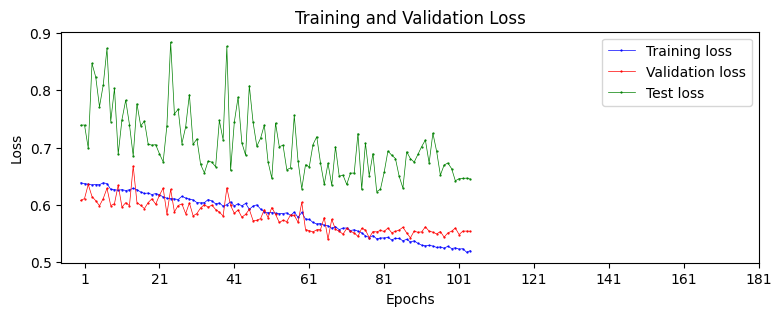

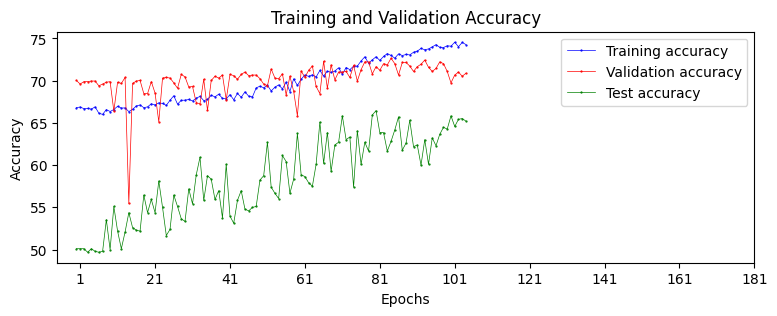

2__
105 4.938271604938271e-05

-------epoch:------------ 105  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2701, -0.5084],
        [ 0.3605, -1.0789],
        [-0.2899,  0.4110],
        [-0.6563,  0.9960],
        [ 0.2479,  0.4466],
        [ 0.2455,  0.4656],
        [ 0.5731, -0.9329],
        [ 0.3648, -1.0101],
        [-0.2703,  0.2507],
        [ 1.2602, -1.512

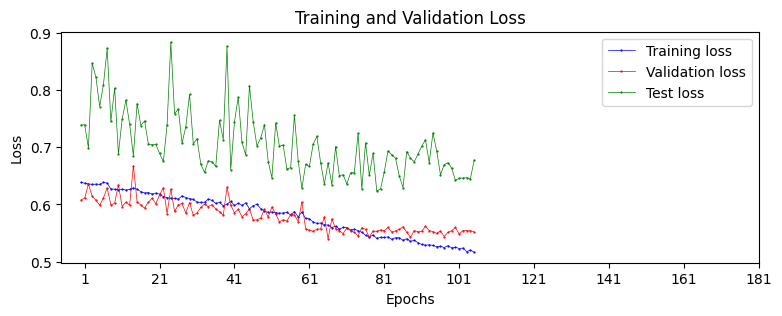

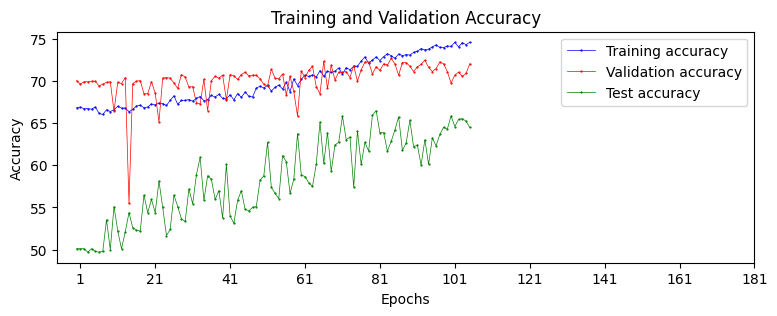


-------epoch:------------ 106  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1930,  0.6298],
        [ 1.2973, -2.0442],
        [-0.3568,  0.7754],
        [-0.0227,  0.4204],
        [ 1.0882, -0.3025],
        [ 0.9612, -1.2876],
        [ 0.5057, -0.1521],
        [ 0.1093,  0.1995],
        [ 0.3217, -0.2336],
        [-0.3970,  0.4070]], device='cuda:2', grad_fn=

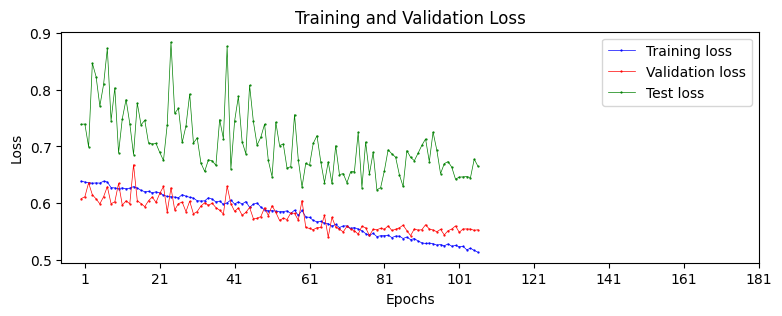

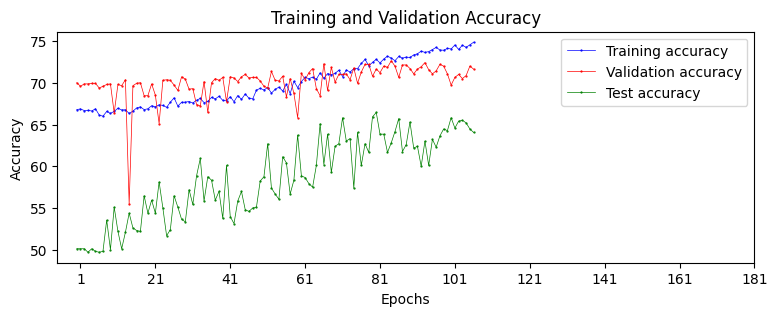


-------epoch:------------ 107  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.8533, -0.7236],
        [-0.1031,  0.0966],
        [-0.6014,  1.5995],
        [ 0.1252,  0.0352],
        [ 0.4746,  0.4599],
        [ 1.1105, -0.9966],
        [ 0.5862, -1.2006],
        [ 0.6434, -0.1211],
        [ 1.4030, -2.1312],
        [ 0.1124, -0.0730]], device='cuda:2', grad_fn=

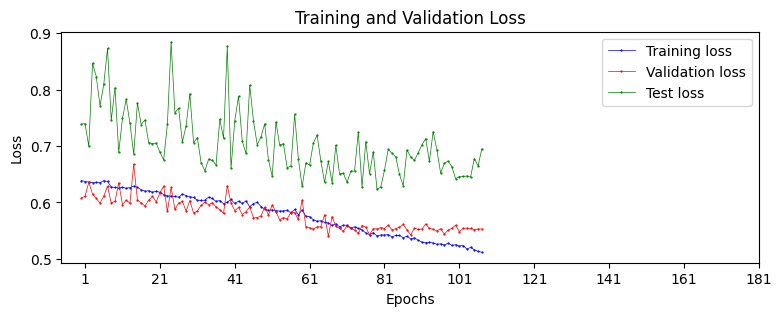

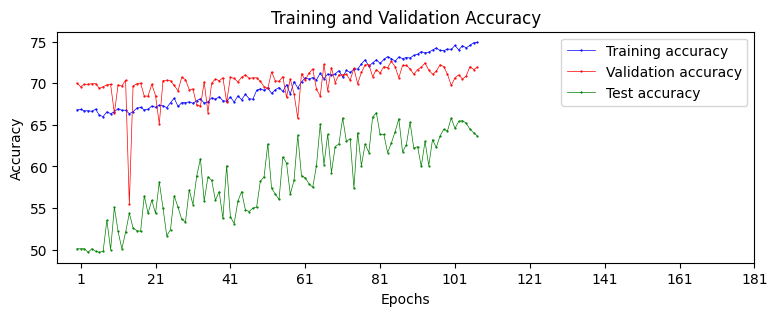


-------epoch:------------ 108  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.6495, -2.3427],
        [ 0.6484, -1.2608],
        [ 0.1035,  0.0815],
        [ 0.4546, -0.6959],
        [-0.0782,  0.6970],
        [ 0.6714, -1.0355],
        [ 1.3168, -1.3843],
        [ 1.0224, -1.3058],
        [ 0.5616, -1.1912],
        [-0.1616,  0.5515]], device='cuda:2', grad_fn=

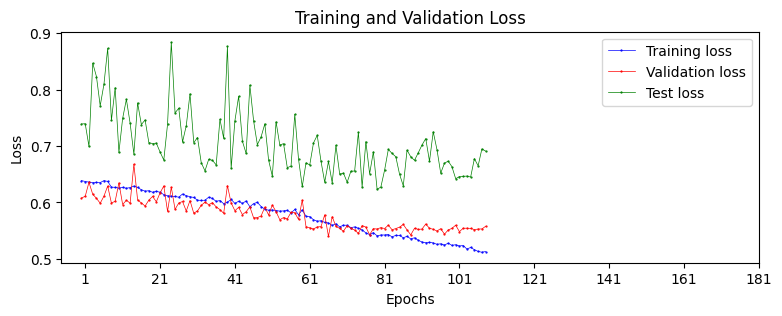

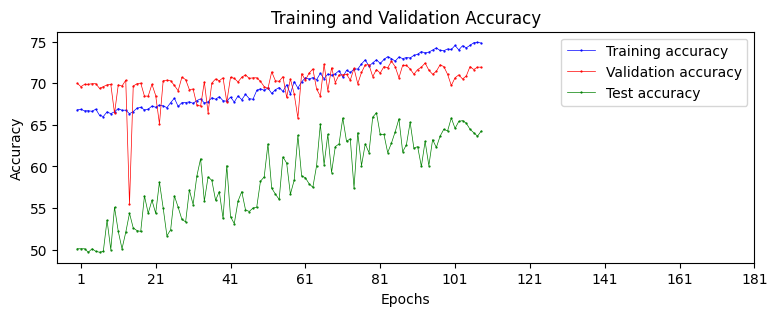


-------epoch:------------ 109  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.3849,  0.9248],
        [-0.3989,  0.7800],
        [-0.3070,  0.7967],
        [ 0.7290, -0.4555],
        [ 0.6075, -0.9594],
        [-0.6905,  0.5079],
        [-0.1703,  0.7350],
        [ 1.8441, -1.0180],
        [ 0.3952, -0.2252],
        [ 1.1390, -1.2626]], device='cuda:2', grad_fn=

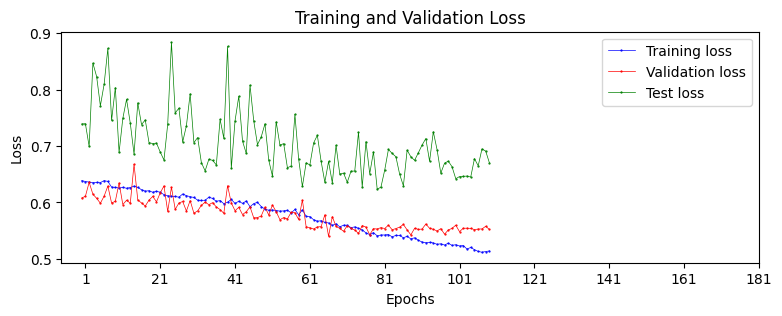

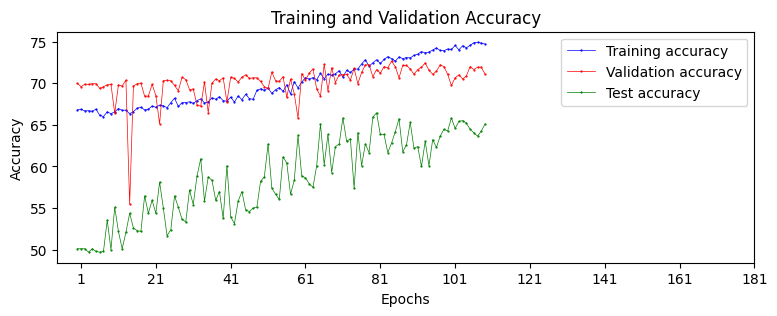


-------epoch:------------ 110  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0029,  0.4415],
        [ 0.5037, -0.1643],
        [-0.1445,  0.2799],
        [ 0.6912, -0.7396],
        [ 0.3011, -0.0867],
        [ 0.8045, -0.9467],
        [ 1.1023, -0.4911],
        [ 0.9519, -1.4933],
        [ 0.8660, -0.8573],
        [ 1.0939, -0.7102]], device='cuda:2', grad_fn=

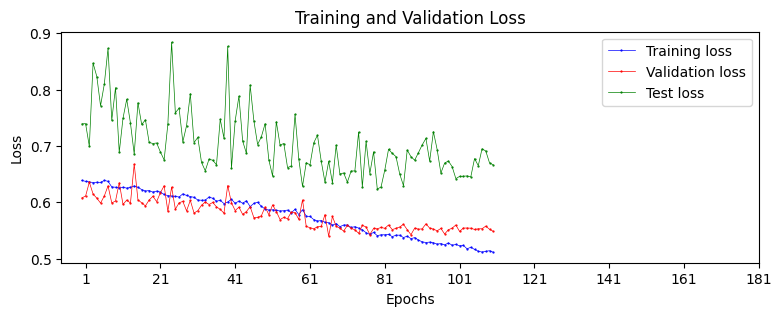

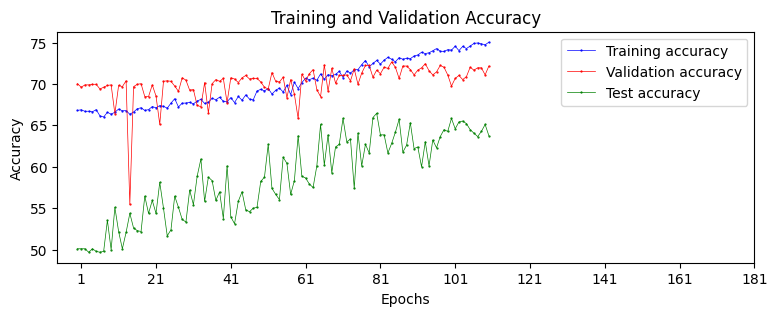


-------epoch:------------ 111  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6651, -0.9989],
        [ 0.0743, -0.0820],
        [ 0.6946, -1.3195],
        [ 0.2311, -0.6726],
        [-0.1136, -0.0301],
        [ 0.5781, -0.3276],
        [ 0.1856, -0.1288],
        [ 0.0436,  0.5017],
        [ 1.5657, -1.3090],
        [ 0.0888,  0.0455]], device='cuda:2', grad_fn=

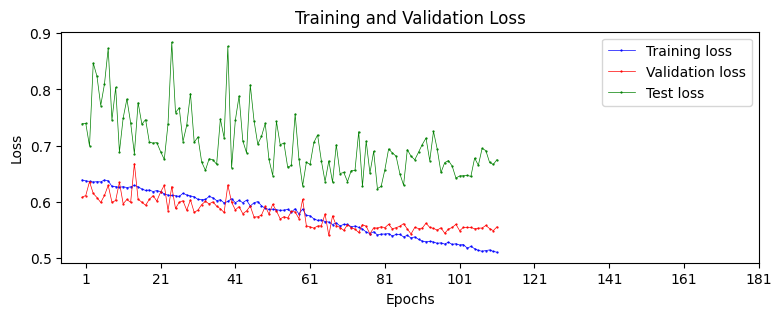

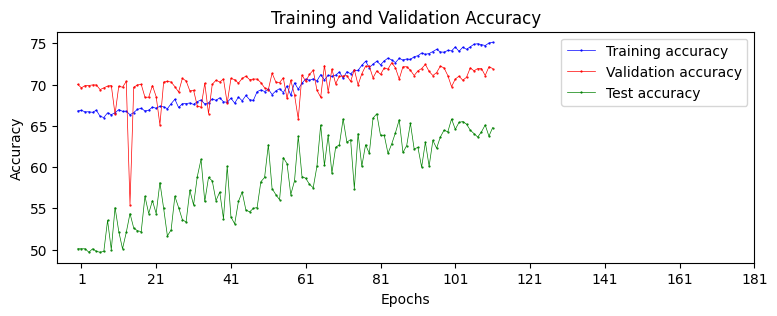


-------epoch:------------ 112  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5562, -0.6290],
        [-0.1095, -0.0473],
        [ 0.2055, -0.3084],
        [-0.0388,  0.7085],
        [ 1.1328, -1.4014],
        [ 1.5241, -2.1543],
        [ 0.1567, -0.4140],
        [-0.4872,  1.1643],
        [ 0.7274, -0.4129],
        [-0.0409,  0.4140]], device='cuda:2', grad_fn=

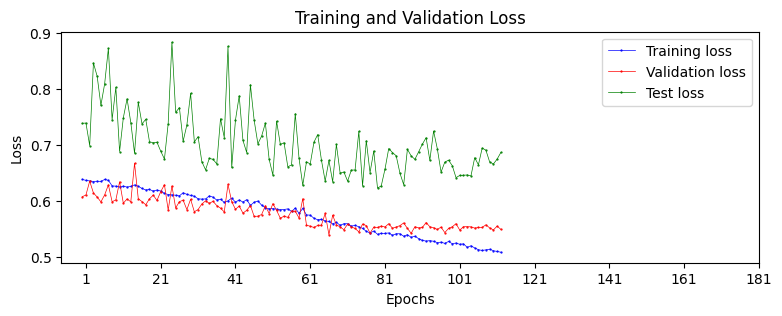

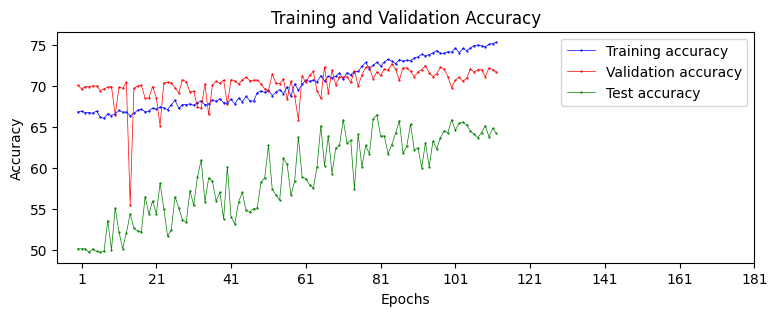


-------epoch:------------ 113  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.2914,  0.3218],
        [ 0.1842, -0.4555],
        [ 0.7430, -0.6625],
        [ 1.7920, -2.1613],
        [ 0.7463, -1.0199],
        [-0.1274,  0.1222],
        [ 0.7227, -0.3987],
        [ 0.7805, -1.0872],
        [ 1.0308, -0.6823],
        [ 1.3328, -1.9071]], device='cuda:2', grad_fn=

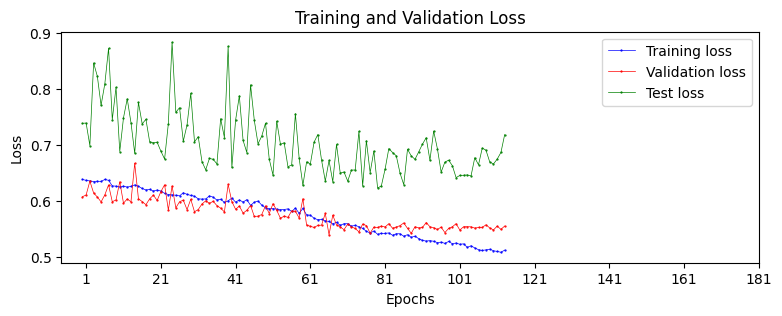

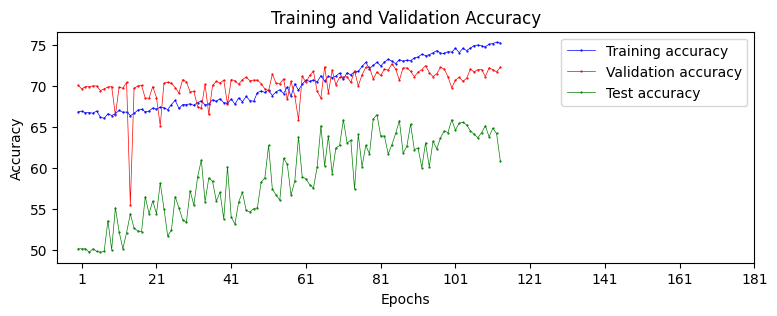


-------epoch:------------ 114  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.0986, -0.4091],
        [ 0.0934,  0.0206],
        [-0.0687,  0.1359],
        [ 0.1358, -1.0430],
        [-0.3447, -0.3584],
        [-0.1293,  0.1632],
        [ 0.4451, -0.6980],
        [-0.5742,  1.6911],
        [ 1.5569, -1.5532],
        [ 1.5859, -1.7592]], device='cuda:2', grad_fn=

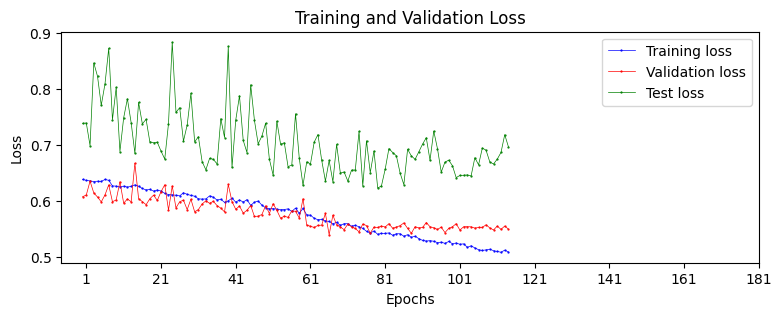

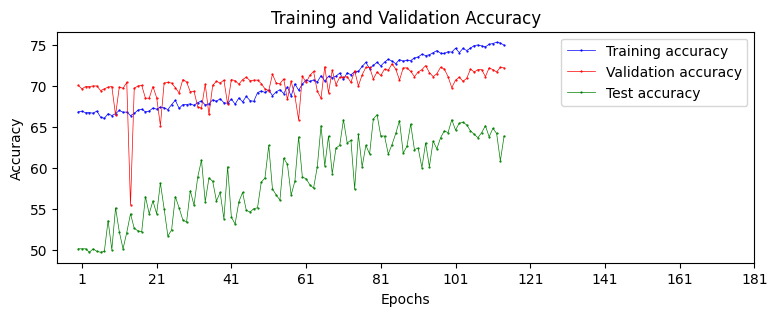


-------epoch:------------ 115  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 2.1198, -2.4808],
        [-0.0761, -0.1446],
        [ 2.0761, -1.7680],
        [ 0.3574, -0.7107],
        [ 0.0429, -0.1986],
        [ 0.4719, -1.1416],
        [ 0.8987, -0.7335],
        [ 0.0857,  0.1420],
        [ 0.3199,  0.2745],
        [ 0.7722, -0.6343]], device='cuda:2', grad_fn=

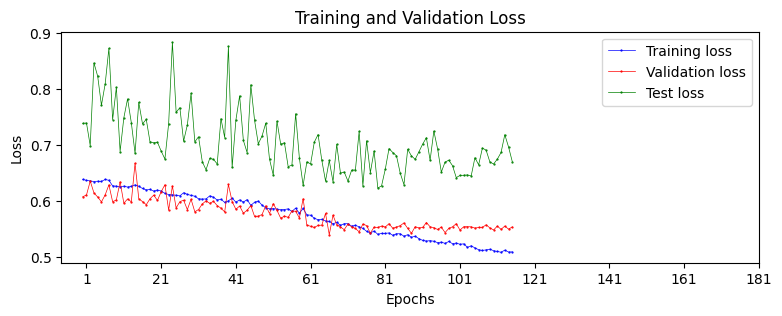

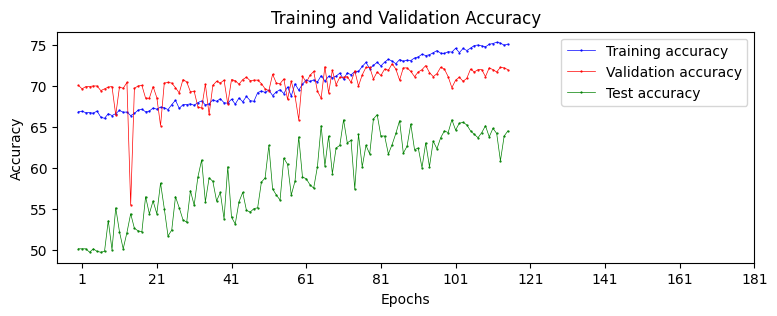


-------epoch:------------ 116  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.7642, -0.3946],
        [-0.1916,  0.1227],
        [ 0.4824, -0.4901],
        [ 0.9200, -1.2843],
        [ 0.2946, -0.2337],
        [ 0.1970, -0.6451],
        [ 0.1614, -0.3066],
        [ 0.1975, -0.0972],
        [ 1.6709, -1.5488],
        [ 0.6803, -0.6220]], device='cuda:2', grad_fn=

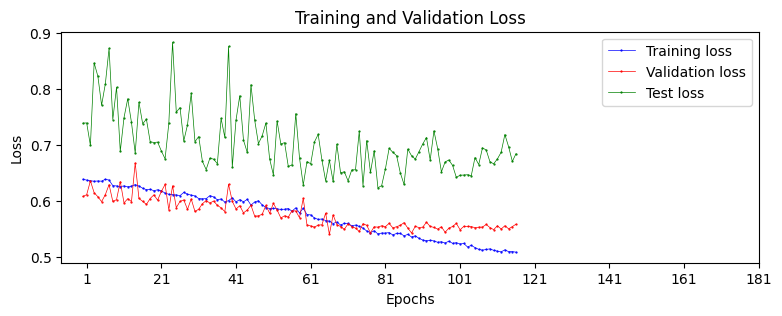

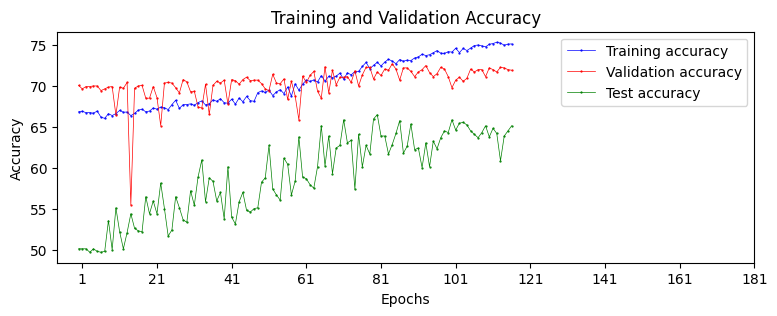


-------epoch:------------ 117  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.7743,  1.4433],
        [ 0.4390, -0.4566],
        [ 0.8908, -1.6058],
        [ 1.7298, -1.7241],
        [-0.0606,  0.2989],
        [-0.1897,  0.0912],
        [ 0.4224, -0.5935],
        [ 0.5842, -1.0123],
        [ 1.0810, -1.0837],
        [ 0.0532, -1.2713]], device='cuda:2', grad_fn=

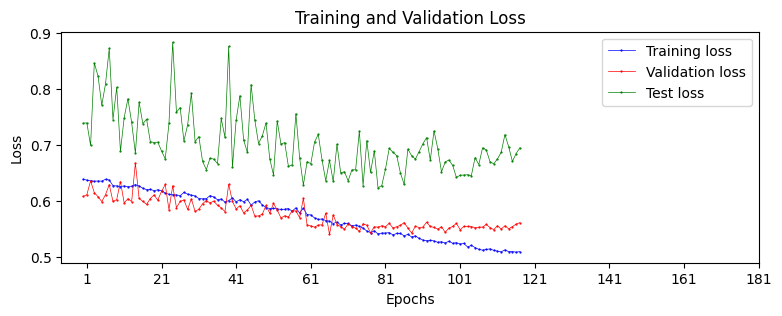

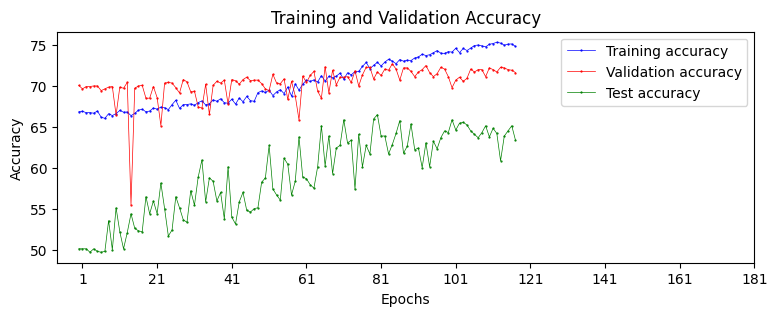


-------epoch:------------ 118  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6536, -0.8379],
        [ 1.4724, -1.5630],
        [ 0.2687, -0.5397],
        [ 0.2908, -0.6342],
        [ 0.2239,  0.0893],
        [ 0.1120, -0.2028],
        [ 0.2995, -1.1001],
        [ 0.5872, -0.7579],
        [ 1.7074, -2.5895],
        [ 0.3047, -0.0539]], device='cuda:2', grad_fn=

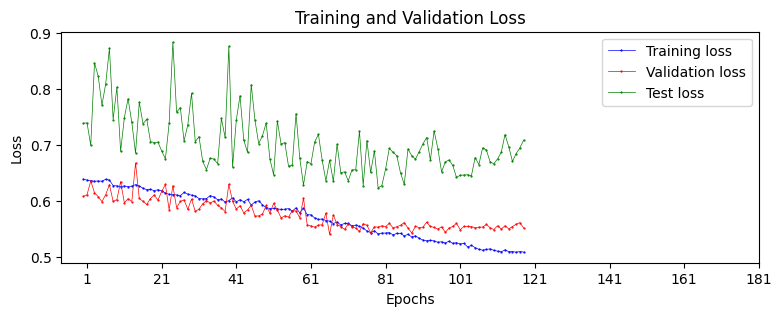

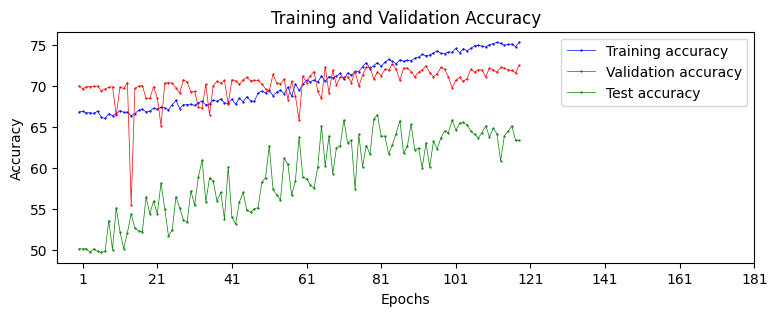


-------epoch:------------ 119  learning_rate 4.938271604938271e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6102, -0.8364],
        [ 0.5256, -1.0733],
        [-0.0781,  0.1753],
        [ 1.0348, -0.8772],
        [ 0.3708, -0.4113],
        [-0.0548, -0.1063],
        [ 0.2019, -0.7632],
        [ 0.8193, -0.5156],
        [-0.1274, -0.4605],
        [ 0.2903, -0.4687]], device='cuda:2', grad_fn=

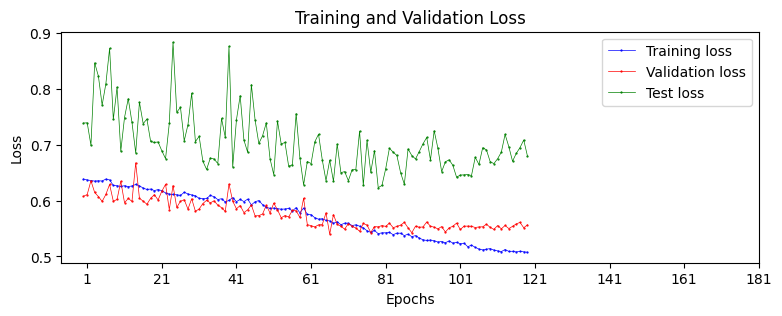

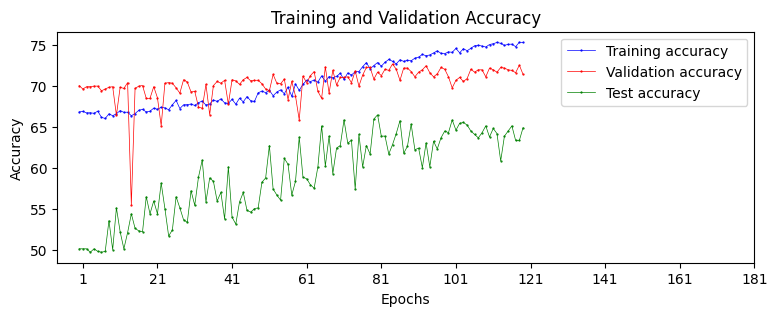

2__
120 2.4691358024691357e-05

-------epoch:------------ 120  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.3696, -1.4798],
        [ 1.2043, -2.2893],
        [-1.0180,  1.3932],
        [ 0.5885, -1.6269],
        [ 1.3290, -0.8293],
        [ 0.8210, -0.4962],
        [ 0.4934, -0.6504],
        [-1.0740,  0.6620],
        [-0.4399,  0.5905],
        [ 0.4938, -0.9

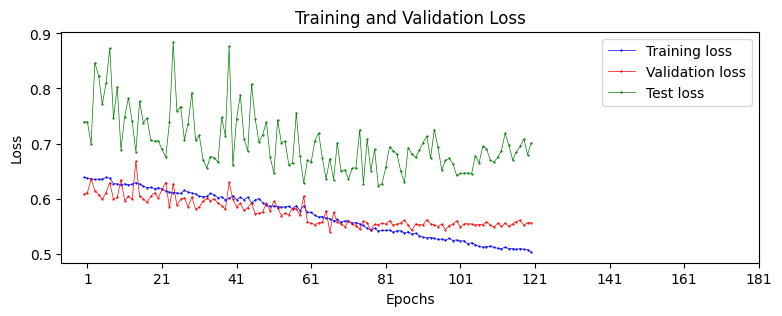

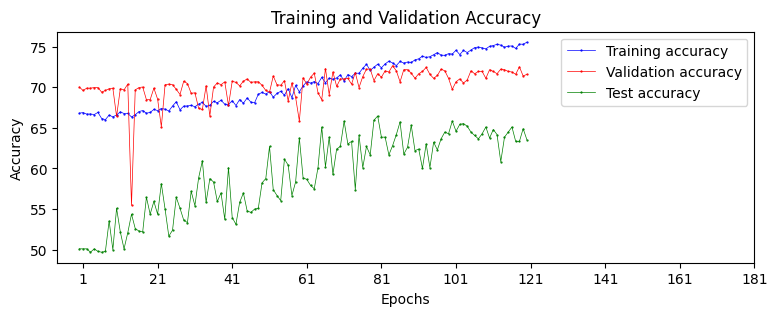


-------epoch:------------ 121  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0690, -0.5606],
        [-0.7775,  1.0411],
        [ 0.9832, -0.9919],
        [-0.5756,  0.4027],
        [ 0.8015, -0.7471],
        [ 0.0827, -0.5019],
        [ 1.4996, -1.4323],
        [-0.6028,  1.2005],
        [ 0.5009, -0.1005],
        [ 0.1721,  0.3464]], device='cuda:2', grad_fn

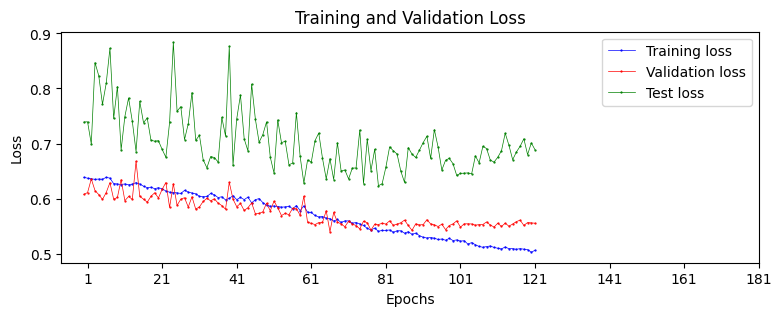

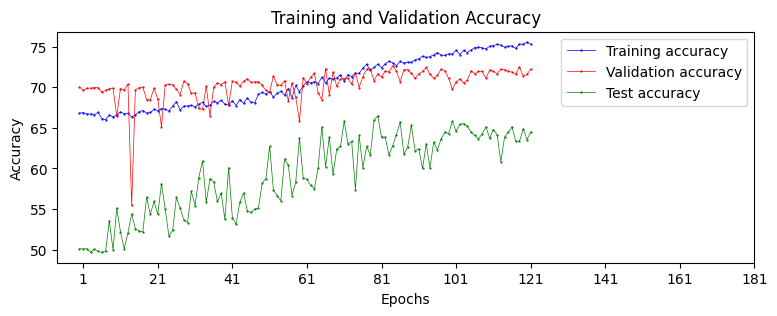


-------epoch:------------ 122  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4214, -0.5740],
        [ 0.0771,  0.3849],
        [ 0.5886, -0.3623],
        [ 2.0473, -1.9534],
        [ 0.4582, -0.0792],
        [-0.6106,  0.2304],
        [ 0.0542,  0.3435],
        [ 0.4813, -0.4515],
        [-0.9343,  1.4340],
        [ 1.0433, -1.0531]], device='cuda:2', grad_fn

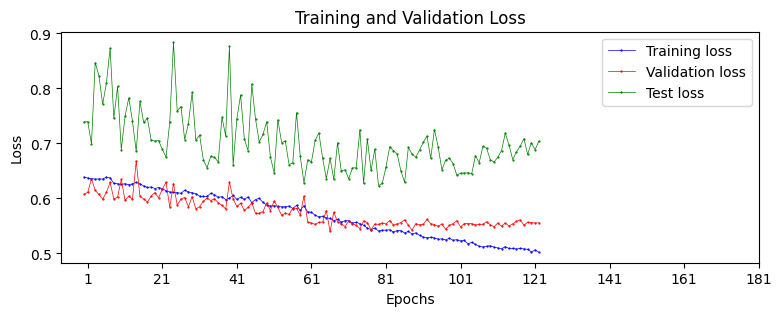

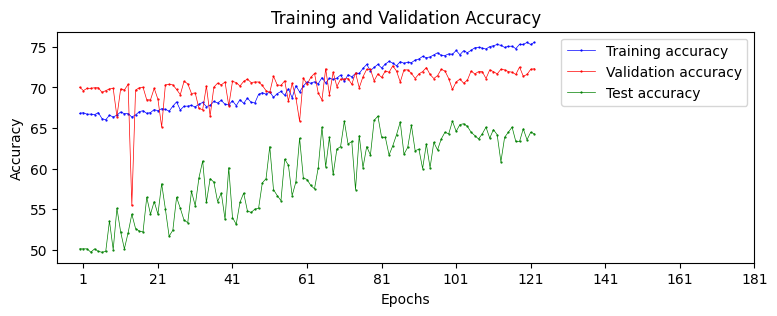


-------epoch:------------ 123  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.5025,  0.1212],
        [ 0.0751, -0.1974],
        [ 1.3421, -1.0050],
        [ 0.2405, -0.8575],
        [ 0.1997,  0.3808],
        [ 0.8373, -0.8788],
        [-0.5382,  1.3981],
        [ 0.8220, -0.4375],
        [ 0.9157, -0.8329],
        [ 0.0447, -0.6130]], device='cuda:2', grad_fn

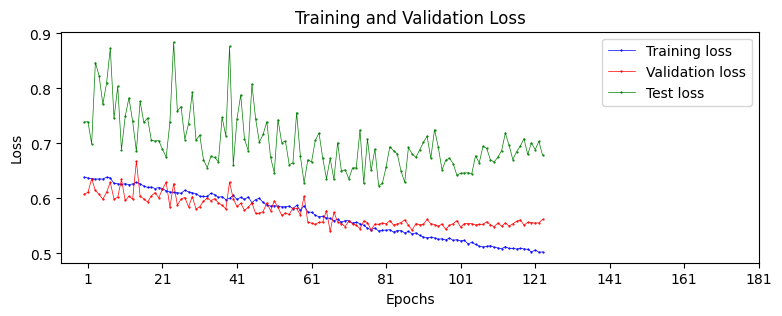

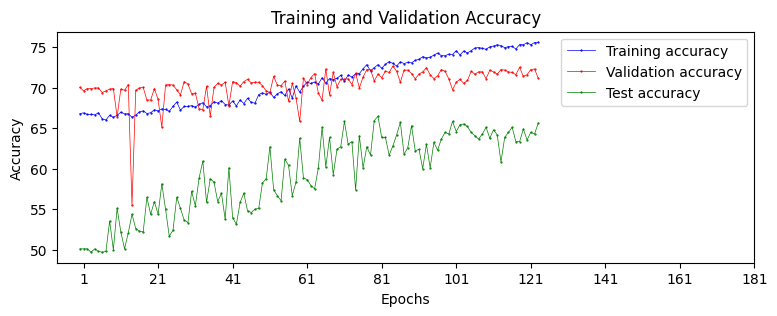


-------epoch:------------ 124  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5184, -0.0905],
        [-0.0075,  0.4452],
        [-0.1775,  0.0506],
        [ 1.7207, -1.3777],
        [ 1.8330, -2.4936],
        [ 0.5254, -0.6273],
        [ 0.0126,  0.1277],
        [ 0.0948,  0.1226],
        [ 1.5792, -1.0050],
        [ 0.6965, -0.7200]], device='cuda:2', grad_fn

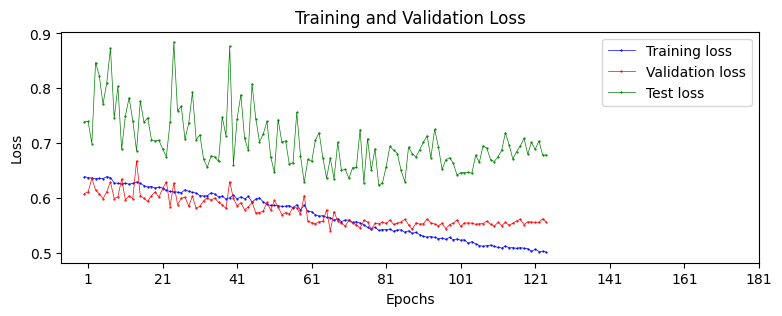

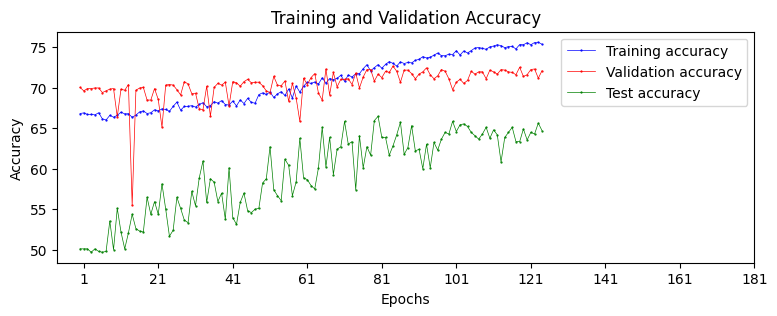


-------epoch:------------ 125  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6264, -0.8056],
        [ 0.3159, -0.8067],
        [ 1.7607, -1.3233],
        [ 0.8192, -0.5294],
        [-0.2561, -0.2031],
        [ 0.6579, -1.0403],
        [ 1.0443, -1.4434],
        [-0.4685,  0.1077],
        [ 0.6483, -0.1624],
        [-0.0666,  0.0731]], device='cuda:2', grad_fn

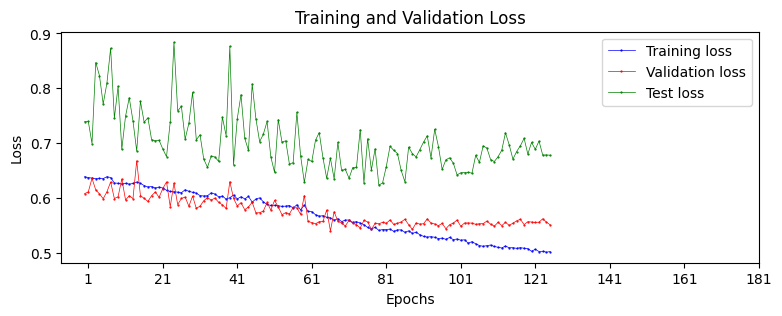

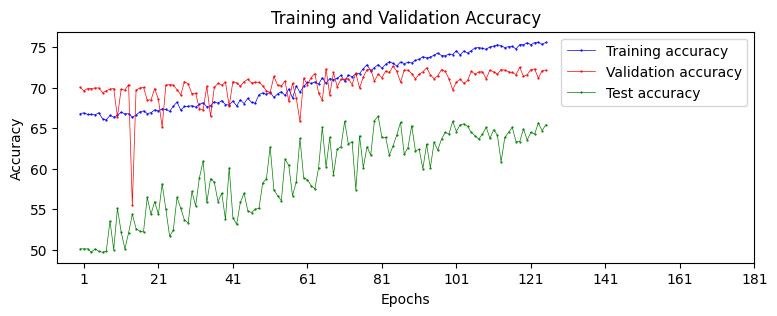


-------epoch:------------ 126  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6660, -0.9024],
        [ 0.4249, -1.0422],
        [ 0.1215,  0.1117],
        [ 1.6325, -1.9419],
        [ 0.4266,  0.1746],
        [ 0.0824, -0.2127],
        [-0.4132,  0.4489],
        [ 1.9390, -2.0773],
        [-0.1196,  0.1644],
        [ 0.5632, -0.6567]], device='cuda:2', grad_fn

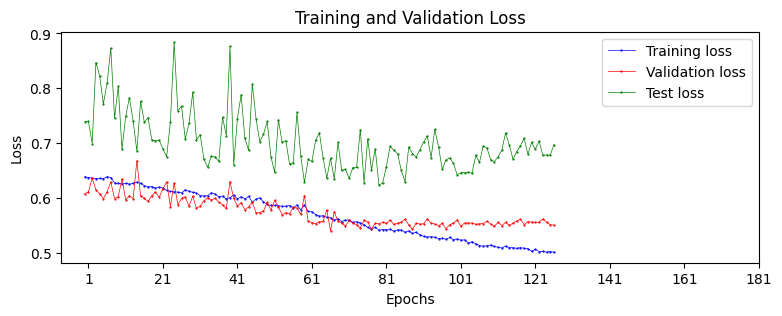

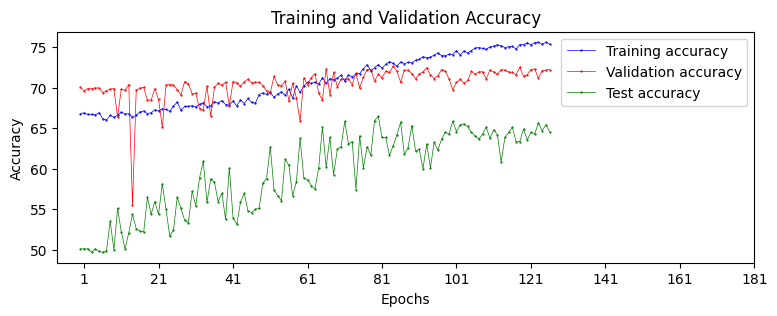


-------epoch:------------ 127  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9994, -0.5202],
        [ 1.4056, -2.3224],
        [-0.1343, -0.5382],
        [ 0.0871, -0.2575],
        [ 0.7334, -0.6417],
        [ 0.5131, -0.4365],
        [ 1.8134, -2.3059],
        [-0.5367,  1.0935],
        [ 0.1547, -0.4759],
        [ 0.7359, -0.9482]], device='cuda:2', grad_fn

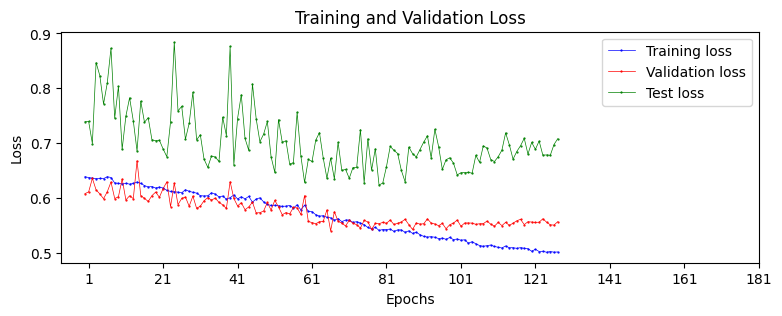

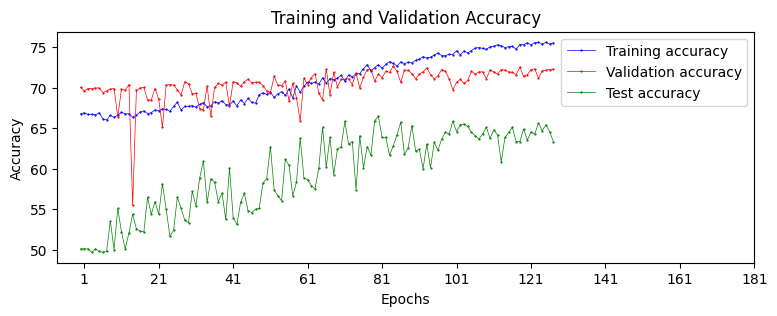


-------epoch:------------ 128  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1017,  0.6623],
        [ 0.6288, -0.7549],
        [ 0.0412,  0.6537],
        [ 0.4123,  0.0678],
        [ 0.3038, -0.3579],
        [ 0.0137,  0.1941],
        [ 1.7628, -2.1991],
        [ 0.4656, -0.8317],
        [ 1.6681, -1.4656],
        [ 0.2392, -0.1547]], device='cuda:2', grad_fn

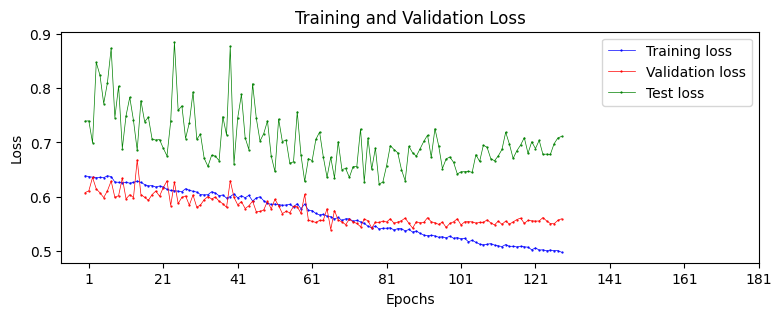

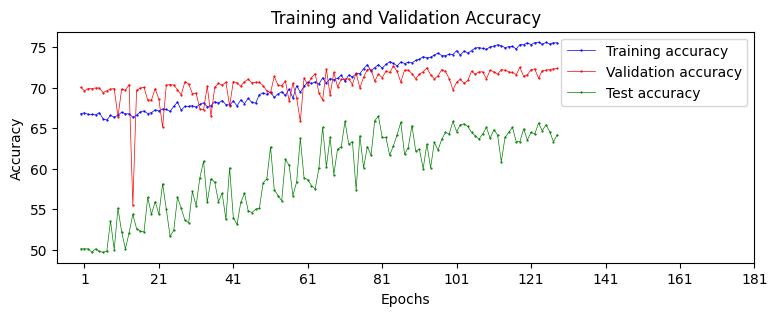


-------epoch:------------ 129  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1182, -0.2032],
        [ 0.0397, -0.3077],
        [-0.0930, -0.2242],
        [ 1.8069, -1.5787],
        [ 0.5143, -0.5178],
        [ 0.2032, -0.0285],
        [ 1.2244, -1.6839],
        [ 0.5341, -0.3050],
        [-0.1178,  0.2798],
        [-0.2942,  0.2605]], device='cuda:2', grad_fn

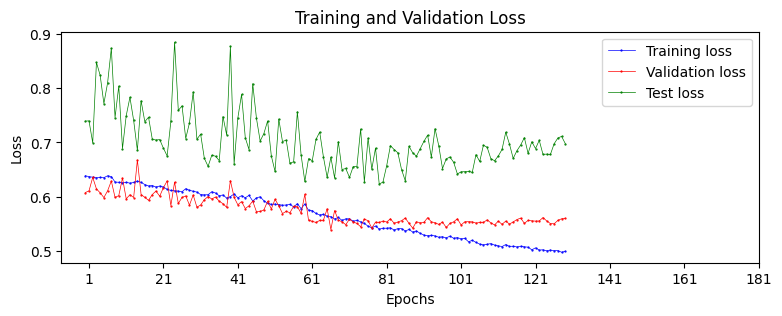

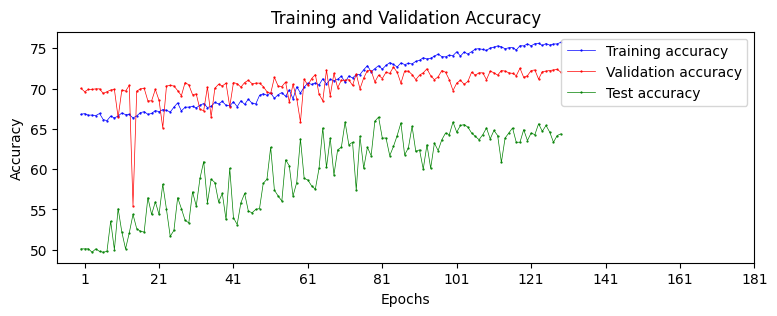


-------epoch:------------ 130  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.1131, -0.7947],
        [ 2.6262, -2.4839],
        [ 1.2959, -1.8702],
        [-0.5294,  0.6928],
        [ 0.3401,  0.2765],
        [-0.3828,  0.3577],
        [ 1.0168, -1.1270],
        [ 0.3671, -0.3919],
        [ 0.7906, -0.4020],
        [ 0.3323, -0.8649]], device='cuda:2', grad_fn

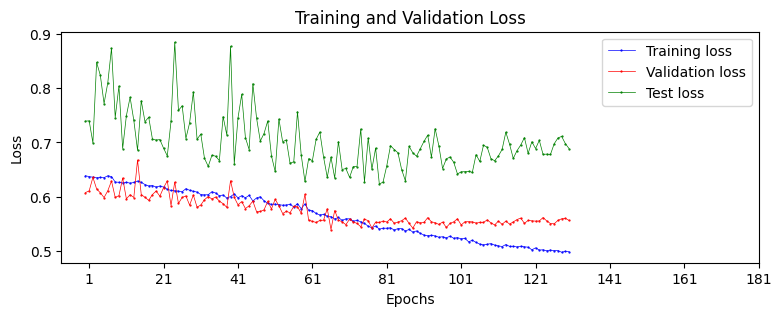

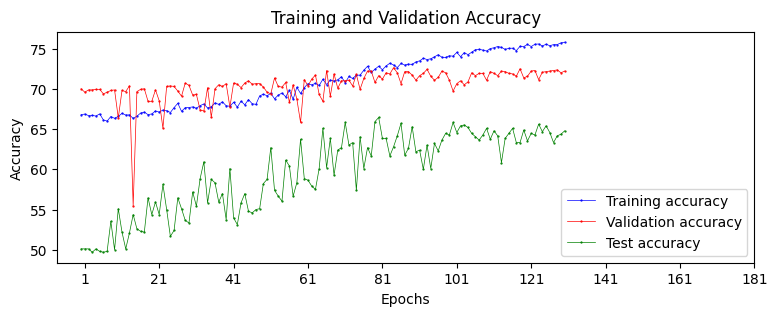


-------epoch:------------ 131  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.3535,  0.2550],
        [ 1.1214, -0.8889],
        [ 0.1601,  0.1753],
        [ 0.3410, -0.1523],
        [-0.1463,  0.9001],
        [ 0.0514,  0.7756],
        [-0.5350,  0.4479],
        [ 0.1545, -0.3628],
        [ 0.7216, -1.0075],
        [-0.6543,  0.5497]], device='cuda:2', grad_fn

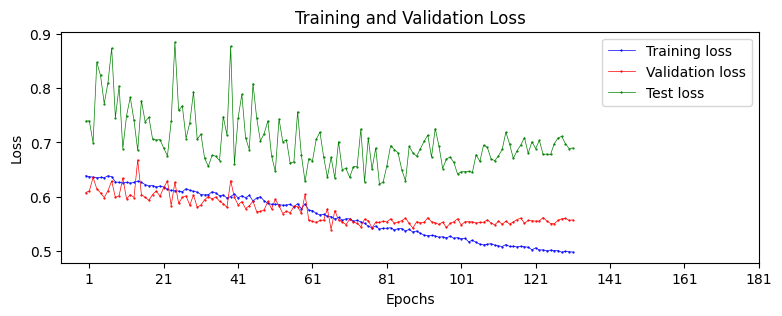

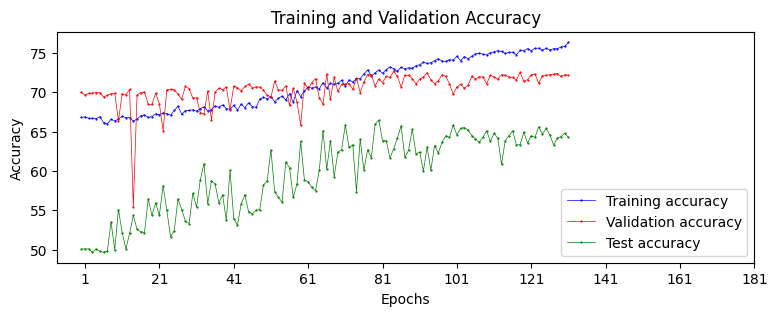


-------epoch:------------ 132  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.1374, -0.7275],
        [ 0.7485, -0.8010],
        [ 0.8753, -1.3214],
        [ 0.9914, -0.6275],
        [ 0.6247, -0.9675],
        [ 1.4503, -2.0006],
        [ 0.0939,  0.0605],
        [ 0.9205, -0.3585],
        [ 0.0307, -1.0492],
        [ 1.1316, -1.1125]], device='cuda:2', grad_fn

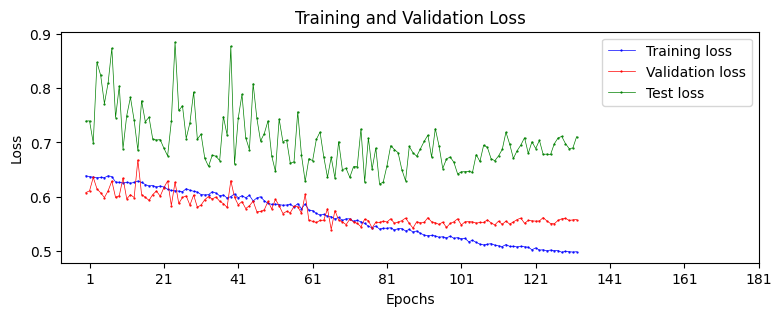

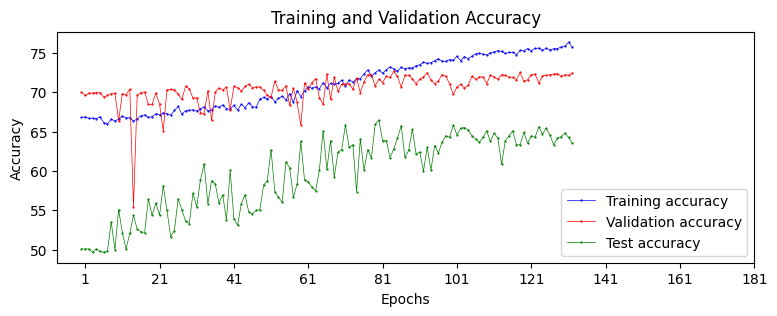


-------epoch:------------ 133  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.3083,  0.1818],
        [ 0.3506, -0.4295],
        [ 0.8221, -0.6090],
        [ 2.3287, -2.1946],
        [ 0.8346, -0.9359],
        [ 1.0845, -0.8894],
        [-0.6275,  0.5574],
        [ 2.0561, -2.1907],
        [-0.2067,  0.0709],
        [ 0.3671, -0.8587]], device='cuda:2', grad_fn

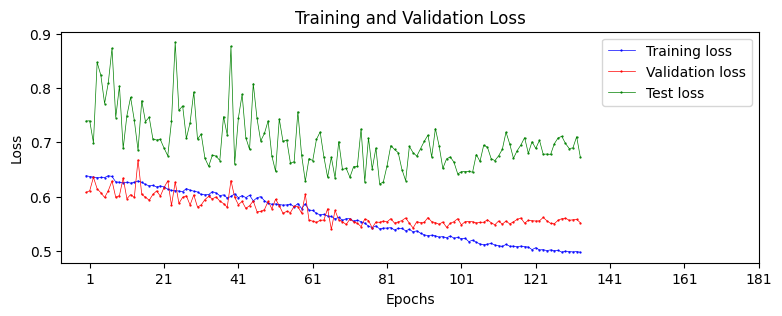

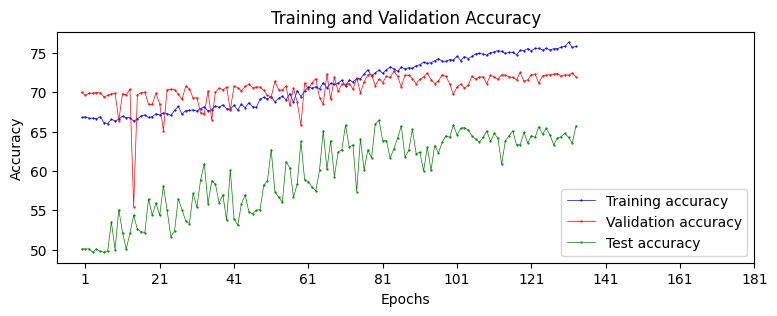


-------epoch:------------ 134  learning_rate 2.4691358024691357e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5738, -0.7794],
        [ 0.3736,  0.1772],
        [-0.1870,  0.3940],
        [ 0.3304, -0.9381],
        [ 1.2806, -1.2791],
        [ 0.7166, -0.2931],
        [ 0.6692, -0.4856],
        [-0.4997,  1.3040],
        [ 0.7330, -0.4707],
        [-0.5283,  1.3798]], device='cuda:2', grad_fn

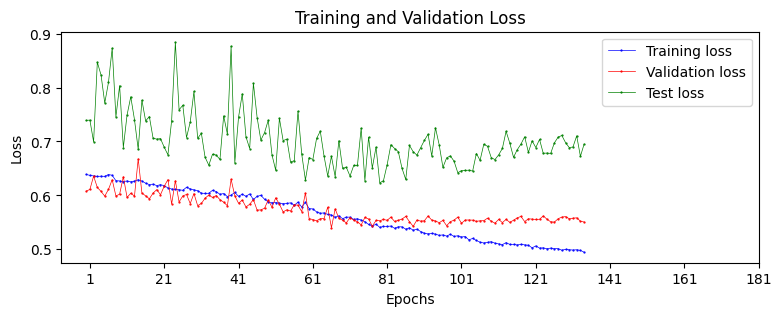

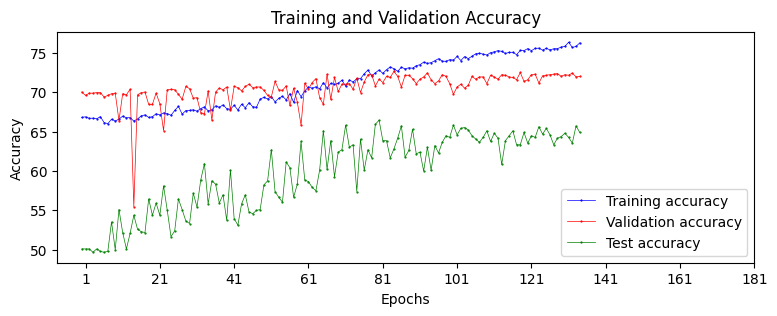

2__
135 1.2345679012345678e-05

-------epoch:------------ 135  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1267, -0.2628],
        [ 0.4563, -0.8159],
        [ 0.0421,  0.5182],
        [-0.5455,  1.3168],
        [ 1.9464, -2.3065],
        [ 1.0493, -1.6695],
        [ 0.5154, -1.1656],
        [ 1.2082, -1.7880],
        [ 0.3261, -0.2282],
        [ 0.8412, -0.6

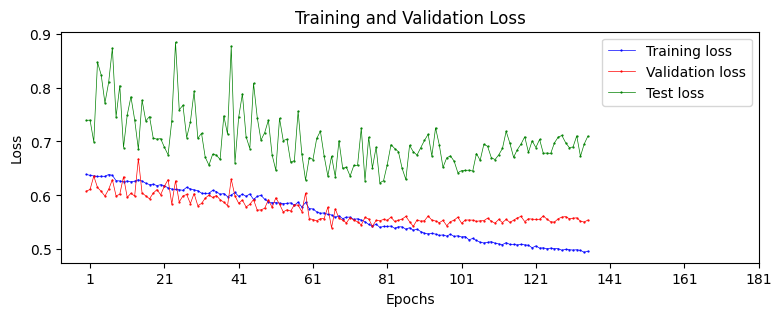

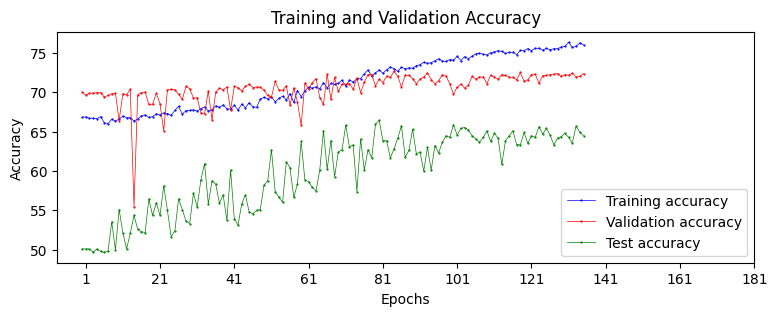


-------epoch:------------ 136  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1405, -0.1976],
        [ 1.4762, -2.0621],
        [ 1.4251, -1.5169],
        [ 1.7331, -1.7461],
        [-0.6003,  0.6163],
        [ 0.7936, -0.7916],
        [ 0.3931, -0.6046],
        [ 0.3709, -0.6949],
        [-0.1676,  0.6886],
        [ 1.0686, -0.7048]], device='cuda:2', grad_fn

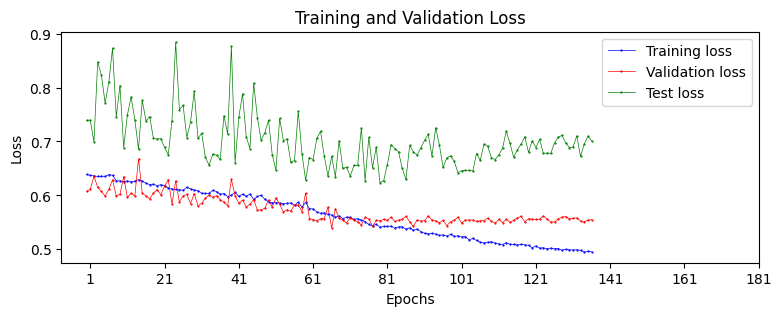

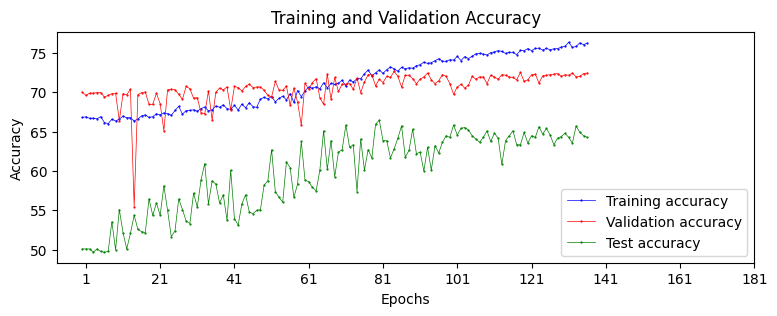


-------epoch:------------ 137  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4917, -0.7818],
        [ 0.5801, -0.6649],
        [ 2.1739, -1.6705],
        [ 0.0697, -0.6587],
        [ 0.5208, -0.8794],
        [ 0.4696, -0.3581],
        [ 1.0048, -1.3512],
        [ 0.8175, -0.6135],
        [ 1.1030, -2.3363],
        [ 0.2406, -0.4653]], device='cuda:2', grad_fn

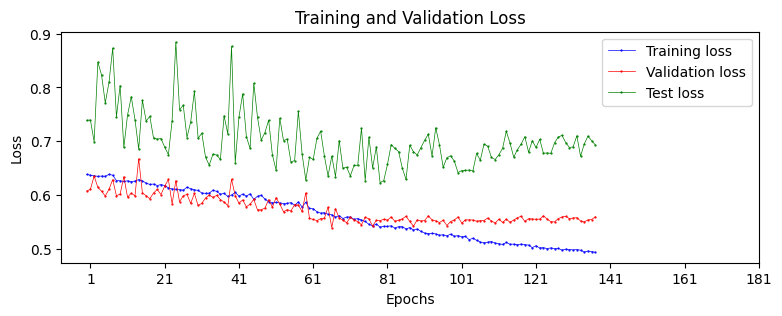

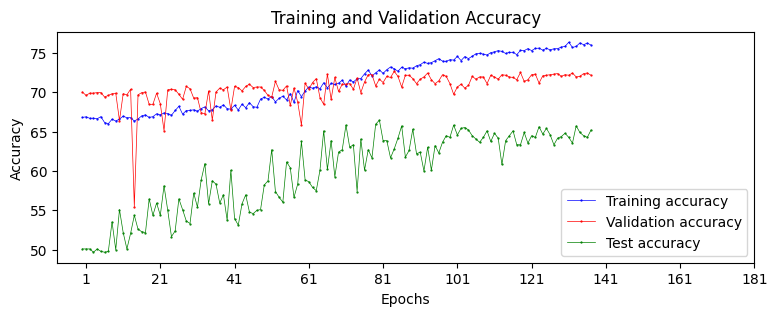


-------epoch:------------ 138  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.6210, -1.9402],
        [ 1.4353, -1.0176],
        [ 0.7447, -0.3850],
        [ 0.6075, -0.6344],
        [ 1.2540, -1.3003],
        [ 0.0066, -0.1451],
        [ 1.5728, -1.3586],
        [ 1.7915, -1.9702],
        [ 0.5664, -0.9260],
        [-0.0927, -0.6642]], device='cuda:2', grad_fn

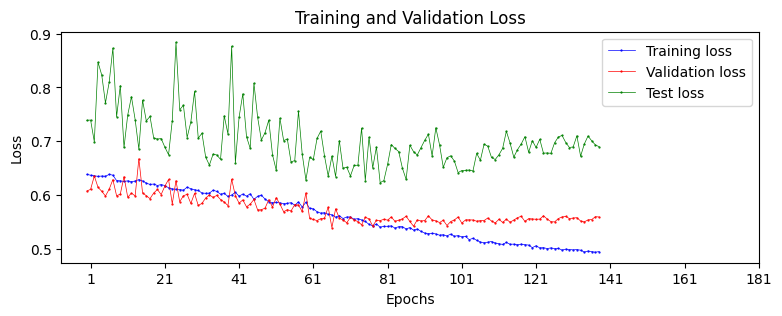

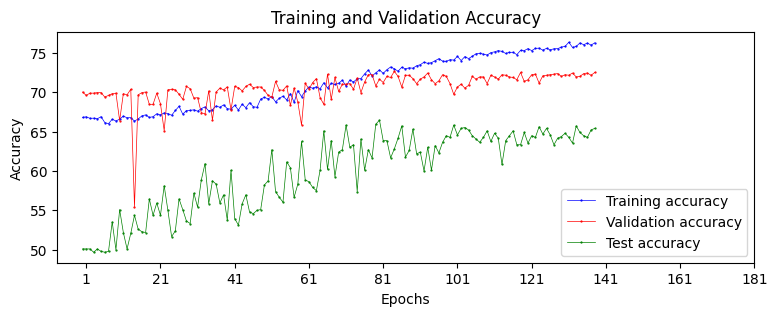


-------epoch:------------ 139  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2710, -0.9306],
        [ 1.1623, -0.6153],
        [ 0.8437, -0.8254],
        [ 1.7950, -1.9665],
        [ 1.3109, -1.6331],
        [ 0.2604, -0.6316],
        [ 1.5118, -1.7745],
        [ 0.9326, -1.6934],
        [ 1.1097, -1.0930],
        [-0.5273,  0.2537]], device='cuda:2', grad_fn

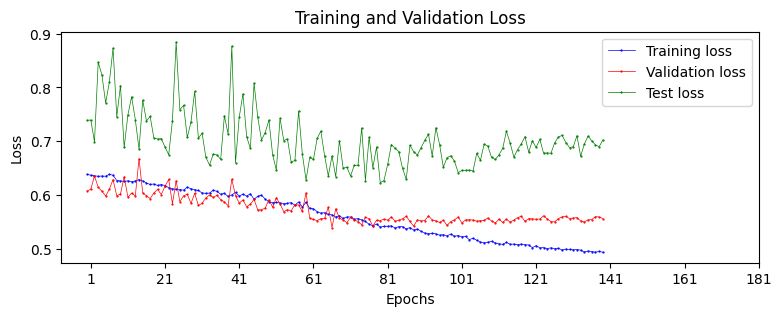

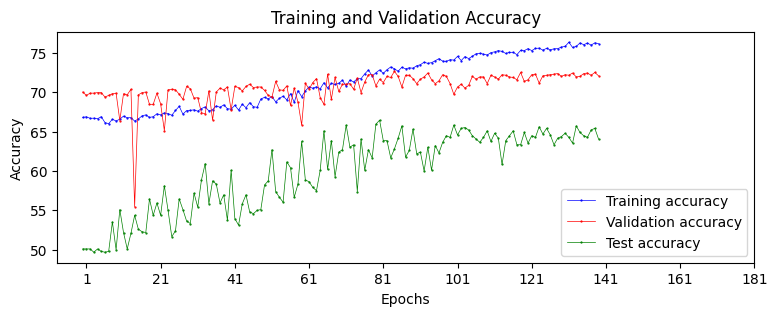


-------epoch:------------ 140  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1682, -0.1941],
        [-0.8265,  0.4853],
        [-0.7099,  0.8518],
        [-0.4900,  0.6973],
        [ 0.4039, -0.6408],
        [-0.5109,  0.3984],
        [ 1.1177, -1.2426],
        [ 1.4627, -0.8414],
        [ 0.9118, -1.2399],
        [-0.1581,  0.4224]], device='cuda:2', grad_fn

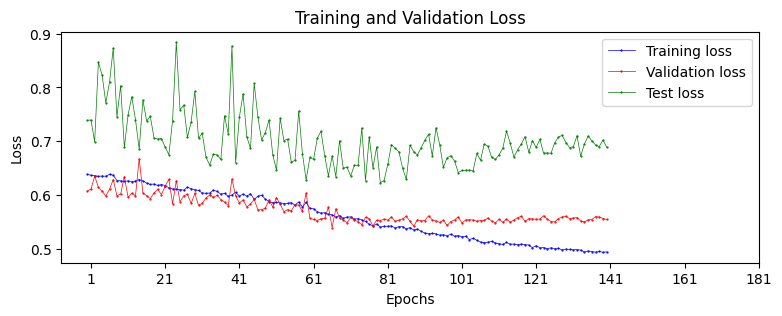

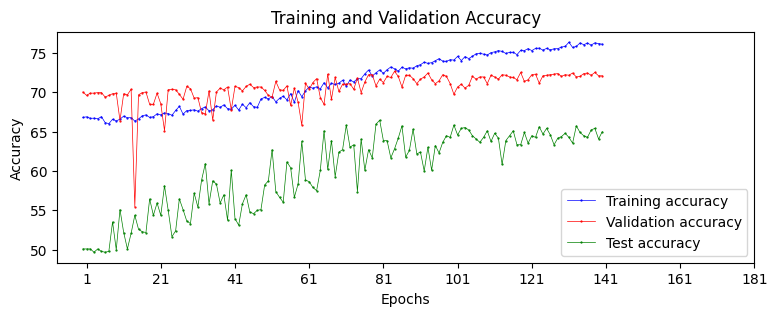


-------epoch:------------ 141  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.8327, -2.0566],
        [ 0.9435, -0.1886],
        [ 0.1364, -0.1773],
        [ 0.8445, -1.4170],
        [ 0.5706, -0.2272],
        [ 1.7939, -2.2733],
        [-0.9302,  1.4152],
        [-0.5478,  1.2592],
        [ 0.4570, -1.4053],
        [-0.9337,  1.3229]], device='cuda:2', grad_fn

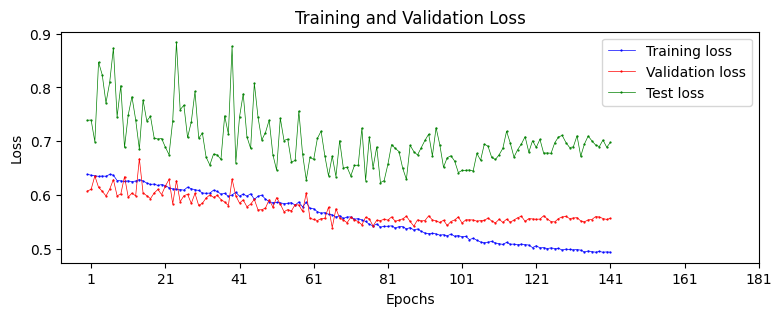

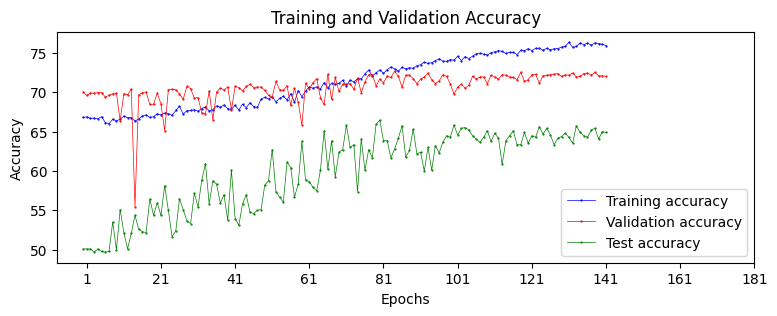


-------epoch:------------ 142  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2278, -0.6430],
        [ 0.0066, -0.6075],
        [ 0.4247, -1.2103],
        [ 1.4366, -1.5917],
        [ 0.1882,  0.1340],
        [ 0.0125, -0.5157],
        [-0.0122, -0.4379],
        [ 1.2274, -1.6820],
        [ 1.0714, -1.9843],
        [ 1.0157, -1.1420]], device='cuda:2', grad_fn

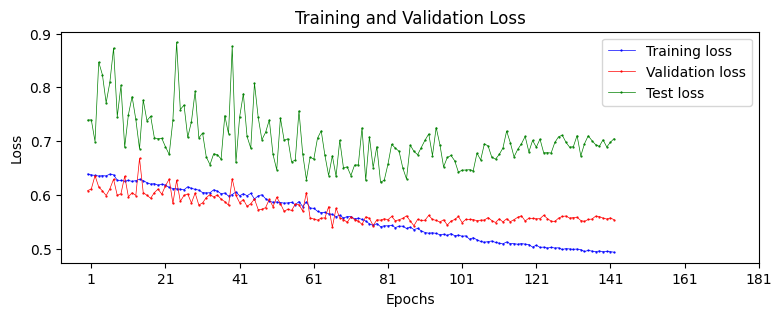

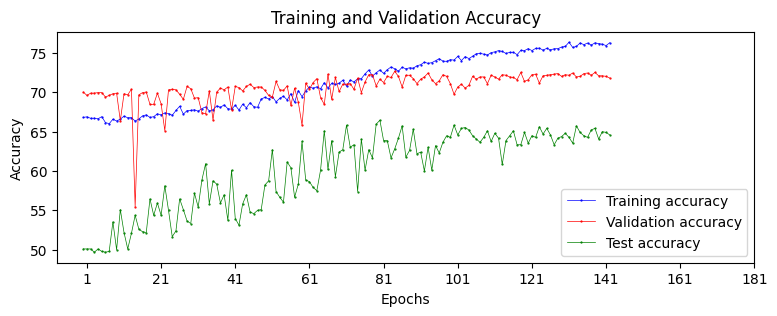


-------epoch:------------ 143  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1268, -0.3077],
        [ 1.9568, -1.8372],
        [ 0.4440,  0.2253],
        [ 0.8011, -0.5629],
        [ 0.8501, -1.1441],
        [ 0.7545, -0.3691],
        [ 0.0709,  0.2596],
        [ 1.1419, -1.8008],
        [ 0.9864, -1.3340],
        [-0.3962,  0.2648]], device='cuda:2', grad_fn

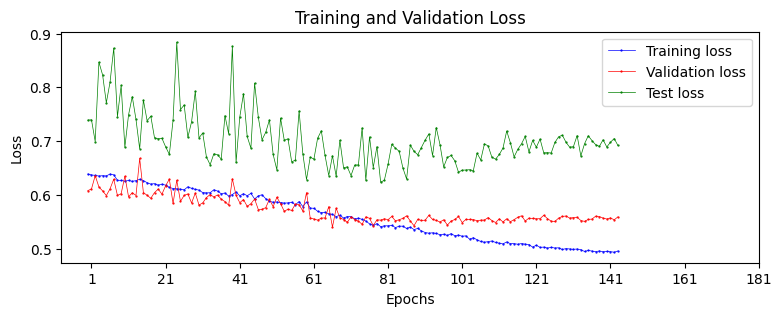

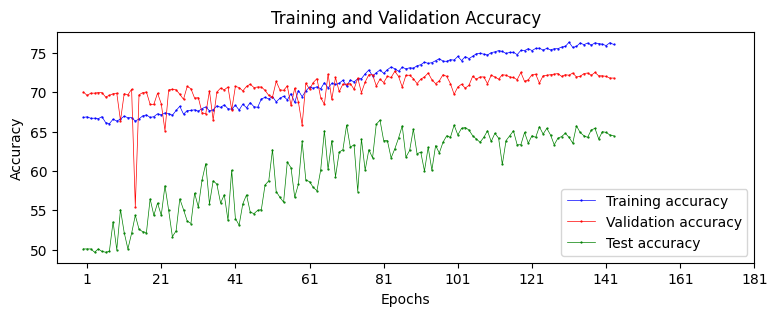


-------epoch:------------ 144  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1240,  0.9672],
        [ 0.5565, -0.9015],
        [ 1.1797, -1.5050],
        [ 0.8842, -0.2543],
        [ 0.3572, -1.2052],
        [ 1.2144, -1.2013],
        [ 0.0839, -0.1922],
        [ 1.9343, -2.4686],
        [ 0.1030,  0.6086],
        [-0.3076,  0.4175]], device='cuda:2', grad_fn

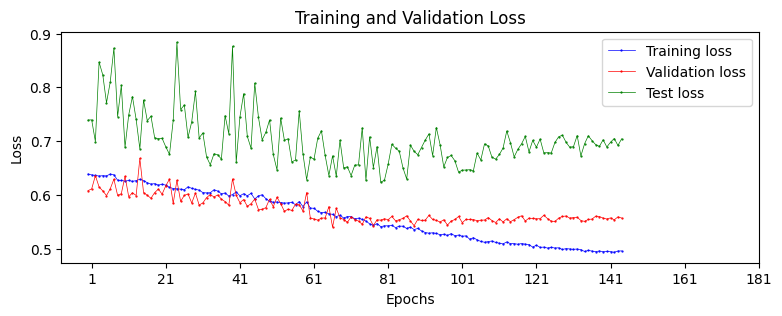

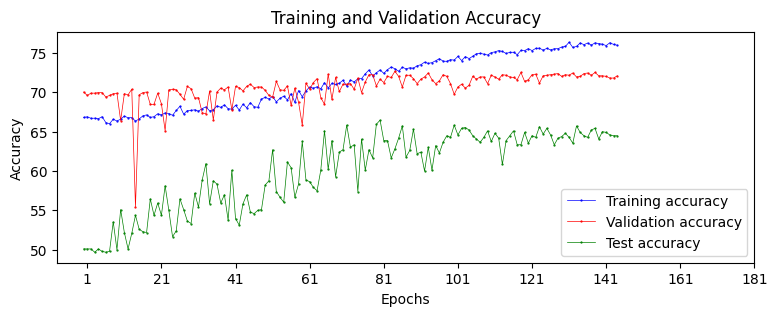


-------epoch:------------ 145  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1659, -0.1944],
        [ 2.2394, -1.7855],
        [ 0.1808, -0.5910],
        [-0.5133,  0.3744],
        [ 0.7769, -0.8558],
        [ 0.8886, -0.7684],
        [ 1.8325, -1.7221],
        [ 0.4732, -1.4652],
        [ 0.3875, -0.7397],
        [ 1.4334, -1.6484]], device='cuda:2', grad_fn

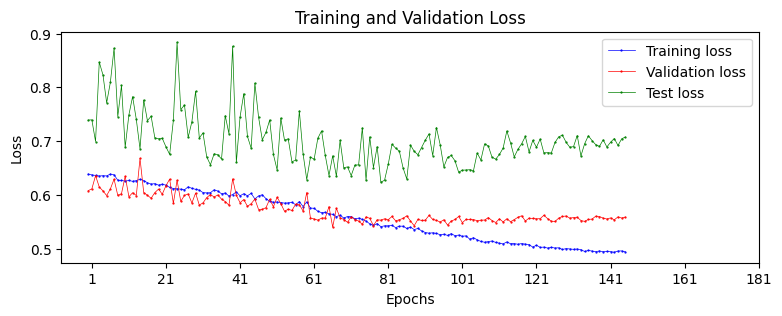

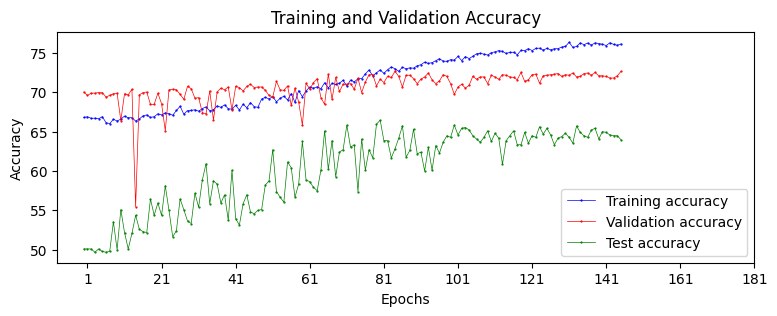


-------epoch:------------ 146  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0784,  0.3010],
        [-0.3575,  0.8746],
        [ 0.1959,  0.1232],
        [ 0.6165, -0.8250],
        [-0.3325,  1.2360],
        [ 0.2369, -0.5032],
        [-0.0419,  0.6725],
        [ 1.1598, -0.4720],
        [ 0.9254, -0.8474],
        [ 0.5158, -0.7944]], device='cuda:2', grad_fn

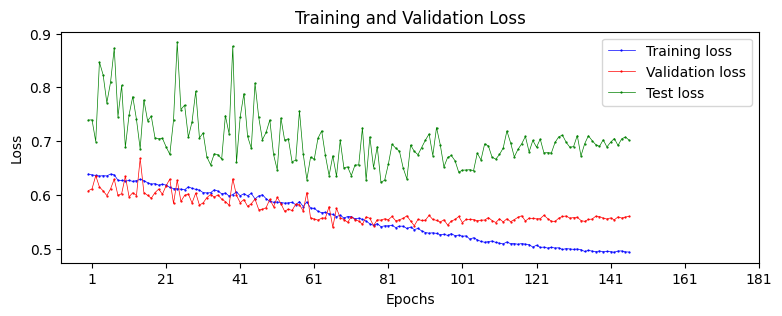

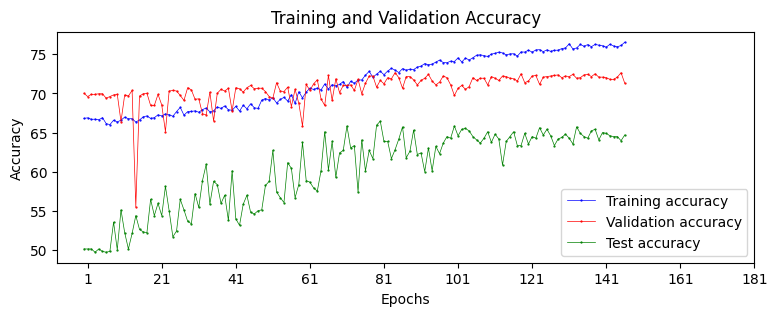


-------epoch:------------ 147  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4447, -0.0286],
        [ 1.1137, -0.4619],
        [-0.3401,  0.7302],
        [ 0.3230, -0.7001],
        [ 0.4553, -0.6693],
        [ 0.1979,  0.8587],
        [ 0.6422, -0.9715],
        [ 1.0710, -1.6031],
        [ 0.0161,  0.1723],
        [ 0.0453, -0.6653]], device='cuda:2', grad_fn

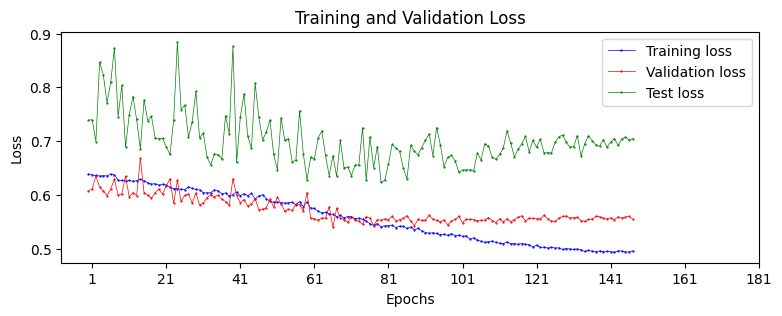

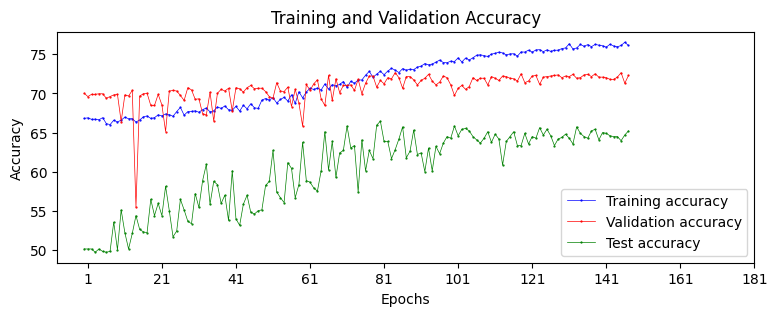


-------epoch:------------ 148  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4574, -0.3631],
        [ 1.1492, -1.6316],
        [-0.5453,  0.4850],
        [ 0.1835, -0.8440],
        [-0.1582,  0.1196],
        [ 2.2351, -2.8854],
        [-0.6570,  0.9568],
        [ 2.1425, -2.1459],
        [ 0.5909, -0.7173],
        [ 0.7818, -0.3320]], device='cuda:2', grad_fn

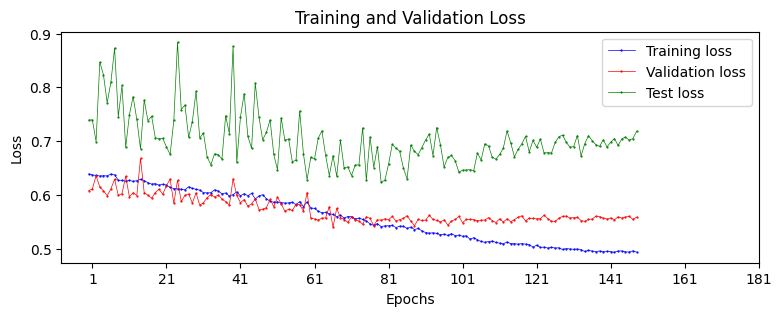

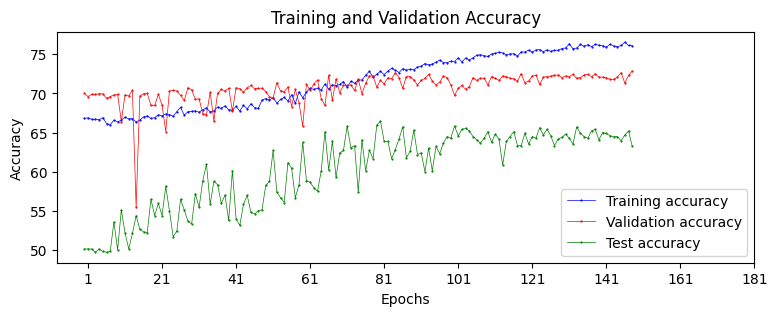


-------epoch:------------ 149  learning_rate 1.2345679012345678e-05
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3106, -0.3421],
        [ 0.1774, -0.3764],
        [-0.0815,  0.3426],
        [ 0.3021, -0.9130],
        [ 1.4911, -1.2311],
        [ 1.5590, -1.1603],
        [ 1.8505, -1.2218],
        [ 0.8866, -1.1014],
        [-0.6641,  0.3514],
        [ 0.7178, -0.7125]], device='cuda:2', grad_fn

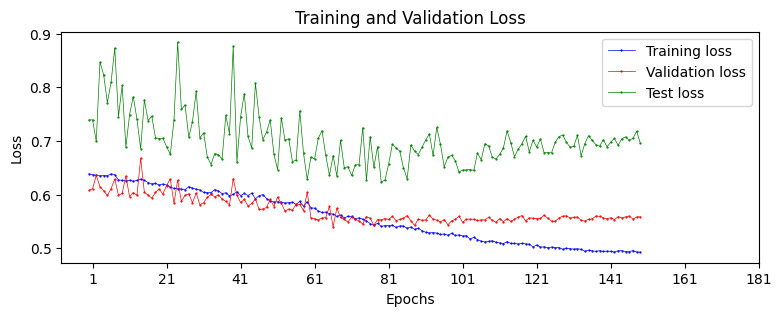

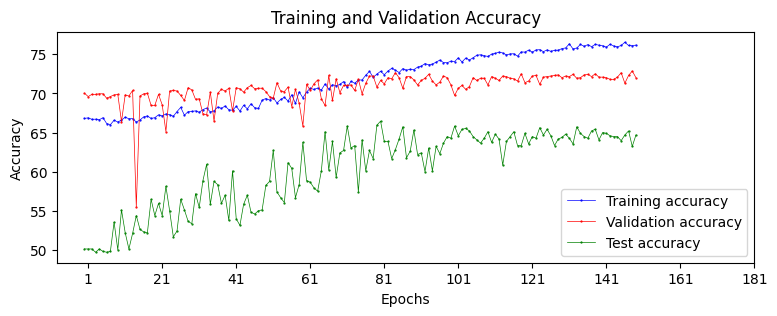

2__
150 6.172839506172839e-06

-------epoch:------------ 150  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.6566, -1.2963],
        [ 1.4242, -1.6613],
        [ 1.3781, -1.5180],
        [ 0.0662,  0.1186],
        [ 1.8957, -2.3646],
        [ 1.3492, -1.2005],
        [ 1.2220, -1.3708],
        [ 0.7196, -0.3091],
        [ 1.7457, -1.6154],
        [ 0.7687, -1.222

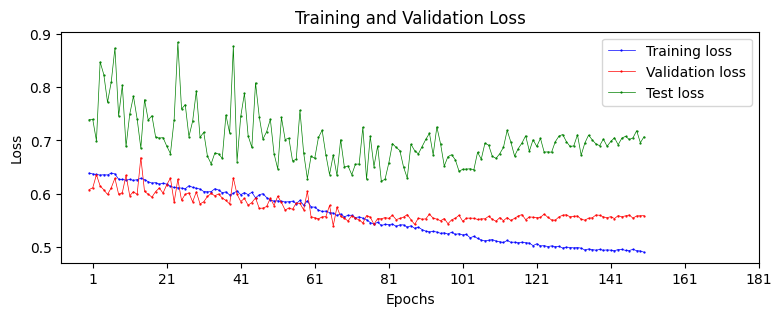

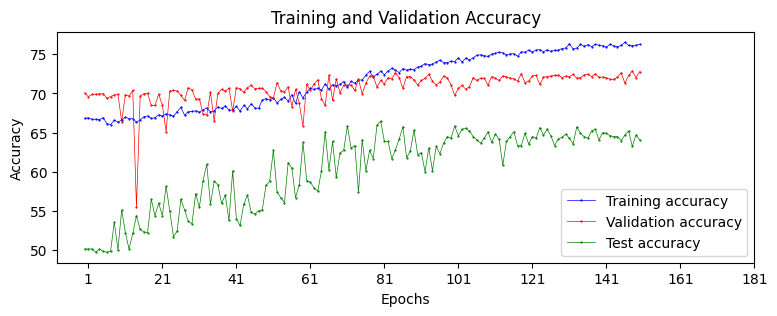


-------epoch:------------ 151  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.1946, -0.9782],
        [ 0.4890, -0.7696],
        [-0.0098,  0.1563],
        [-0.3508,  0.8225],
        [ 0.5373, -0.9115],
        [ 1.1244, -1.4201],
        [ 0.1290, -0.9741],
        [ 0.3172, -0.9676],
        [ 0.2112,  0.2215],
        [ 0.7017, -0.6727]], device='cuda:2', grad_fn=

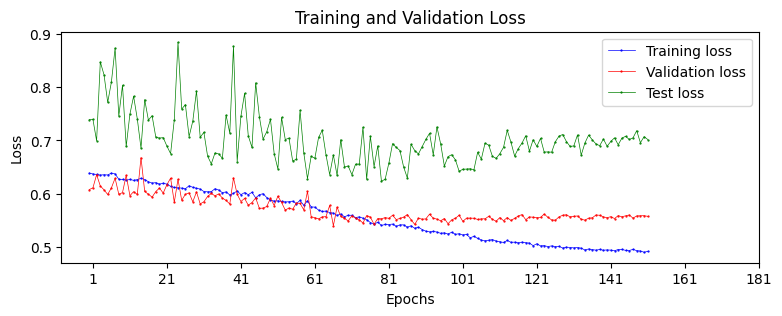

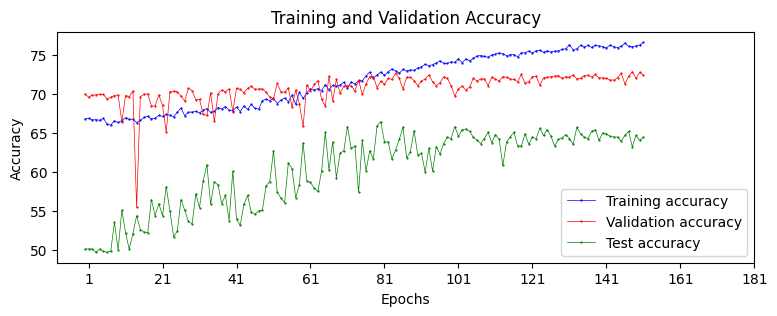


-------epoch:------------ 152  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.5090,  0.4717],
        [ 0.4685, -0.5091],
        [ 0.2774, -1.0386],
        [ 2.0001, -1.9724],
        [-0.2570, -0.0919],
        [-0.2199,  0.6053],
        [ 0.0915,  0.3559],
        [ 2.0183, -2.4426],
        [ 0.6970, -1.0423],
        [ 0.7670, -1.0116]], device='cuda:2', grad_fn=

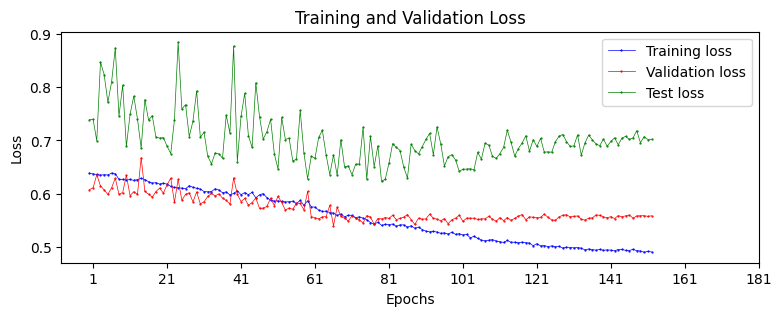

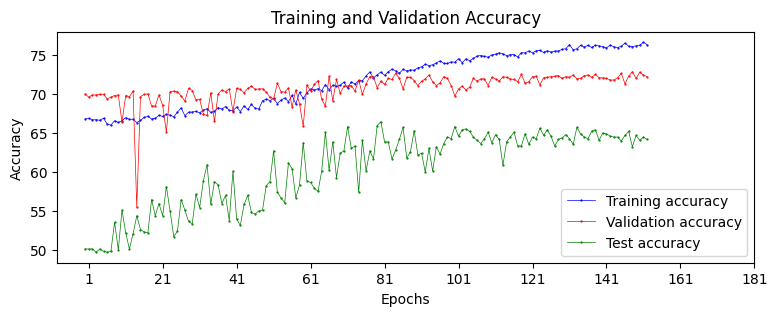


-------epoch:------------ 153  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9770, -0.6730],
        [ 0.2226, -0.4764],
        [ 0.3013,  0.0739],
        [ 0.4730, -0.4287],
        [-0.6208,  1.0968],
        [ 1.9785, -2.8737],
        [-0.1195, -0.5563],
        [ 0.1646,  0.1438],
        [-0.0808, -0.1816],
        [-0.0708, -0.1152]], device='cuda:2', grad_fn=

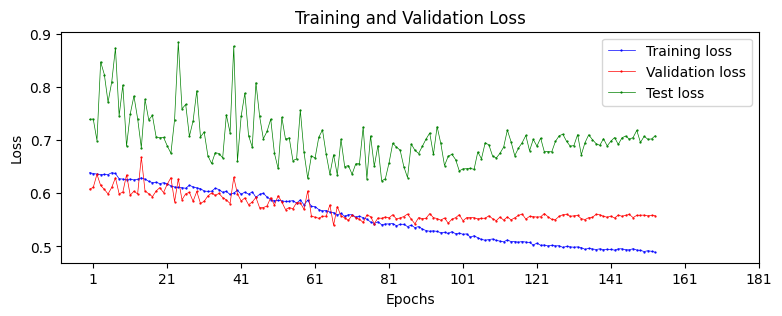

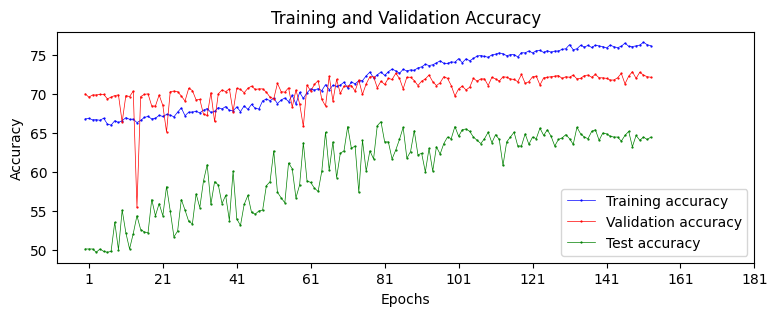


-------epoch:------------ 154  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1817,  0.5800],
        [ 1.4522, -0.9840],
        [ 1.6806, -1.8431],
        [ 0.0666, -0.1721],
        [-0.0137,  0.3899],
        [ 0.0291, -0.1714],
        [-0.3459,  0.4275],
        [-0.2728,  0.3719],
        [ 0.4971, -0.4782],
        [-0.0462,  0.1729]], device='cuda:2', grad_fn=

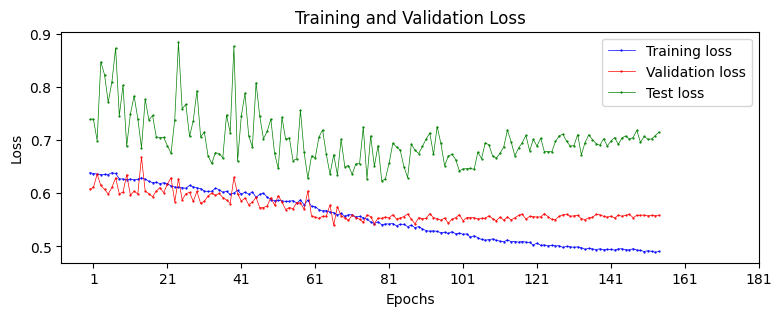

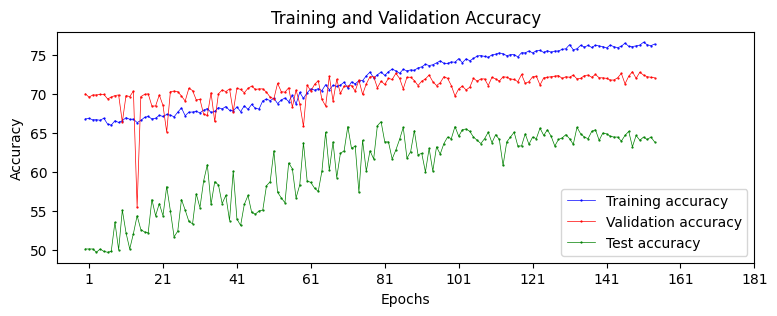


-------epoch:------------ 155  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4113, -1.0036],
        [-0.3900,  0.1005],
        [ 0.6418, -0.4809],
        [ 0.6023, -0.7666],
        [ 0.4850, -0.7915],
        [ 0.1405, -0.1945],
        [ 0.5535, -0.8016],
        [ 1.8613, -1.1606],
        [-0.6675,  0.4332],
        [ 0.8058, -0.8069]], device='cuda:2', grad_fn=

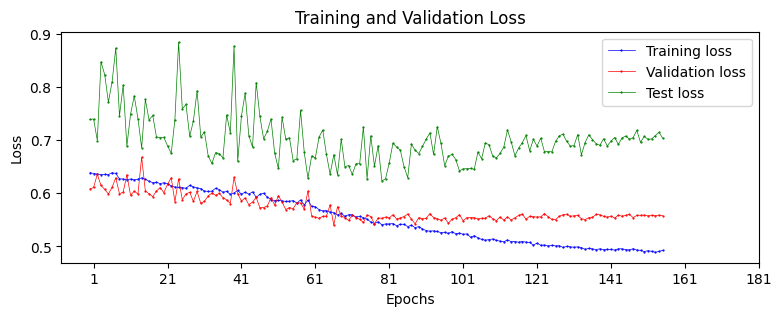

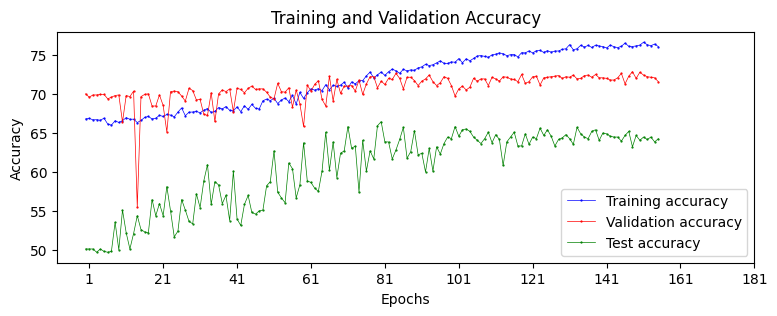


-------epoch:------------ 156  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.5390,  0.7871],
        [-0.4430,  0.5676],
        [ 1.3382, -1.1570],
        [-0.2901,  0.6528],
        [ 0.9115, -0.8134],
        [ 1.3090, -1.7725],
        [ 0.9661, -0.9659],
        [-0.6009, -0.1850],
        [-0.4630,  0.2412],
        [ 1.5837, -1.7209]], device='cuda:2', grad_fn=

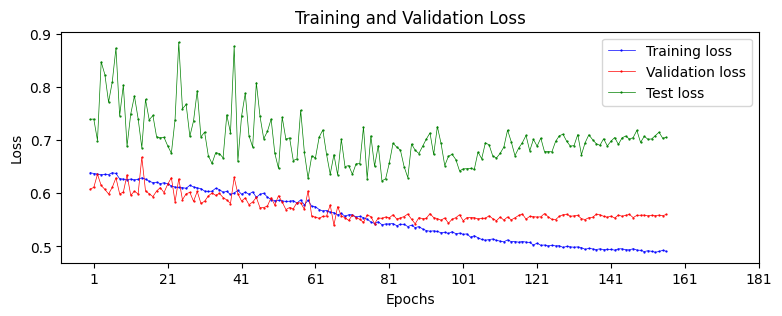

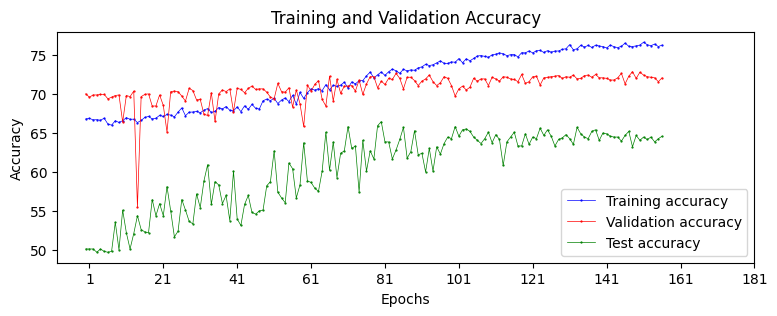


-------epoch:------------ 157  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3783, -0.4179],
        [ 1.5472, -1.2878],
        [ 1.2939, -1.1424],
        [-0.1522,  0.5252],
        [ 0.4507, -1.0992],
        [ 1.4551, -1.4607],
        [ 0.9360, -0.9622],
        [-0.5681,  0.5803],
        [ 0.5196, -0.9027],
        [ 0.1439, -0.0358]], device='cuda:2', grad_fn=

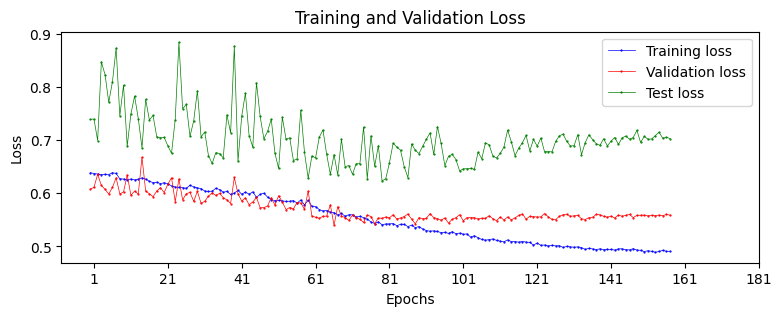

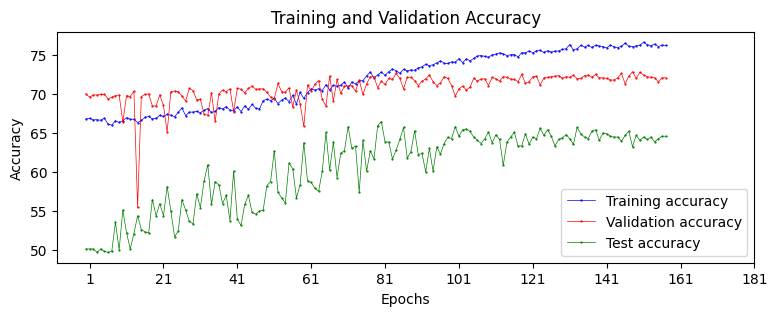


-------epoch:------------ 158  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5604, -1.1245],
        [ 1.1820, -1.6648],
        [ 1.3116, -1.3846],
        [ 0.3238, -0.3615],
        [ 0.8707, -1.0968],
        [ 0.3329, -0.9349],
        [-0.1457,  0.2157],
        [-0.5592,  0.4996],
        [ 0.4478, -0.7690],
        [ 1.2744, -0.8780]], device='cuda:2', grad_fn=

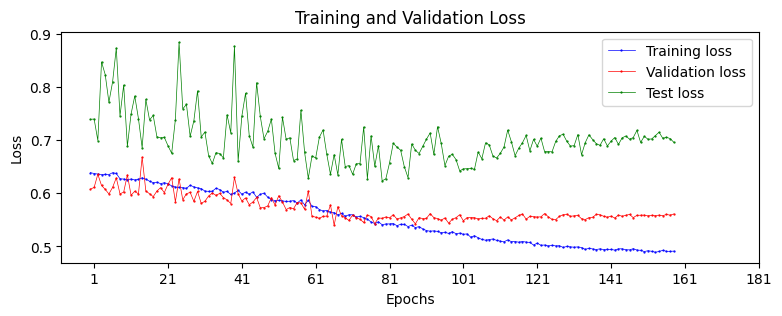

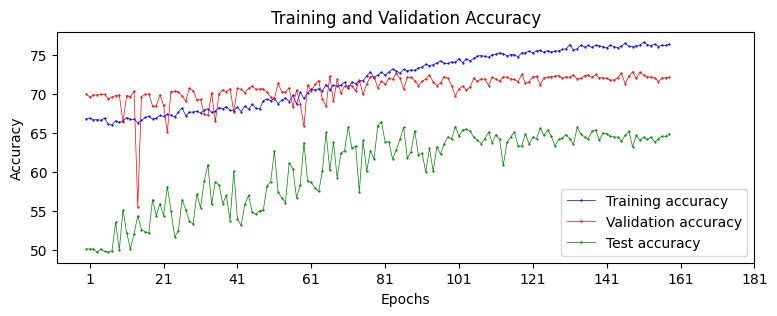


-------epoch:------------ 159  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.6021, -1.9822],
        [ 1.2415, -1.4972],
        [ 0.5758, -0.7785],
        [ 1.1391, -1.0200],
        [ 0.9888, -1.0498],
        [ 0.9448, -0.0996],
        [-0.0415,  0.1259],
        [ 0.4664, -0.9447],
        [ 0.3414, -1.1599],
        [ 1.9725, -1.9416]], device='cuda:2', grad_fn=

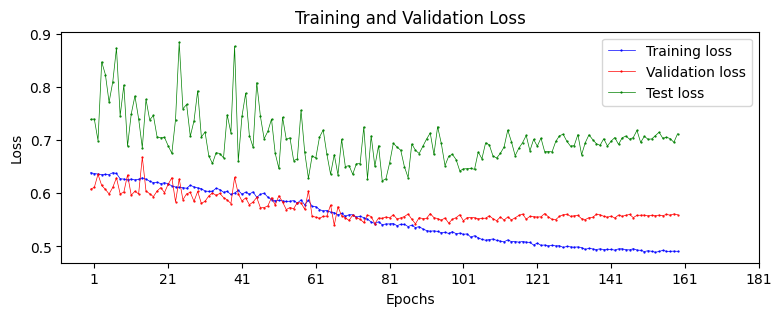

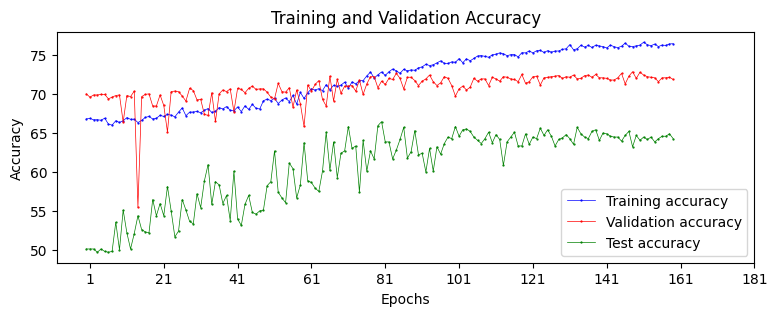


-------epoch:------------ 160  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.4341, -1.8333],
        [ 1.9856, -1.8864],
        [ 1.3794, -1.0563],
        [ 0.0265,  0.0465],
        [-0.3165,  0.1602],
        [-0.0356, -0.2259],
        [ 0.8947, -1.3931],
        [-0.0584, -0.5344],
        [-0.0544,  0.3100],
        [ 0.4693, -0.5755]], device='cuda:2', grad_fn=

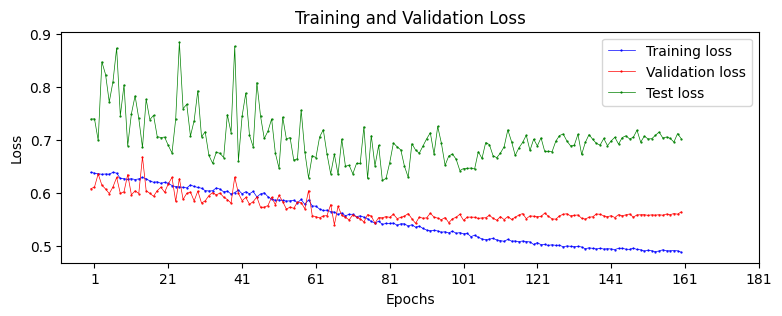

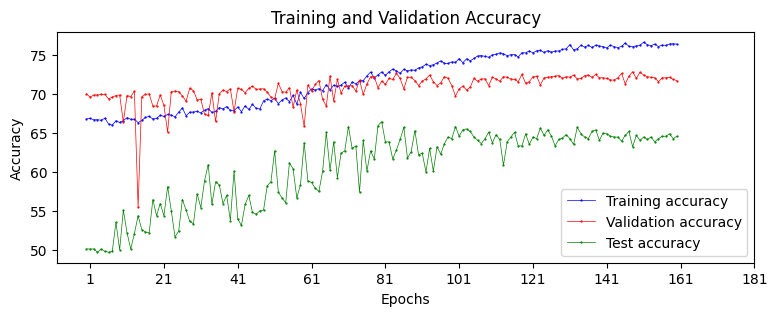


-------epoch:------------ 161  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6548, -1.2686],
        [ 1.2446, -1.3017],
        [ 0.5366, -1.1146],
        [-0.4214,  0.0452],
        [ 0.2141, -1.1770],
        [ 1.8448, -1.9322],
        [ 1.8948, -1.8028],
        [-0.2470,  0.4113],
        [ 1.9021, -2.1064],
        [ 0.2311, -0.3956]], device='cuda:2', grad_fn=

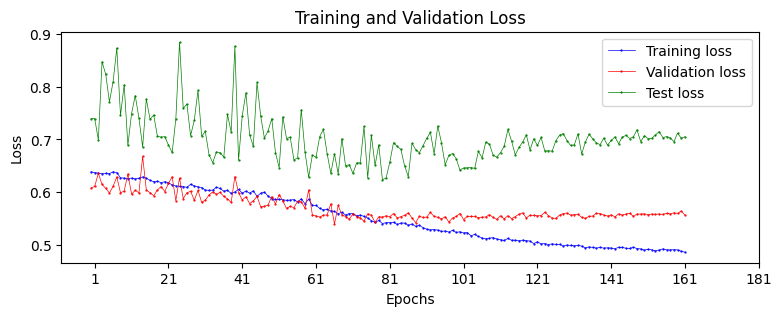

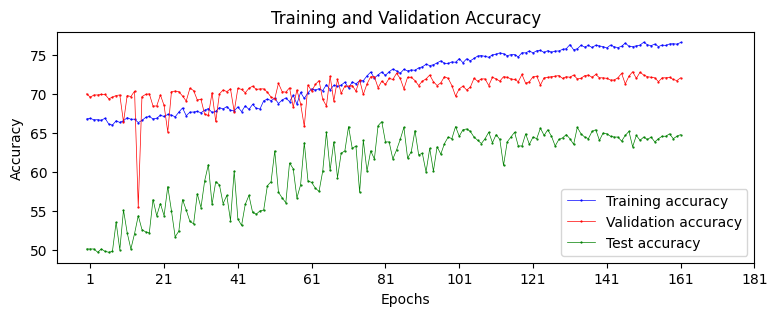


-------epoch:------------ 162  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.2994,  0.9397],
        [ 0.5805, -0.5594],
        [ 0.1305, -0.4783],
        [-0.3597,  1.1745],
        [ 0.0651, -0.4399],
        [ 0.0884, -0.3156],
        [ 2.2620, -2.3301],
        [ 0.9945, -1.3952],
        [ 0.8156, -0.1606],
        [ 0.1573,  0.0230]], device='cuda:2', grad_fn=

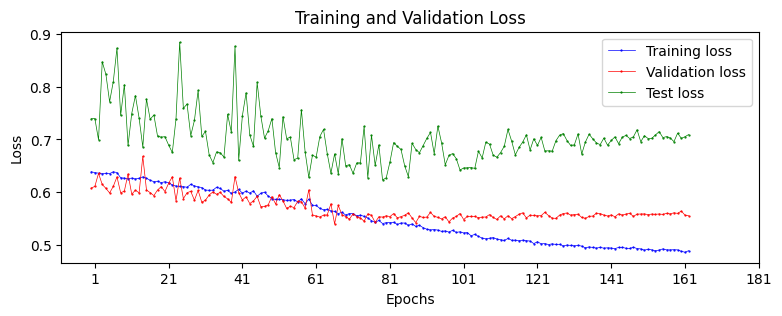

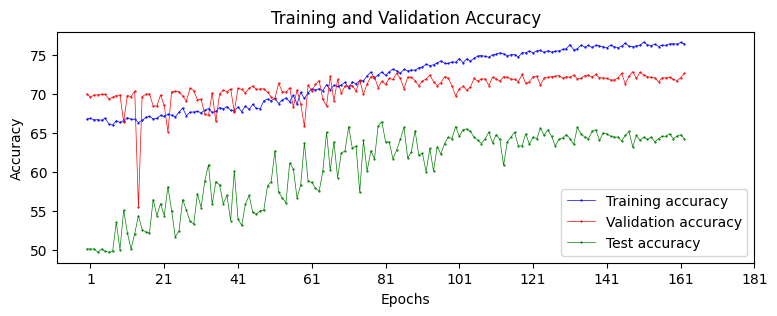


-------epoch:------------ 163  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 6.0270e-01, -7.7963e-01],
        [-3.7899e-01,  4.9377e-01],
        [-7.5809e-01,  1.2145e+00],
        [ 1.6372e-01,  1.4126e-02],
        [-4.8097e-02,  8.3539e-01],
        [-2.0454e-01,  7.1672e-01],
        [ 1.7624e+00, -2.1403e+00],
        [-5.3884e-01,  2.1231e-03],
        [ 2.2926e+

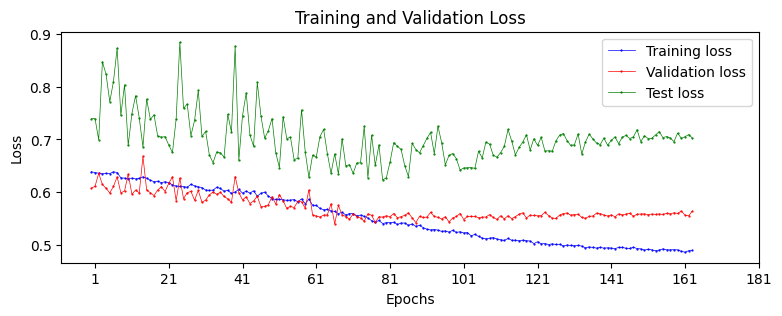

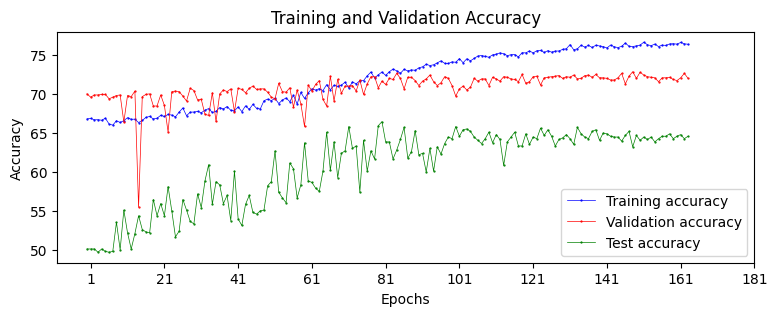


-------epoch:------------ 164  learning_rate 6.172839506172839e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3870, -0.1493],
        [ 0.4376, -1.0474],
        [ 0.4925, -0.7550],
        [-0.1141, -0.1395],
        [ 1.2340, -1.6961],
        [ 0.5929, -1.1135],
        [ 0.7747, -0.6510],
        [ 0.3874, -0.9655],
        [ 0.1673, -0.6453],
        [ 0.9682, -1.2955]], device='cuda:2', grad_fn=

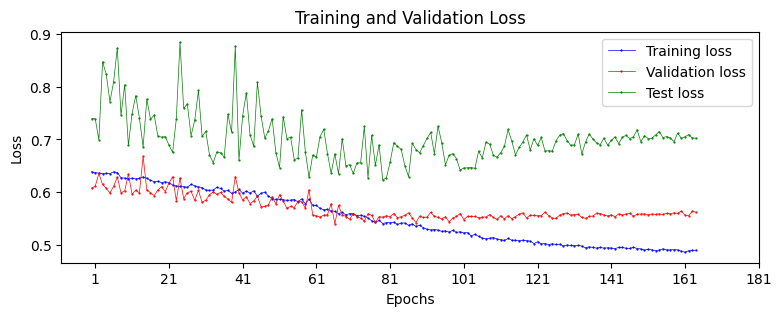

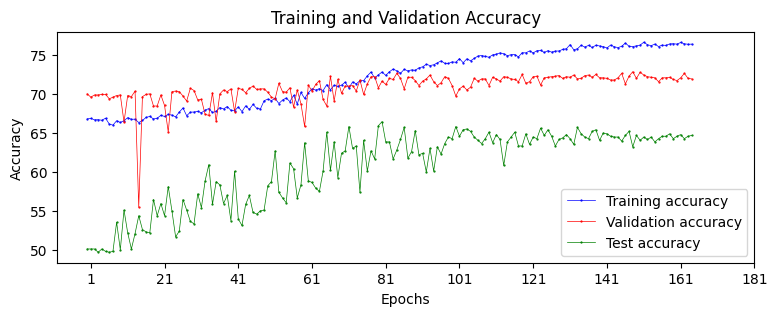

2__
165 3.0864197530864196e-06

-------epoch:------------ 165  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.9281, -1.1824],
        [ 0.7551, -0.5989],
        [ 0.2205,  0.2236],
        [ 1.1380, -1.0376],
        [-0.3028,  0.1787],
        [ 1.0200, -0.8804],
        [-0.8691,  1.5441],
        [ 0.7621, -0.8568],
        [ 0.5535, -0.1028],
        [ 1.4854, -1.6

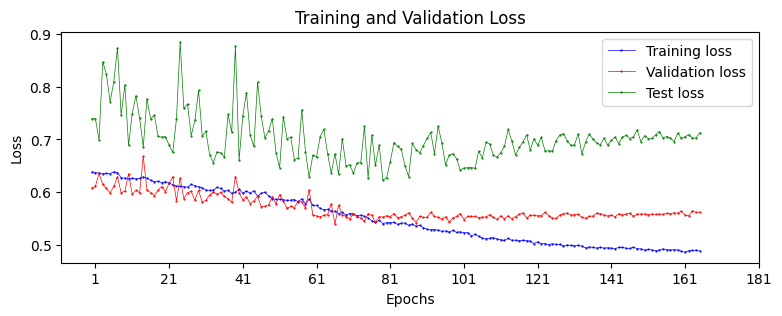

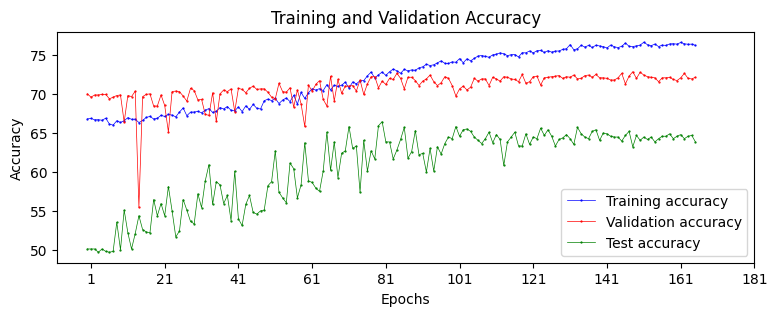


-------epoch:------------ 166  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.1060, -1.3458],
        [ 0.1180,  0.0706],
        [ 1.0817, -2.1208],
        [-0.1839,  0.4449],
        [ 0.8919, -0.9951],
        [ 0.8744, -1.1770],
        [ 1.7387, -2.0120],
        [-0.0150,  0.1829],
        [ 1.1124, -0.3201],
        [ 1.2055, -0.4070]], device='cuda:2', grad_fn

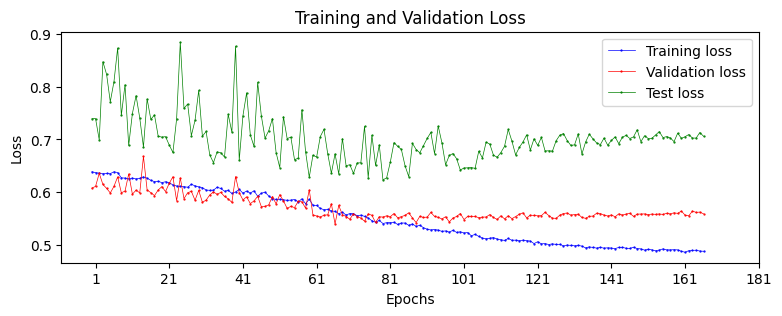

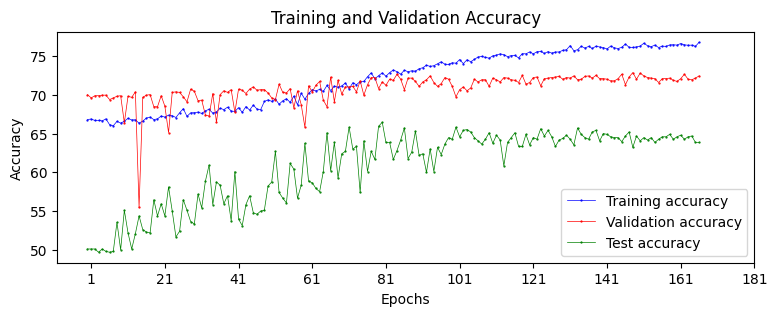


-------epoch:------------ 167  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.0174, -1.1446],
        [ 0.6729, -0.9262],
        [ 1.6052, -1.5196],
        [ 0.9665, -1.0874],
        [ 1.2774, -2.2601],
        [ 1.0015, -1.2720],
        [-0.2003,  0.6197],
        [ 0.7644, -0.0931],
        [ 0.5000, -0.2124],
        [ 0.4561, -1.0823]], device='cuda:2', grad_fn

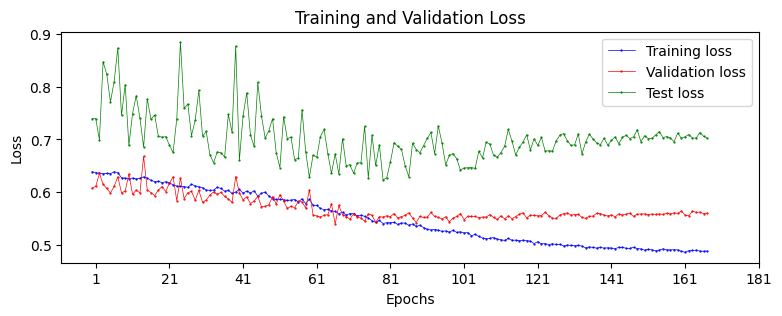

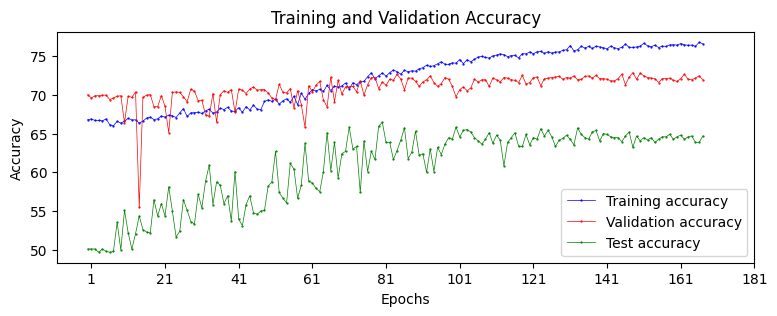


-------epoch:------------ 168  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0698, -0.0373],
        [ 1.3650, -1.3133],
        [-0.1674, -0.0500],
        [ 1.3534, -1.5485],
        [ 0.4318,  0.2441],
        [-0.0234,  0.1395],
        [ 1.2509, -1.7823],
        [ 0.8503, -0.9554],
        [ 0.6843,  0.1109],
        [ 1.5934, -2.6828]], device='cuda:2', grad_fn

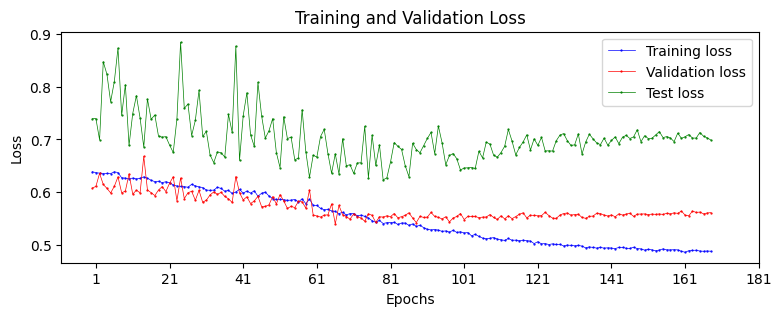

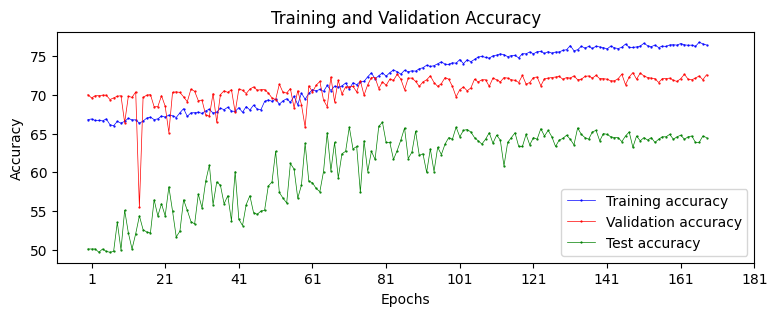


-------epoch:------------ 169  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.2181,  0.1386],
        [ 0.6481, -0.8259],
        [ 0.1506, -0.0507],
        [ 1.9091, -1.4315],
        [ 0.8926, -1.4298],
        [ 0.2217, -0.1754],
        [ 0.2265, -0.2089],
        [ 0.8532, -0.2847],
        [ 0.1152, -0.2791],
        [ 0.5212, -1.1106]], device='cuda:2', grad_fn

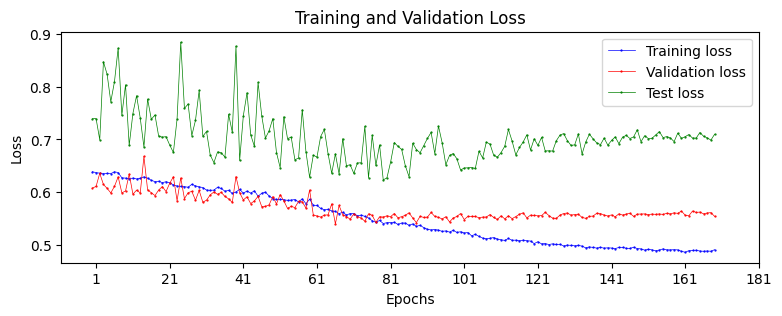

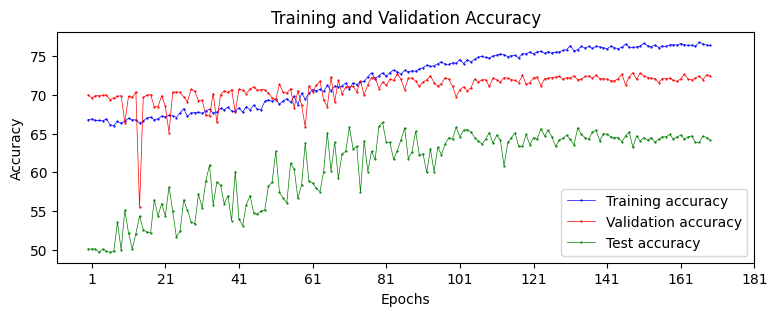


-------epoch:------------ 170  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.3611, -0.2629],
        [ 0.5551, -0.3218],
        [ 1.0540, -0.8253],
        [ 1.1850, -0.6617],
        [-0.5855,  0.7650],
        [ 0.5640, -0.4003],
        [ 0.3305, -1.0894],
        [ 0.5633, -0.3579],
        [-0.0468,  0.4910],
        [-0.1119,  0.8167]], device='cuda:2', grad_fn

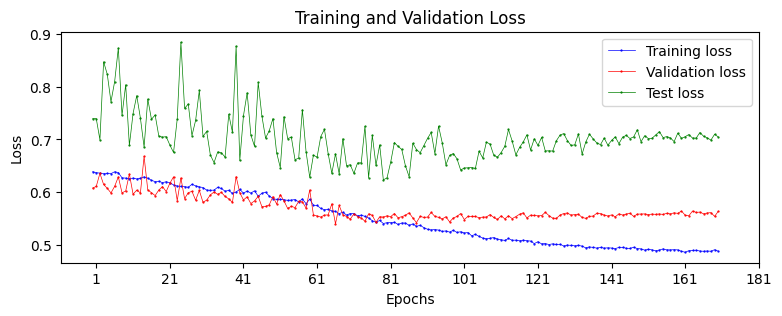

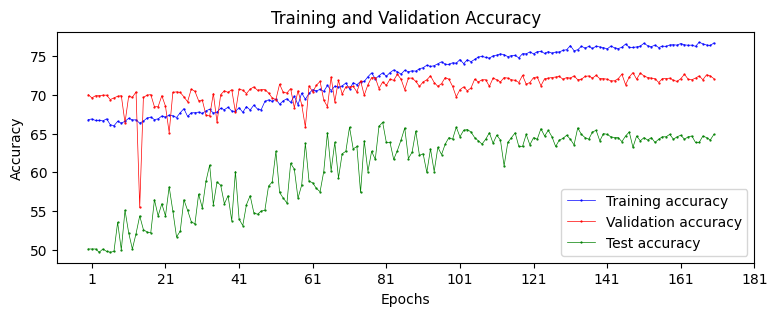


-------epoch:------------ 171  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.6973, -1.2612],
        [ 0.3099, -0.1258],
        [-0.2966,  0.1470],
        [ 0.1312, -0.1661],
        [ 0.2411, -0.4052],
        [ 1.3371, -1.3753],
        [ 1.4548, -2.1940],
        [ 1.2142, -1.3019],
        [ 0.4213, -0.2665],
        [ 2.1573, -2.0853]], device='cuda:2', grad_fn

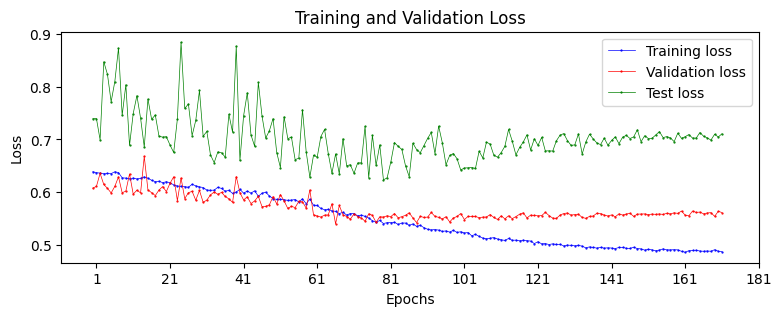

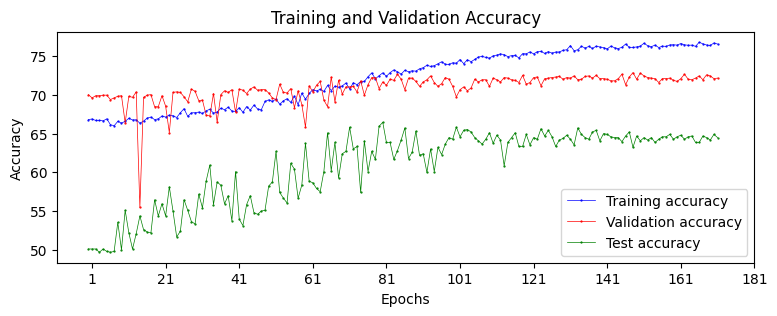


-------epoch:------------ 172  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.0098,  0.9578],
        [ 0.4458, -0.4615],
        [ 0.3463,  0.1020],
        [ 1.2195, -1.7275],
        [ 1.7301, -2.1306],
        [ 1.3774, -1.1543],
        [ 0.6068, -0.3280],
        [ 0.0377,  0.5572],
        [ 0.8484, -1.4372],
        [ 0.3868, -0.5976]], device='cuda:2', grad_fn

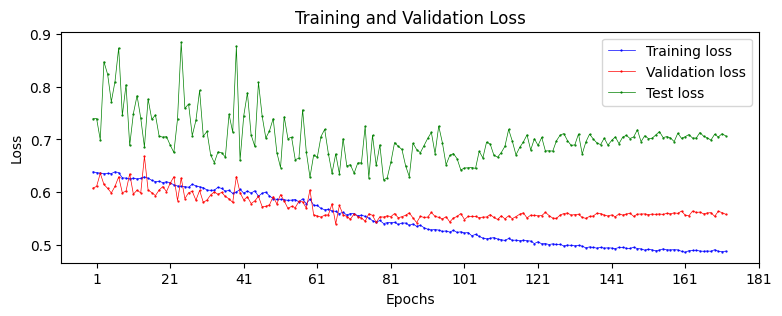

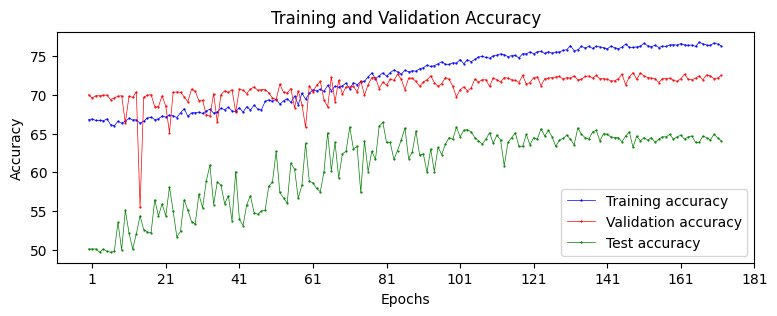


-------epoch:------------ 173  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.8441,  0.1165],
        [ 0.9295, -0.3752],
        [ 0.2870, -0.2620],
        [ 0.7004, -0.6518],
        [-0.7284,  0.8280],
        [ 0.6493,  0.5499],
        [ 1.9689, -1.9164],
        [ 1.1108, -0.1053],
        [-0.1631,  0.1155],
        [ 0.9579, -1.4462]], device='cuda:2', grad_fn

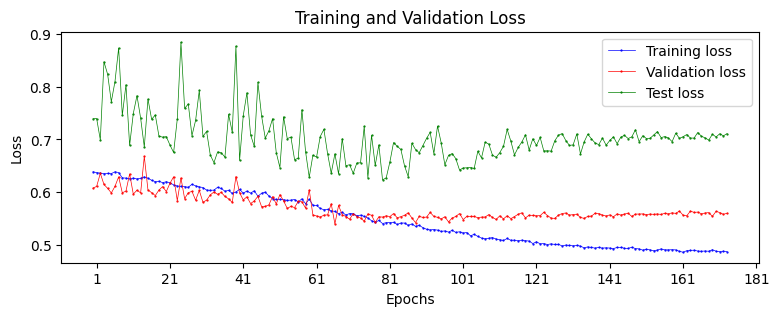

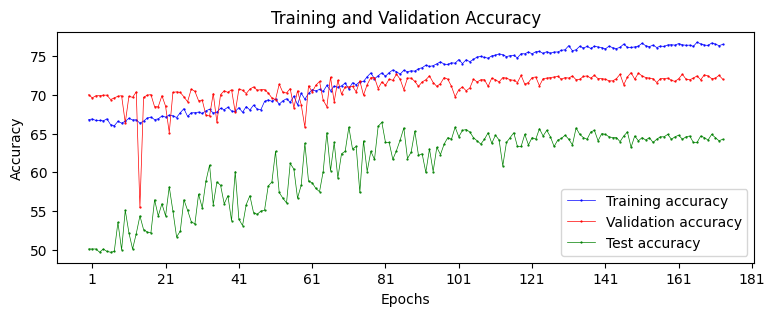


-------epoch:------------ 174  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.4352, -0.7002],
        [-0.5157,  0.1272],
        [ 0.3955, -0.7456],
        [-0.4693,  0.9234],
        [ 0.0613, -0.4092],
        [ 2.4985, -1.7527],
        [ 0.3840, -0.7707],
        [ 1.1861, -0.9649],
        [-0.2863,  0.7875],
        [ 0.3768, -0.2270]], device='cuda:2', grad_fn

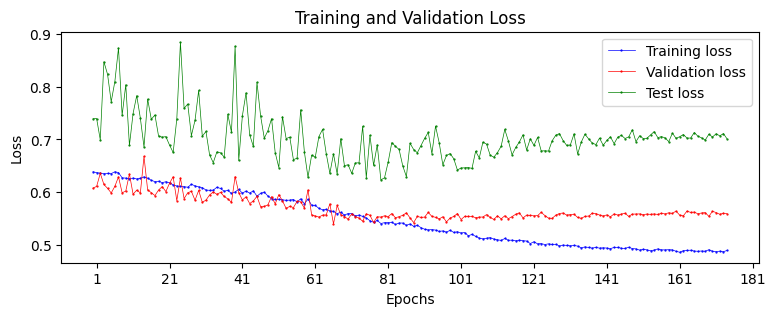

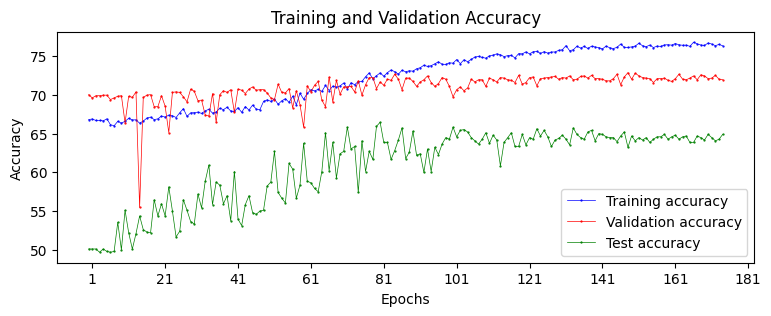


-------epoch:------------ 175  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.2946,  0.4896],
        [ 0.6054, -0.4316],
        [ 0.4233, -0.7854],
        [-0.2965, -0.3111],
        [-0.1077, -0.0395],
        [-0.5547,  0.2836],
        [ 0.1883, -0.5823],
        [ 0.8804, -0.2853],
        [-0.5019,  0.4220],
        [-0.1444, -0.1979]], device='cuda:2', grad_fn

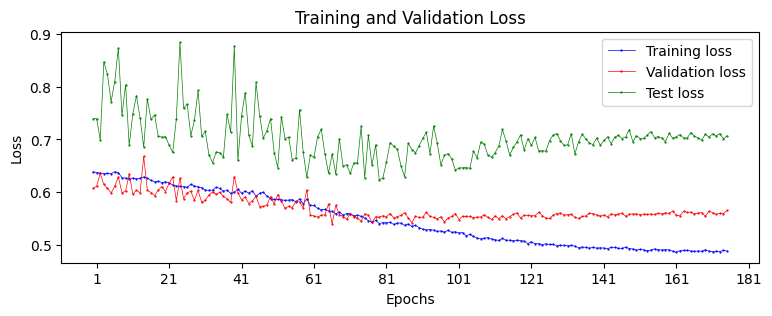

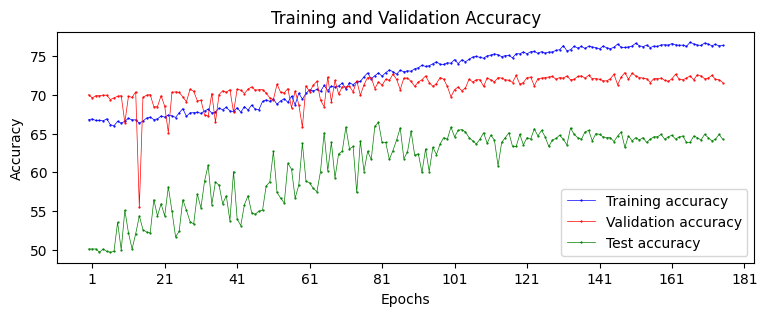


-------epoch:------------ 176  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 1.8951, -2.2726],
        [ 1.0619, -1.1409],
        [ 1.7381, -2.0632],
        [-0.2086,  0.4954],
        [ 1.3920, -1.4996],
        [ 0.7124, -0.8948],
        [ 0.4616,  0.3150],
        [ 0.1470, -0.5434],
        [ 0.4571, -0.7430],
        [ 1.0662, -0.6426]], device='cuda:2', grad_fn

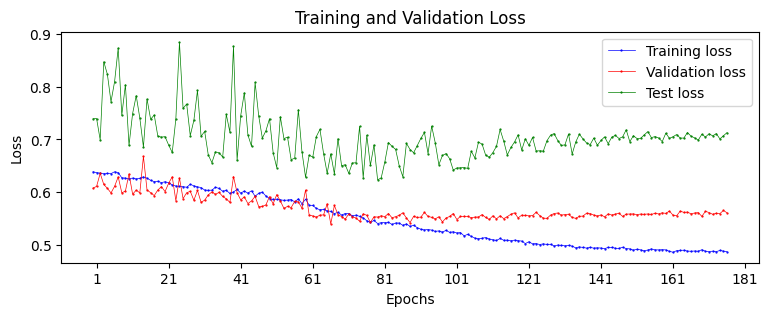

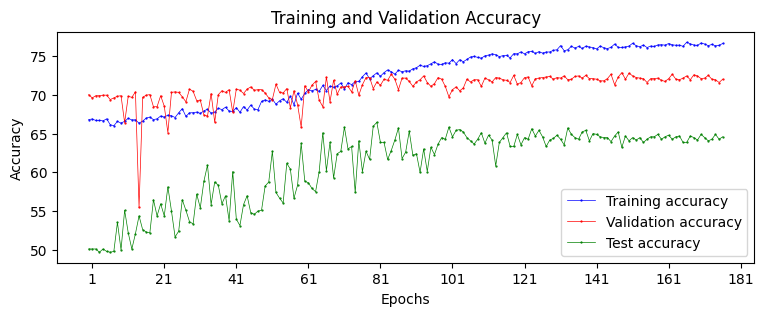


-------epoch:------------ 177  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.1227,  0.6204],
        [-0.8060,  1.2441],
        [ 0.5097, -0.3731],
        [ 1.3741, -1.6106],
        [ 0.6028, -0.7018],
        [ 0.2349, -0.4163],
        [ 0.6704, -1.1555],
        [-0.2510, -0.0657],
        [ 0.7131, -0.8161],
        [ 0.4819, -1.5914]], device='cuda:2', grad_fn

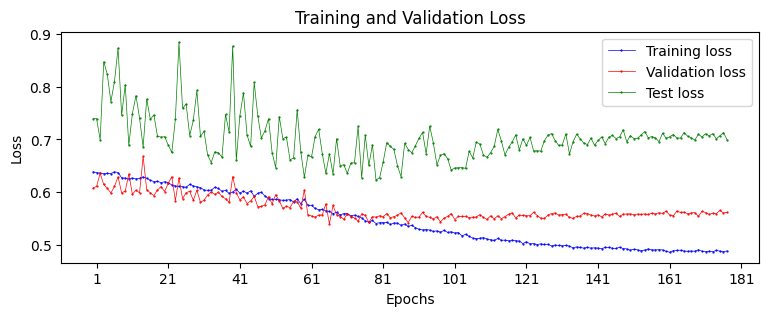

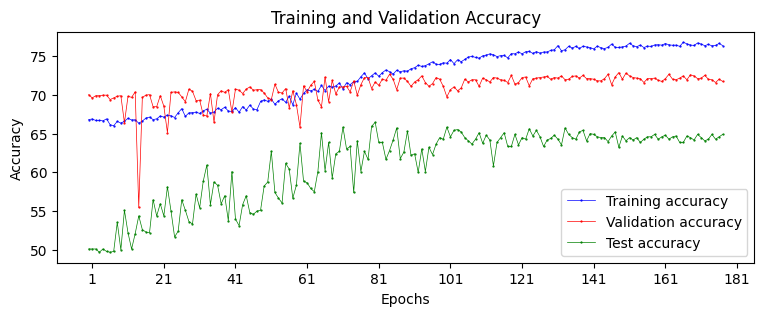


-------epoch:------------ 178  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[ 0.5885, -1.2136],
        [ 0.4215, -1.1055],
        [ 0.7585, -0.8190],
        [-0.3880,  0.9616],
        [ 1.8969, -1.8221],
        [-0.5076,  0.7506],
        [ 1.0824, -0.8905],
        [ 1.1661, -1.2641],
        [-0.0220, -0.6703],
        [ 0.8728, -1.2792]], device='cuda:2', grad_fn

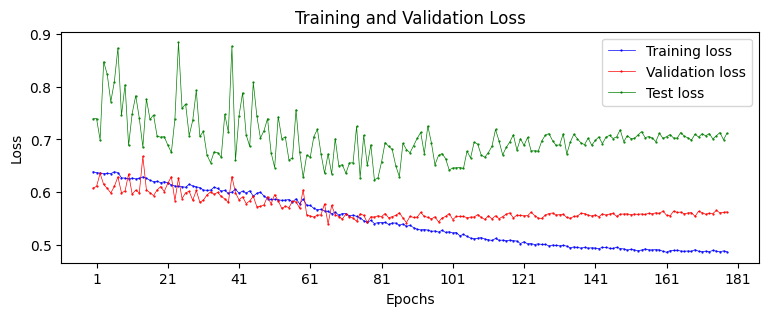

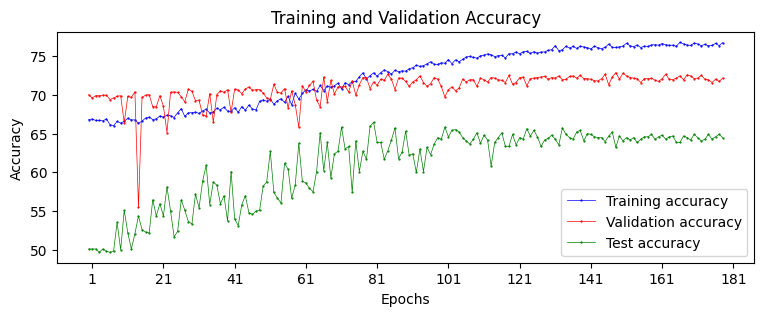


-------epoch:------------ 179  learning_rate 3.0864197530864196e-06
179
178
177
176
175
174
173
172
171
170
169
168
167
166
165
164
163
162
161
160
159
158
157
156
155
154
153
152
151
150
149
148
147
146
145
144
143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1
predictions[:10], tensor([[-0.1209,  0.4576],
        [ 0.0173,  0.6841],
        [ 0.4643, -1.0398],
        [-0.1996,  1.0480],
        [-0.0035,  0.0617],
        [ 1.6465, -1.8878],
        [ 1.0462, -1.3408],
        [ 0.1284, -1.3425],
        [-0.6777,  0.5756],
        [ 0.1143,  0.2757]], device='cuda:2', grad_fn

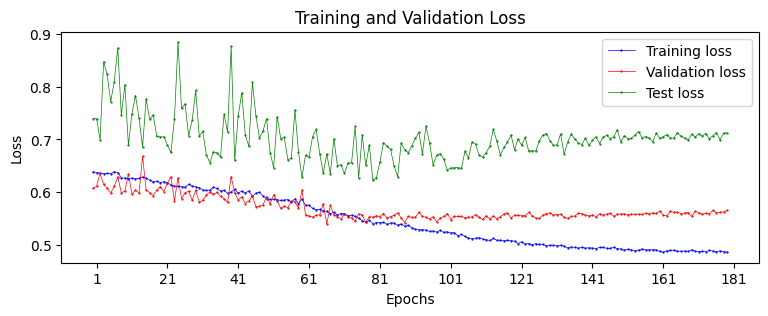

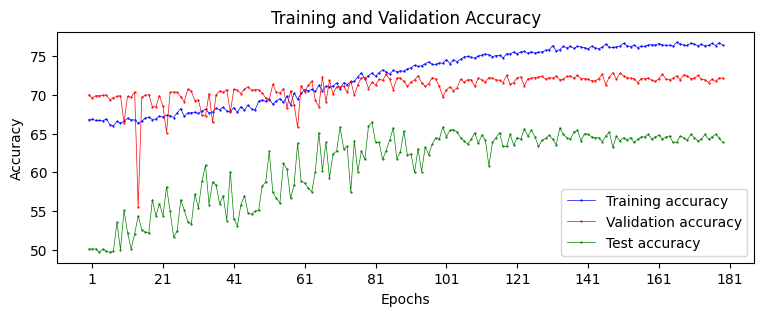

In [20]:
#train with orginal unbalanced data and 0.5 dropout 64batch
mymodel = MyModel_LSTM(41, 2).to(device)
model, optimizer=train(mymodel,train_loader, val_loader,test_loader, learning_rate, epochs, 'model-bilstm-all.ph') 

In [21]:
torch.save({'model': mymodel.state_dict()},'model-bilstm-all.ph')